In [103]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

# Reading the Datasets

In [104]:
# Reading application dataset 
app=pd.read_csv("application_data.csv")

In [105]:
# Reading previous application dataset
prev_app=pd.read_csv("previous_application.csv")

In [106]:
# Observing shape of application dataset
sp1=app.shape
sp1

(307511, 122)

In [107]:
# Observing shape of previous application dataset
sp2=prev_app.shape
sp2

(1670214, 37)

In [108]:
# observing first 5 rows of application dataset
app.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [109]:
# observing first 5 rows of previous application dataset
prev_app.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


# Checking structure of datasets

In [110]:
# observing summary of application dataset
app.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [111]:
# observing summary of previous application dataset
prev_app.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

# Data Cleaning for Application Dataset

## Handling missing values

In [112]:
# Checking null% of Application dataset
null_app=round((app.isnull().sum())*100/sp1[0],0)
null_app

SK_ID_CURR                     0.0
TARGET                         0.0
NAME_CONTRACT_TYPE             0.0
CODE_GENDER                    0.0
FLAG_OWN_CAR                   0.0
                              ... 
AMT_REQ_CREDIT_BUREAU_DAY     14.0
AMT_REQ_CREDIT_BUREAU_WEEK    14.0
AMT_REQ_CREDIT_BUREAU_MON     14.0
AMT_REQ_CREDIT_BUREAU_QRT     14.0
AMT_REQ_CREDIT_BUREAU_YEAR    14.0
Length: 122, dtype: float64

In [113]:
# Filtering the columns from application dataset with null% greater than 40
null_column=null_app[null_app>40]
a=null_column.index


In [114]:
# droping the columns from application dataset with null% greater than 40
columns_to_drop=list(a)
app.drop(columns_to_drop,axis=1,inplace=True)

In [115]:
# Checking the shape of application dataset to check updated no. of columns
app.shape

(307511, 73)

In [116]:
# Filtering out columns with more than 0% of missing values
null_app_updt=(app.isnull().sum())*100/sp1[0]
null_app_updt[null_app_updt>0]

AMT_ANNUITY                    0.003902
AMT_GOODS_PRICE                0.090403
NAME_TYPE_SUITE                0.420148
OCCUPATION_TYPE               31.345545
CNT_FAM_MEMBERS                0.000650
EXT_SOURCE_2                   0.214626
EXT_SOURCE_3                  19.825307
OBS_30_CNT_SOCIAL_CIRCLE       0.332021
DEF_30_CNT_SOCIAL_CIRCLE       0.332021
OBS_60_CNT_SOCIAL_CIRCLE       0.332021
DEF_60_CNT_SOCIAL_CIRCLE       0.332021
DAYS_LAST_PHONE_CHANGE         0.000325
AMT_REQ_CREDIT_BUREAU_HOUR    13.501631
AMT_REQ_CREDIT_BUREAU_DAY     13.501631
AMT_REQ_CREDIT_BUREAU_WEEK    13.501631
AMT_REQ_CREDIT_BUREAU_MON     13.501631
AMT_REQ_CREDIT_BUREAU_QRT     13.501631
AMT_REQ_CREDIT_BUREAU_YEAR    13.501631
dtype: float64

#### Occupation_TYPE
1. **In Occupation _type column 31% of values are missing which is a big no. and it seems to be an important factor for our analysis hence dropping them is not a good option.**
2. **Imputing these large no. of values too doesnt seem to be a good option as it may exaggerate our analysis too much by replacing 31% values with mean or median.Hence I decide to leave the missing values as they are.**

#### For The other variables since the % of missing values is not very high, I decide to impute them with their respective median values for numerical columns and mode for categorical columns

In [117]:
ext_source_median=app["EXT_SOURCE_3"].median()
app["EXT_SOURCE_3"].fillna(ext_source_median,inplace=True)
app["EXT_SOURCE_3"].isnull().sum()

0

In [118]:
ext_source2_median=app["EXT_SOURCE_3"].median()
app["EXT_SOURCE_2"].fillna(ext_source2_median,inplace=True)
app["EXT_SOURCE_2"].isnull().sum()

0

In [119]:
hour_median=app["AMT_REQ_CREDIT_BUREAU_HOUR"].median()
app["AMT_REQ_CREDIT_BUREAU_HOUR"].fillna(hour_median,inplace=True)
app["AMT_REQ_CREDIT_BUREAU_HOUR"].isnull().sum()

0

In [120]:
day_median=app["AMT_REQ_CREDIT_BUREAU_DAY"].median()
app["AMT_REQ_CREDIT_BUREAU_DAY"].fillna(day_median,inplace=True)
app["AMT_REQ_CREDIT_BUREAU_DAY"].isnull().sum()

0

In [121]:
week_median=app["AMT_REQ_CREDIT_BUREAU_WEEK"].median()
app["AMT_REQ_CREDIT_BUREAU_WEEK"].fillna(week_median,inplace=True)
app["AMT_REQ_CREDIT_BUREAU_WEEK"].isnull().sum()

0

In [122]:
mon_median=app["AMT_REQ_CREDIT_BUREAU_MON"].median()
app["AMT_REQ_CREDIT_BUREAU_MON"].fillna(mon_median,inplace=True)
app["AMT_REQ_CREDIT_BUREAU_MON"].isnull().sum()

0

In [123]:
qrt_median=app["AMT_REQ_CREDIT_BUREAU_QRT"].median()
app["AMT_REQ_CREDIT_BUREAU_QRT"].fillna(qrt_median,inplace=True)
app["AMT_REQ_CREDIT_BUREAU_QRT"].isnull().sum()


0

In [124]:
year_median=app["AMT_REQ_CREDIT_BUREAU_YEAR"].median()
app["AMT_REQ_CREDIT_BUREAU_YEAR"].fillna(year_median,inplace=True)
app["AMT_REQ_CREDIT_BUREAU_YEAR"].isnull().sum()

0

In [125]:
goods_price_median=app["AMT_GOODS_PRICE"].median()
app["AMT_GOODS_PRICE"].fillna(goods_price_median,inplace=True)
app["AMT_GOODS_PRICE"].isnull().sum()

0

In [126]:
annuity_miss_median=app["AMT_ANNUITY"].median()
app["AMT_ANNUITY"].fillna(annuity_miss_median,inplace=True)
app["AMT_ANNUITY"].isnull().sum()

0

In [127]:
obs_30_median=app["OBS_30_CNT_SOCIAL_CIRCLE"].median()
app["OBS_30_CNT_SOCIAL_CIRCLE"].fillna(obs_30_median,inplace=True)
app["OBS_30_CNT_SOCIAL_CIRCLE"].isnull().sum()

0

In [128]:
obs_30_median=app["OBS_30_CNT_SOCIAL_CIRCLE"].median()
app["OBS_30_CNT_SOCIAL_CIRCLE"].fillna(obs_30_median,inplace=True)
app["OBS_30_CNT_SOCIAL_CIRCLE"].isnull().sum()

0

In [129]:
def_30_median=app["DEF_30_CNT_SOCIAL_CIRCLE"].median()
app["DEF_30_CNT_SOCIAL_CIRCLE"].fillna(def_30_median,inplace=True)
app["DEF_30_CNT_SOCIAL_CIRCLE"].isnull().sum()

0

In [130]:
obs_60_median=app["OBS_60_CNT_SOCIAL_CIRCLE"].median()
app["OBS_60_CNT_SOCIAL_CIRCLE"].fillna(obs_60_median,inplace=True)
app["OBS_60_CNT_SOCIAL_CIRCLE"].isnull().sum()

0

In [131]:
def_60_median=app["DEF_60_CNT_SOCIAL_CIRCLE"].median()
app["DEF_60_CNT_SOCIAL_CIRCLE"].fillna(def_60_median,inplace=True)
app["DEF_60_CNT_SOCIAL_CIRCLE"].isnull().sum()

0

In [132]:
suite_mode=app["NAME_TYPE_SUITE"].mode()
print(suite_mode)
app["NAME_TYPE_SUITE"].fillna("Unaccompanied",inplace=True)
app["NAME_TYPE_SUITE"].isnull().sum()

0    Unaccompanied
Name: NAME_TYPE_SUITE, dtype: object


0

In [133]:
fam_median=app["CNT_FAM_MEMBERS"].median()
app["CNT_FAM_MEMBERS"].fillna(fam_median,inplace=True)
app["CNT_FAM_MEMBERS"].isnull().sum()

0

In [134]:
fam_median=app["CNT_FAM_MEMBERS"].median()
app["CNT_FAM_MEMBERS"].fillna(fam_median,inplace=True)
app["CNT_FAM_MEMBERS"].isnull().sum()

0

In [135]:
phone_median=app["DAYS_LAST_PHONE_CHANGE"].median()
app["DAYS_LAST_PHONE_CHANGE"].fillna(phone_median,inplace=True)
app["DAYS_LAST_PHONE_CHANGE"].isnull().sum()

0

In [137]:
# Rechecking the null% of dataset
null_app_updt=(app.isnull().sum())*100/sp1[0]
null_app_updt[null_app_updt>0]

OCCUPATION_TYPE    31.345545
dtype: float64

## Checking the gender and organization column for any error

#### Checking CODE_GENDER Column

In [138]:
app["CODE_GENDER"].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

In [139]:
# replacing XNA with Female as majority are female and no. of XNA are less hence wont affect our analysis
app["CODE_GENDER"].replace(to_replace="XNA",value="F",inplace=True)

#### Checking ORGANIZATION_TYPE Column

In [140]:
app["ORGANIZATION_TYPE"].value_counts()

Business Entity Type 3    67992
XNA                       55374
Self-employed             38412
Other                     16683
Medicine                  11193
Business Entity Type 2    10553
Government                10404
School                     8893
Trade: type 7              7831
Kindergarten               6880
Construction               6721
Business Entity Type 1     5984
Transport: type 4          5398
Trade: type 3              3492
Industry: type 9           3368
Industry: type 3           3278
Security                   3247
Housing                    2958
Industry: type 11          2704
Military                   2634
Bank                       2507
Agriculture                2454
Police                     2341
Transport: type 2          2204
Postal                     2157
Security Ministries        1974
Trade: type 2              1900
Restaurant                 1811
Services                   1575
University                 1327
Industry: type 7           1307
Transpor

**Since no. of XNAs are too high and imputing or droping them will affect the analysis, I prefer leaving them as they are and consider XNAs as missing values.**

In [141]:
app.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_C

#### **Dropping columns which seem not important for analysis**

In [142]:
drop_columns=['FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL','REG_REGION_NOT_WORK_REGION','LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY','REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY','OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3','FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6','FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9','FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12','FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15','FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18','FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21','REGION_POPULATION_RELATIVE','DAYS_REGISTRATION', 'DAYS_ID_PUBLISH','WEEKDAY_APPR_PROCESS_START','HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION','EXT_SOURCE_2', 'EXT_SOURCE_3']
app.drop(drop_columns,axis=1,inplace=True)

In [143]:
app.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'ORGANIZATION_TYPE',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object')

## Bifurcating Categorical and Numerical Columns

In [144]:
# bifurcating coloumns to categorical and numerical data types
# approach: All object data types are for sure categorical and all float are for sure numerical. Out of rest left we can use 
        # nunique() function and observe the no. of unique values of each column. The columns with small no. of unique values 
        # can be considered categorical. In this case columns with less than or equal to 3 considered categorical. Rest are
        # considerd numerical
# filtering object data types and storing in variable x
x=app.loc[:,app.dtypes==np.object]
# filtering float data types and storing variable in y
y=app.loc[:,app.dtypes==np.float64]
# filtering out data which is niether object nor float and storing in variable z
z=app.loc[:,(app.dtypes!=np.object) & (app.dtypes!=np.float64)]
# observing no. of unique values in z
j=z.nunique()
# filtering out columns with no. of unique values less than or equal to 3 and storing in variable k
k=j[j<=3]
# filtering out columns with no. of unique values greater than 3 and storing in variable m
m=j[j>3]
# converting x and k to lists and concating both and storing concated list to app_categ_data
l1=x.columns.tolist()
l2=k.index.tolist()
l1.extend(l2)
app_categ_data=l1
# converting y and m to lists and concating both and storing concated list to app_num_data
l3=y.columns.tolist()
l4=m.index.tolist()
l3.extend(l4)
app_num_data=l3
# removing SK_ID_CURR column from numerical columns since it is ID
app_num_data.remove("SK_ID_CURR")
app_ID_data=["SK_ID_CURR"]
# verifying if all columns are bifurcated
print(len(app_categ_data)+len(app_num_data)+len(app_ID_data))
print(app.shape[1])
# printing list of categorical, contineous and ID columns of application dataset
print("Categorical Data =" ,app_categ_data)
print(" Numerical Data =" , app_num_data)
print(" ID Coloumns=", app_ID_data)

29
29
Categorical Data = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'TARGET', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY']
 Numerical Data = ['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'CNT_FAM_MEMBERS', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'CNT_CHILDREN', 'DAYS_BIRTH', 'DAYS_EMPLOYED']
 ID Coloumns= ['SK_ID_CURR']


## Checking Outliers

### Plotting boxplots for numerical columns

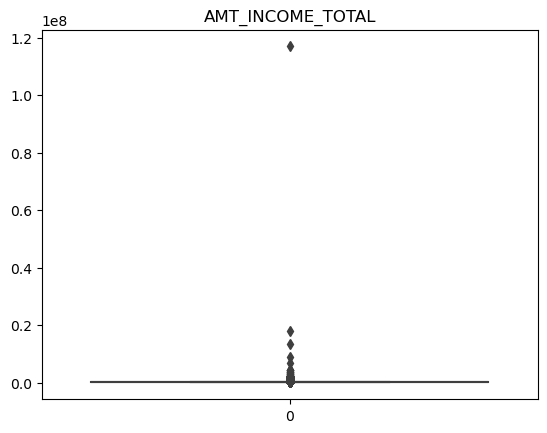

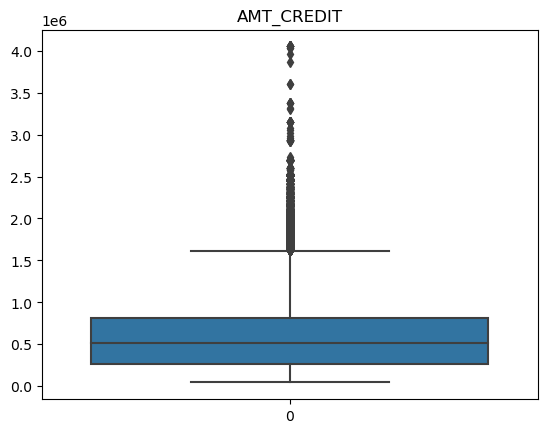

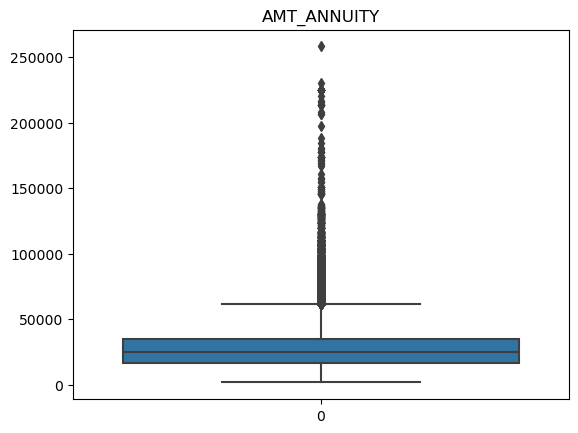

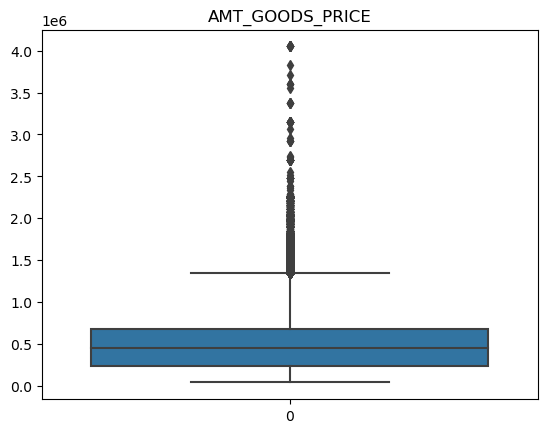

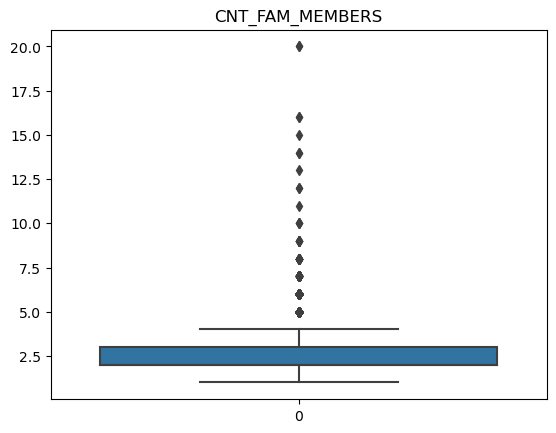

...

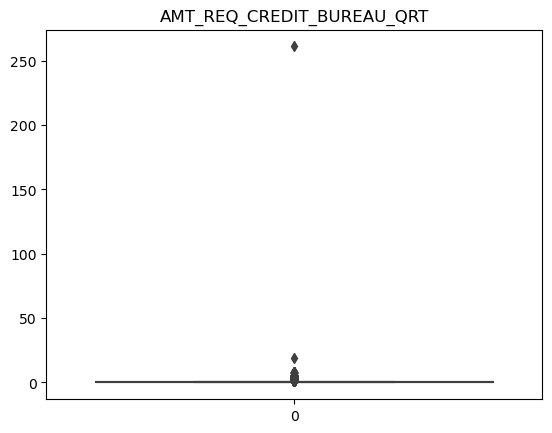

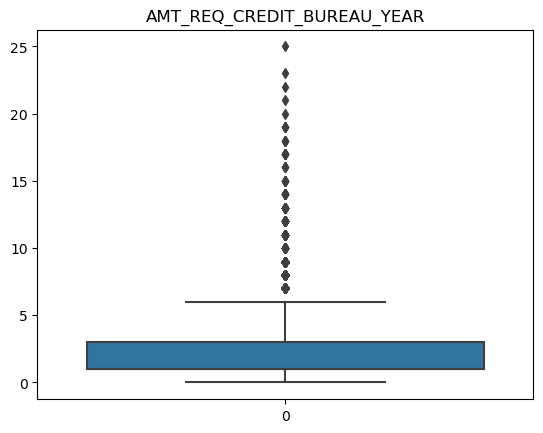

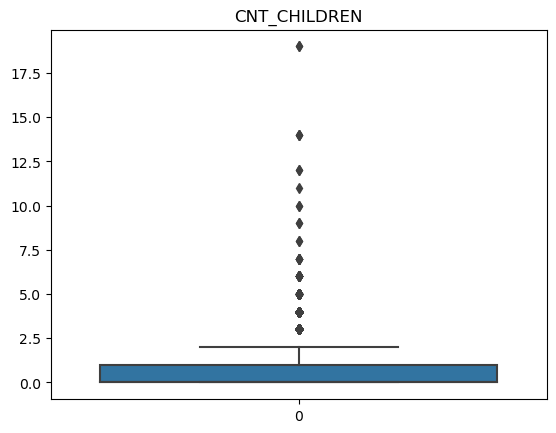

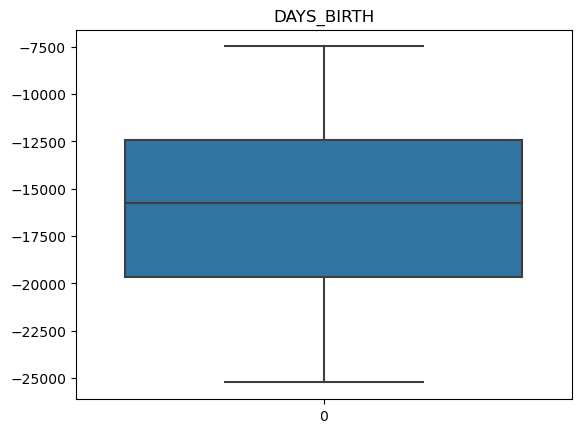

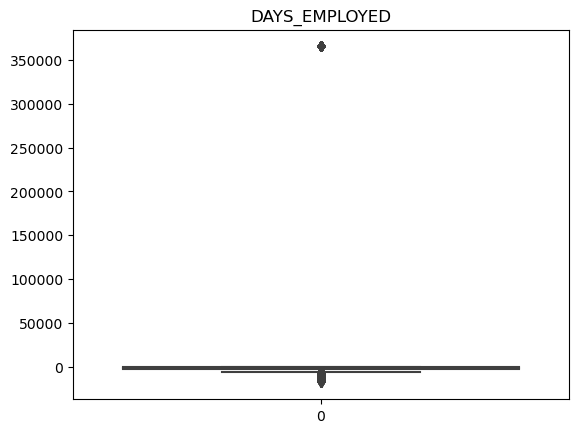

In [145]:
for i in app_num_data:
    sns.boxplot(app[i])
    plt.title(i)
    plt.show()

##### Checking for outliers in AMT_INCOME_TOTAL Column

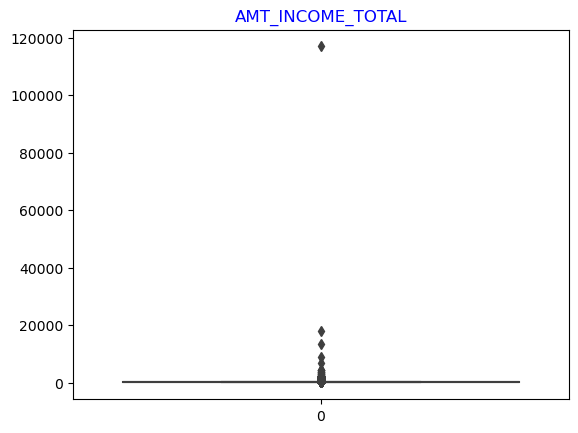

In [146]:
sns.boxplot(app["AMT_INCOME_TOTAL"]/1000)
plt.title("AMT_INCOME_TOTAL",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
plt.show()

In [147]:
app["AMT_INCOME_TOTAL"].describe()

count    3.075110e+05
mean     1.687979e+05
std      2.371231e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64

In [148]:
app["AMT_INCOME_TOTAL"].quantile([0.5,0.75,0.9,0.95,0.99])

0.50    147150.0
0.75    202500.0
0.90    270000.0
0.95    337500.0
0.99    472500.0
Name: AMT_INCOME_TOTAL, dtype: float64

**from box plot its clear max.value is an outlier with an outaregeous value which might skew our analysis, hence dropping it**

In [149]:
app=app[app["AMT_INCOME_TOTAL"]!=117000000]
app["AMT_INCOME_TOTAL"].describe()

count    3.075100e+05
mean     1.684180e+05
std      1.088118e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.800009e+07
Name: AMT_INCOME_TOTAL, dtype: float64

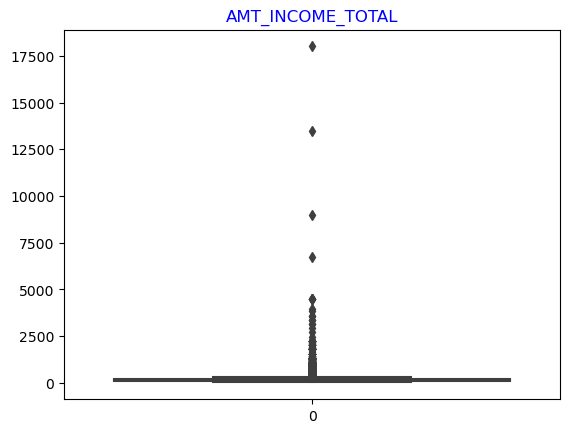

In [150]:
# Checking the box plot again
sns.boxplot(app["AMT_INCOME_TOTAL"]/1000)
plt.title("AMT_INCOME_TOTAL",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
plt.show()

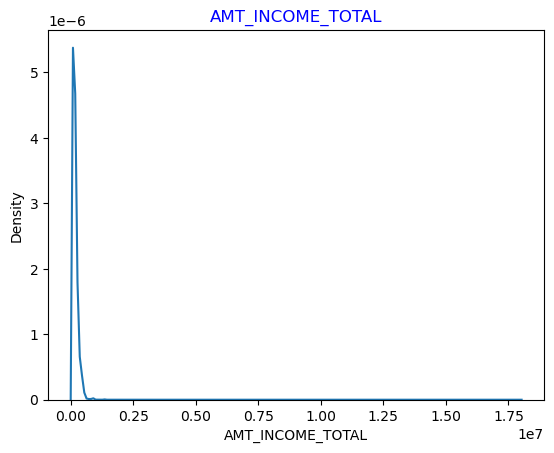

In [151]:
# checking kde plot
sns.kdeplot(data=app["AMT_INCOME_TOTAL"])
plt.title("AMT_INCOME_TOTAL",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
plt.show()

kde plot seems to be very skewed because of outliers

In [152]:
# Checking for values above 99%
app[app["AMT_INCOME_TOTAL"]>472500].shape

(3013, 29)

**Since the no. of rows above 99% is big, droping or caping this no. of columns dont seem a good decision**

In [153]:
app[app["AMT_INCOME_TOTAL"]>1000000].shape

(249, 29)

In [154]:
# Filtering out data above 1000000 and checking the median
x_inc=app[app["AMT_INCOME_TOTAL"]>1000000]
print(x_inc["AMT_INCOME_TOTAL"].median())

1350000.0


In [155]:
#capping the values above 1000000 with median of these values
app.loc[(app["AMT_INCOME_TOTAL"]>1000000),"AMT_INCOME_TOTAL"]=1350000

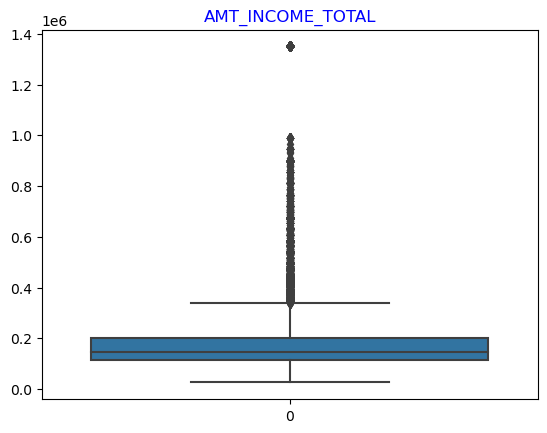

In [156]:
#Checking the box plot again
sns.boxplot(app["AMT_INCOME_TOTAL"])
plt.title("AMT_INCOME_TOTAL",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
plt.show()

In [157]:
app["AMT_INCOME_TOTAL"].describe()

count    3.075100e+05
mean     1.681387e+05
std      9.568079e+04
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.350000e+06
Name: AMT_INCOME_TOTAL, dtype: float64

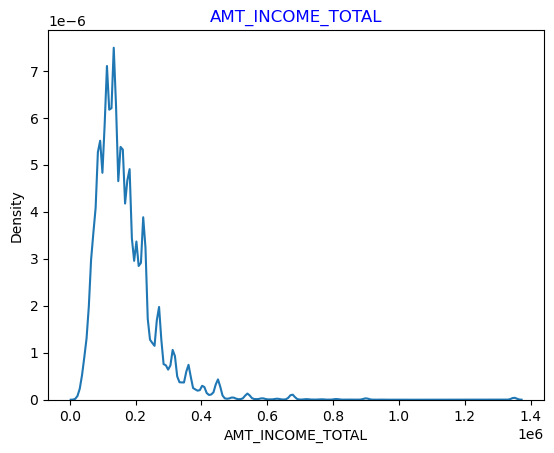

In [158]:
# Checking the kde plot again
sns.kdeplot(data=app["AMT_INCOME_TOTAL"])
plt.title("AMT_INCOME_TOTAL",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
plt.show()

Hence the kde plot seems to be much less skewed than the previous one.

##### Checking for outliers in AMT_CREDIT column


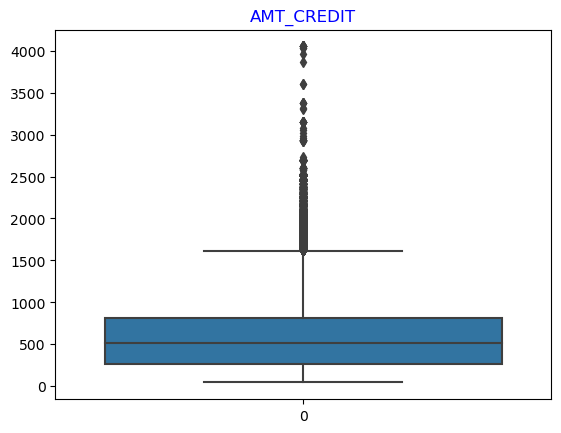

In [159]:
sns.boxplot(app["AMT_CREDIT"]/1000)
plt.title("AMT_CREDIT",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
plt.show()

In [160]:
app["AMT_CREDIT"].describe()

count    3.075100e+05
mean     5.990261e+05
std      4.024914e+05
min      4.500000e+04
25%      2.700000e+05
50%      5.135310e+05
75%      8.086500e+05
max      4.050000e+06
Name: AMT_CREDIT, dtype: float64

In [161]:
app["AMT_CREDIT"].quantile([0.5,0.7,0.9,0.95,0.99,0.999])

0.500     513531.0
0.700     755190.0
0.900    1133748.0
0.950    1350000.0
0.990    1854000.0
0.999    2517300.0
Name: AMT_CREDIT, dtype: float64

**Since there is a very big differnce between 99.9% and the max. value hence I decide to cap the outliers**

In [162]:
# Filtering out data above 99.9% value and checking the median
cond_credit=app[app["AMT_CREDIT"] > 2517300.0]
print(cond_credit["AMT_CREDIT"].median())

2695500.0


In [163]:
# capping the outliers to median of values above 99.9% 
app.loc[(app["AMT_CREDIT"]>2517300),"AMT_CREDIT"]=2695500

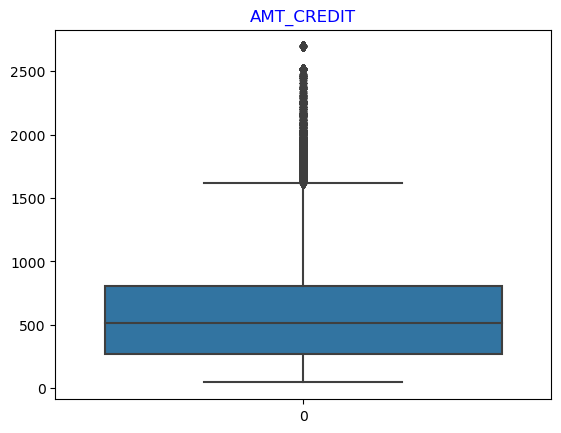

In [164]:
#Checking the box-plot
sns.boxplot(app["AMT_CREDIT"]/1000)
plt.title("AMT_CREDIT",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
plt.show()

**Since there is a big differnce between 99.9% and the maximum values but there are good no. of values above it, I decided to cap the values above 99.9% to median of values above 99.9% i.e. 2695500**

##### Checking for outliers in AMT_ANNUITY column

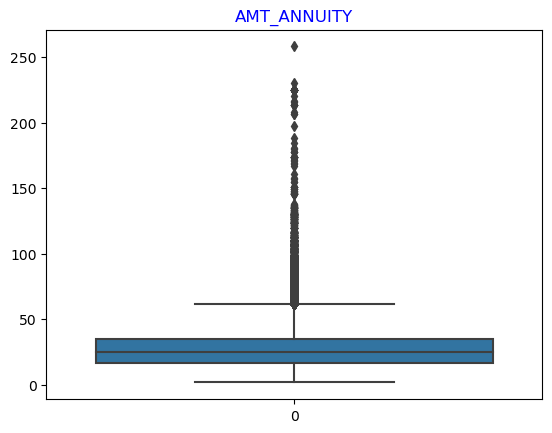

In [165]:
sns.boxplot(app["AMT_ANNUITY"]/1000)
plt.title("AMT_ANNUITY",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
plt.show()

In [166]:
app["AMT_ANNUITY"].describe()

count    307510.000000
mean      27108.490813
std       14493.484538
min        1615.500000
25%       16524.000000
50%       24903.000000
75%       34596.000000
max      258025.500000
Name: AMT_ANNUITY, dtype: float64

In [167]:
app["AMT_ANNUITY"].quantile([0.5,0.7,0.9,0.95,0.99,0.999])

0.500     24903.0
0.700     32004.0
0.900     45954.0
0.950     53325.0
0.990     70006.5
0.999    110047.5
Name: AMT_ANNUITY, dtype: float64

In [168]:
# Filtering out data above 150000 and checking the median
cond_annuity=app[app["AMT_ANNUITY"] > 150000.0]
print(cond_annuity["AMT_ANNUITY"].median())

207339.75


In [169]:
# capping the outliers to median of values above 150000
app.loc[(app["AMT_ANNUITY"]>150000.0),"AMT_ANNUITY"]=207339

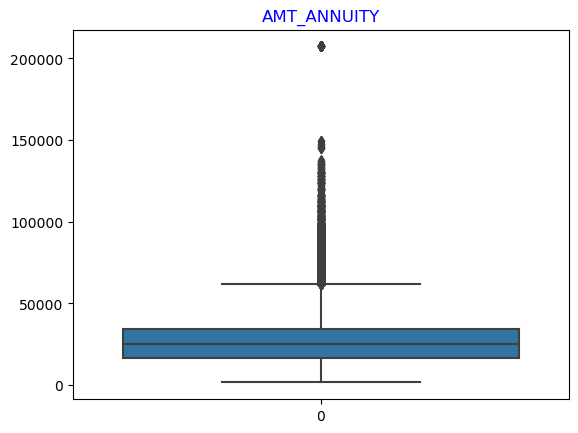

In [170]:
#Checking the box plot again
sns.boxplot(app["AMT_ANNUITY"])
plt.title("AMT_ANNUITY",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
plt.show()

**Since there is a big differnce between 99.9% and the maximum values but there are good no. of values above it, I decided to cap the values above 99.9% to median of values above 99.9% i.e. 207339**

##### Checking for outliers in AMT_GOODS_PRICE column

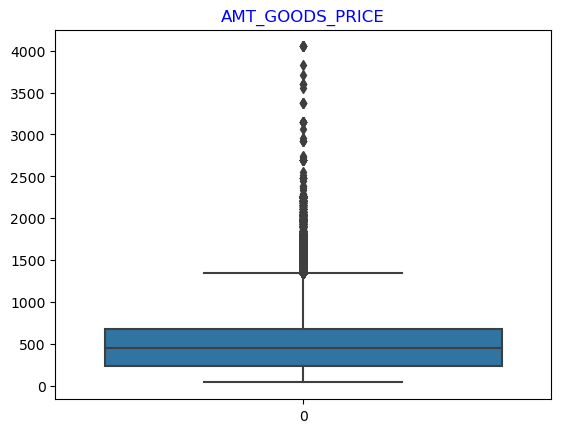

In [171]:
sns.boxplot(app["AMT_GOODS_PRICE"]/1000)
plt.title("AMT_GOODS_PRICE",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
plt.show()

In [172]:
app["AMT_GOODS_PRICE"].describe()

count    3.075100e+05
mean     5.383166e+05
std      3.692896e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.795000e+05
max      4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64

In [173]:
app["AMT_GOODS_PRICE"].quantile([0.5,0.7,0.9,0.95,0.99,0.999])

0.500     450000.0
0.700     675000.0
0.900    1093500.0
0.950    1305000.0
0.990    1800000.0
0.999    2250000.0
Name: AMT_GOODS_PRICE, dtype: float64

In [174]:
#Filtering out data greater than 99.9% and finding out median of it
cond_goods= app[app["AMT_GOODS_PRICE"]>2250000]
print(cond_goods["AMT_GOODS_PRICE"].median())

2520000.0


In [175]:
# capping the outliers to median of values above 99.9% 
app.loc[(app["AMT_GOODS_PRICE"]>2250000.0),"AMT_GOODS_PRICE"]=2520000.0

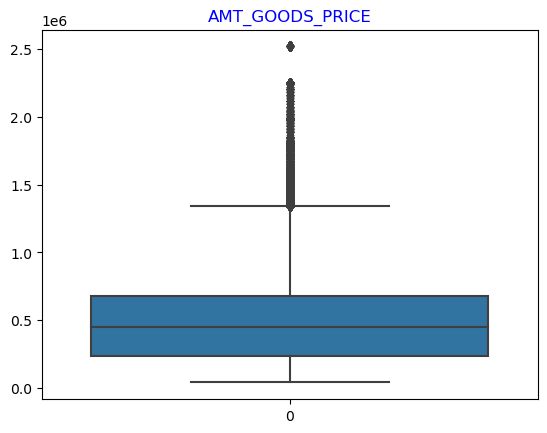

In [176]:
#Checking the box plot again
sns.boxplot(app["AMT_GOODS_PRICE"])
plt.title("AMT_GOODS_PRICE",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
plt.show()

**Since there is a big differnce between 99.9% and the maximum values but there are good no. of values above it, I decided to cap the values above 99.9% to median of values above 99.9% i.e. 2520000**

##### Checking for outliers in DAYS_EMPLOYED column

In [177]:
# Converting days employed to years employed and creating a new column years employed
app["YEARS_EMPLOYED"]=app["DAYS_EMPLOYED"].apply(lambda x:int(abs(x)/365))

In [178]:
app["YEARS_EMPLOYED"].unique()
app[app["YEARS_EMPLOYED"]==1000].shape

(55374, 30)

**Since 1000 years of experience is practically impossible but there are a large no. of rows having this outlier, I decide to not drop this outlier and rather will bin it out**

##### Checking for outliers in DAYS_BIRTH column

In [179]:
# Converting days birth to years 
app["DAYS_BIRTH"]=app["DAYS_BIRTH"].apply(lambda x:round(int(abs(x)/365),0))

In [180]:
app["DAYS_BIRTH"].unique()

array([25, 45, 52, 54, 46, 37, 51, 55, 39, 27, 36, 38, 23, 35, 26, 48, 31,
       50, 40, 30, 68, 43, 28, 41, 32, 33, 47, 57, 65, 44, 64, 21, 59, 49,
       56, 62, 53, 42, 29, 67, 63, 61, 58, 60, 34, 22, 24, 66, 69, 20],
      dtype=int64)

**There seems to be no outlier in Days_birth column**

### Binning of DAYS_BIRTH & AMT_INCOME_TOTAL

#### Binning of DAYS_BIRTH

In [181]:
app["AGE_GROUP"]=pd.cut(x=app["DAYS_BIRTH"],bins=[0,30,60,90,],labels=["below 30","30-60","60+"])
app.head(5)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,REGION_RATING_CLIENT_W_CITY,ORGANIZATION_TYPE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_EMPLOYED,AGE_GROUP
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,2,Business Entity Type 3,0.0,0.0,0.0,0.0,0.0,1.0,1,below 30
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,1,School,0.0,0.0,0.0,0.0,0.0,0.0,3,30-60
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,2,Government,0.0,0.0,0.0,0.0,0.0,0.0,0,30-60
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,2,Business Entity Type 3,0.0,0.0,0.0,0.0,0.0,1.0,8,30-60
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,2,Religion,0.0,0.0,0.0,0.0,0.0,0.0,8,30-60


#### Binning of YEARS_EMPLOYED

In [182]:
app["YEARS_EMPLOYED"]=pd.cut(x=app["YEARS_EMPLOYED"],bins=[0,10,20,30,40,50,1000],labels=["0-10","10-20","20-30","30-40","40-50","50+"])
app["YEARS_EMPLOYED"].unique()

['0-10', NaN, '50+', '20-30', '10-20', '30-40', '40-50']
Categories (6, object): ['0-10' < '10-20' < '20-30' < '30-40' < '40-50' < '50+']

**I have binned years of experience and have binned out the outlier of 1000 years to 50+ label**

#### Binning of AMT_INCOME_TOTAL

In [183]:
bins_i=[0,50000,100000,150000,200000,250000,300000,350000,400000,450000]
labels_i=["0-50k","50-100k","110-150k","150-200k","250-300k","300-350k","350-400k","400-450k","450k+"]
app["AMT_INCOME_RANGE"]=pd.cut(x=app["AMT_INCOME_TOTAL"],bins=bins_i,labels=labels_i)

In [184]:
app.dtypes.unique()

array([dtype('int64'), dtype('O'), dtype('float64'),
       CategoricalDtype(categories=['0-10', '10-20', '20-30', '30-40', '40-50', '50+'], ordered=True),
       CategoricalDtype(categories=['below 30', '30-60', '60+'], ordered=True),
       CategoricalDtype(categories=['0-50k', '50-100k', '110-150k', '150-200k', '250-300k',
                         '300-350k', '350-400k', '400-450k', '450k+'],
       , ordered=True)                                                                     ],
      dtype=object)

### Bifurcating Categorical and Numerical Columns

In [185]:
# bifurcating coloumns to categorical and numerical data types
# approach: All object data types are for sure categorical and all float are for sure numerical. Out of rest left we can use 
        # nunique() function and observe the no. of unique values of each column. The columns with small no. of unique values 
        # can be considered categorical. In this case columns with less than or equal to 3 considered categorical. Rest are
        # considerd numerical
# filtering object data types and storing in variable x
x=app.loc[:,app.dtypes==np.object]
# filtering float data types and storing variable in y
y=app.loc[:,app.dtypes==np.float64]
# filtering out data which is niether object nor float and storing in variable z
z=app.loc[:,(app.dtypes!=np.object) & (app.dtypes!=np.float64)]
# observing no. of unique values in z
j=z.nunique()
# filtering out columns with no. of unique values less than or equal to 3 and storing in variable k
k=j[j<=5]
# filtering out columns with no. of unique values greater than 3 and storing in variable m
m=j[j>5]
# converting x and k to lists and concating both and storing concated list to app_categ_data
l1=x.columns.tolist()
l2=k.index.tolist()
l1.extend(l2)
app_categ_data=l1
# converting y and m to lists and concating both and storing concated list to app_num_data
l3=y.columns.tolist()
l4=m.index.tolist()
l3.extend(l4)
app_num_data=l3
# removing SK_ID_CURR column from numerical columns since it is ID
app_num_data.remove("SK_ID_CURR")
app_ID_data=["SK_ID_CURR"]
# removing AMT_INCOME_RANGE and YEARS_EMPLOYED column from numerical column since they are categorical column
app_num_data.remove("AMT_INCOME_RANGE")
app_num_data.remove("YEARS_EMPLOYED")
i1=["AMT_INCOME_RANGE","YEARS_EMPLOYED"]
app_categ_data.extend(i1)
# verifying if all columns are bifurcated
print(len(app_categ_data)+len(app_num_data)+len(app_ID_data))
print(app.shape[1])
# printing list of categorical, contineous and ID columns of application dataset
print("Categorical Data =" ,app_categ_data)
print(" Numerical Data =" , app_num_data)
print(" ID Coloumns=", app_ID_data)

32
32
Categorical Data = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'TARGET', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'AGE_GROUP', 'AMT_INCOME_RANGE', 'YEARS_EMPLOYED']
 Numerical Data = ['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'CNT_FAM_MEMBERS', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'CNT_CHILDREN', 'DAYS_BIRTH', 'DAYS_EMPLOYED']
 ID Coloumns= ['SK_ID_CURR']


### Checking for Data Imbalance in application data

In [186]:
# Calculating the percentage of Applicants without defaults
app_target_0_per= round(len(app[app["TARGET"]==0])*100/len(app),2)
# Calculating the percentage of applicants with defaults
app_target_1_per= round(len(app[app["TARGET"]==1])*100/len(app),2)
print(app_target_0_per)
print(app_target_1_per)

91.93
8.07


**It is quite clear from above calculation that there is a huge difference between defaulter and non-defaulter applicants  . Hence there is a huge data imbalance in the dataset. Therefore we need to divide the dataset into 2 with one dataset for applicants without payment difficulties (Target=0) and other with payment difficulties (Target=1)**

In [187]:
# Creating dataframe of Non-defaulter applicants 
app_target0=app[app["TARGET"]==0]
app_target0

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,ORGANIZATION_TYPE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_EMPLOYED,AGE_GROUP,AMT_INCOME_RANGE
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,School,0.0,0.0,0.0,0.0,0.0,0.0,0-10,30-60,300-350k
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,Government,0.0,0.0,0.0,0.0,0.0,0.0,NaN,30-60,50-100k
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,Business Entity Type 3,0.0,0.0,0.0,0.0,0.0,1.0,0-10,30-60,110-150k
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,Religion,0.0,0.0,0.0,0.0,0.0,0.0,0-10,30-60,110-150k
5,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,...,Other,0.0,0.0,0.0,0.0,1.0,1.0,0-10,30-60,50-100k
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307505,456249,0,Cash loans,F,N,Y,0,112500.0,225000.0,22050.0,...,XNA,0.0,0.0,0.0,2.0,0.0,0.0,50+,60+,110-150k
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,Services,0.0,0.0,0.0,0.0,0.0,1.0,NaN,below 30,150-200k
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,XNA,0.0,0.0,0.0,0.0,0.0,1.0,50+,30-60,50-100k
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,School,1.0,0.0,0.0,1.0,0.0,1.0,20-30,30-60,150-200k


In [188]:
# Creating dataframe of Defaulter applicants
app_target1=app[app["TARGET"]==1]
app_target1

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,ORGANIZATION_TYPE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_EMPLOYED,AGE_GROUP,AMT_INCOME_RANGE
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,Business Entity Type 3,0.0,0.0,0.0,0.0,0.0,1.0,0-10,below 30,250-300k
26,100031,1,Cash loans,F,N,Y,0,112500.0,979992.0,27076.5,...,Business Entity Type 3,0.0,0.0,0.0,0.0,2.0,2.0,0-10,30-60,110-150k
40,100047,1,Cash loans,M,N,Y,0,202500.0,1193580.0,35028.0,...,Business Entity Type 3,0.0,0.0,0.0,2.0,0.0,4.0,0-10,30-60,250-300k
42,100049,1,Cash loans,F,N,N,0,135000.0,288873.0,16258.5,...,Self-employed,0.0,0.0,0.0,0.0,0.0,2.0,0-10,30-60,110-150k
81,100096,1,Cash loans,F,N,Y,0,81000.0,252000.0,14593.5,...,XNA,0.0,0.0,0.0,0.0,0.0,0.0,50+,60+,50-100k
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307448,456186,1,Cash loans,M,N,N,1,207000.0,450000.0,32746.5,...,Business Entity Type 3,0.0,0.0,0.0,0.0,0.0,2.0,0-10,below 30,250-300k
307475,456215,1,Cash loans,F,N,N,1,144000.0,1303200.0,46809.0,...,Construction,0.0,0.0,0.0,1.0,0.0,6.0,0-10,30-60,110-150k
307481,456225,1,Cash loans,M,N,Y,0,225000.0,297000.0,19975.5,...,Business Entity Type 3,0.0,0.0,0.0,0.0,0.0,3.0,0-10,30-60,250-300k
307489,456233,1,Cash loans,F,N,Y,0,225000.0,521280.0,23089.5,...,Business Entity Type 3,0.0,0.0,0.0,0.0,1.0,2.0,NaN,30-60,250-300k


# Univariate Analysis Of Application Dataset

## Univariate analysis of Categorical data

NAME_CONTRACT_TYPE


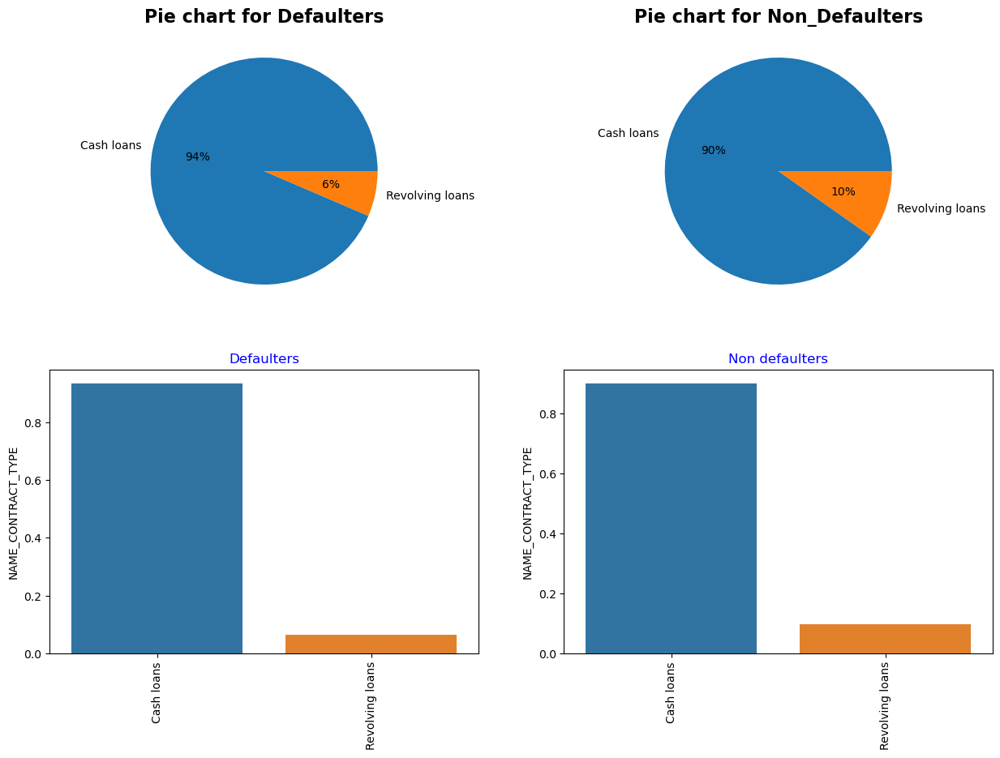

<Figure size 640x480 with 0 Axes>

CODE_GENDER


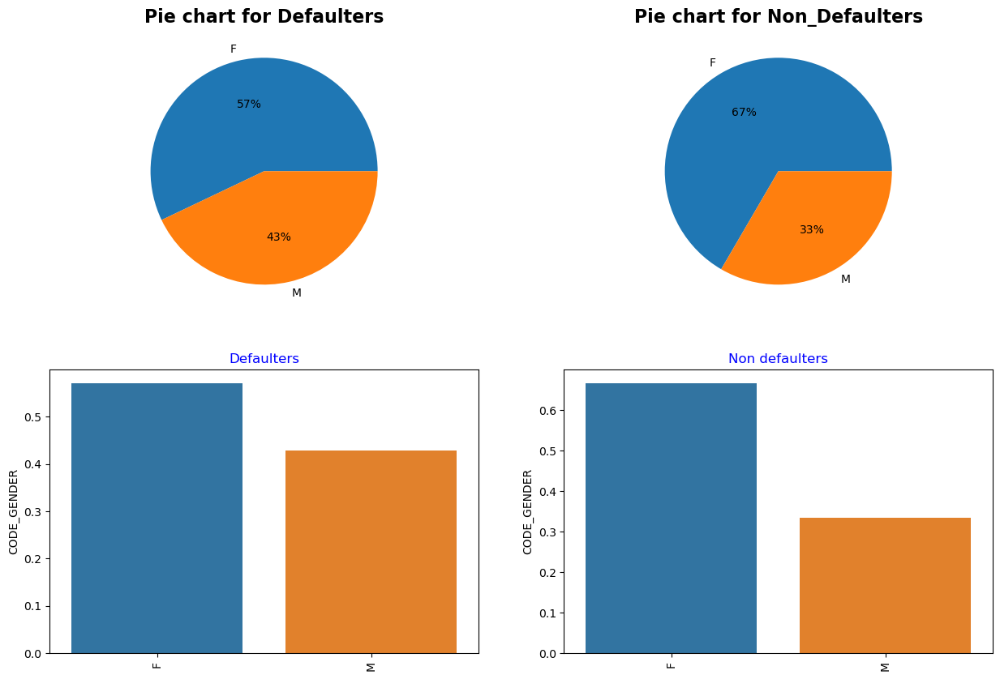

<Figure size 640x480 with 0 Axes>

FLAG_OWN_CAR


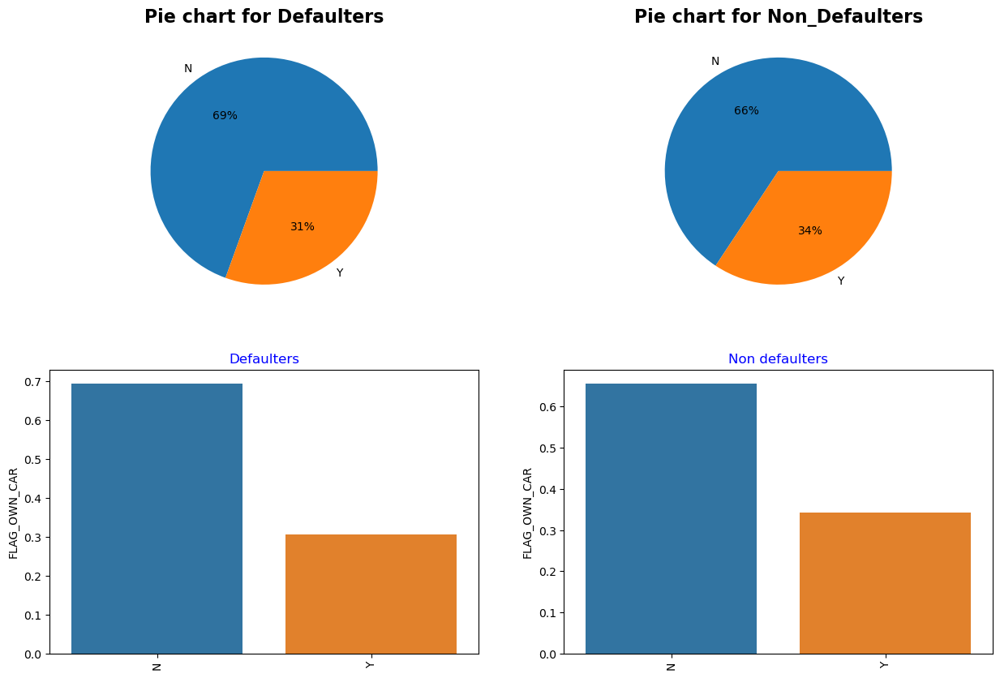

<Figure size 640x480 with 0 Axes>

FLAG_OWN_REALTY


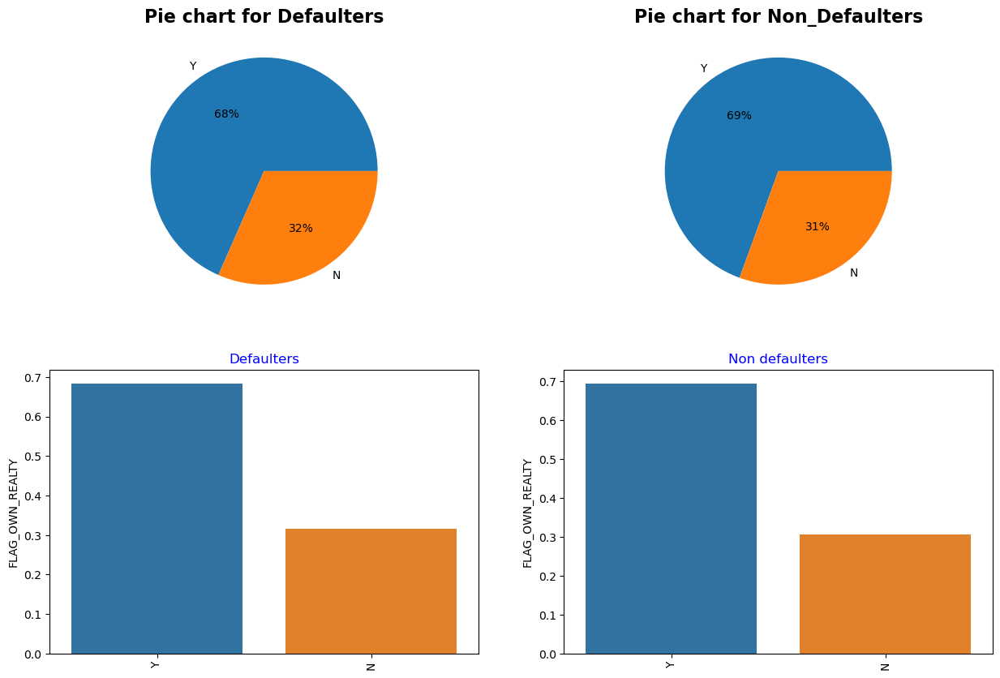

<Figure size 640x480 with 0 Axes>

NAME_TYPE_SUITE


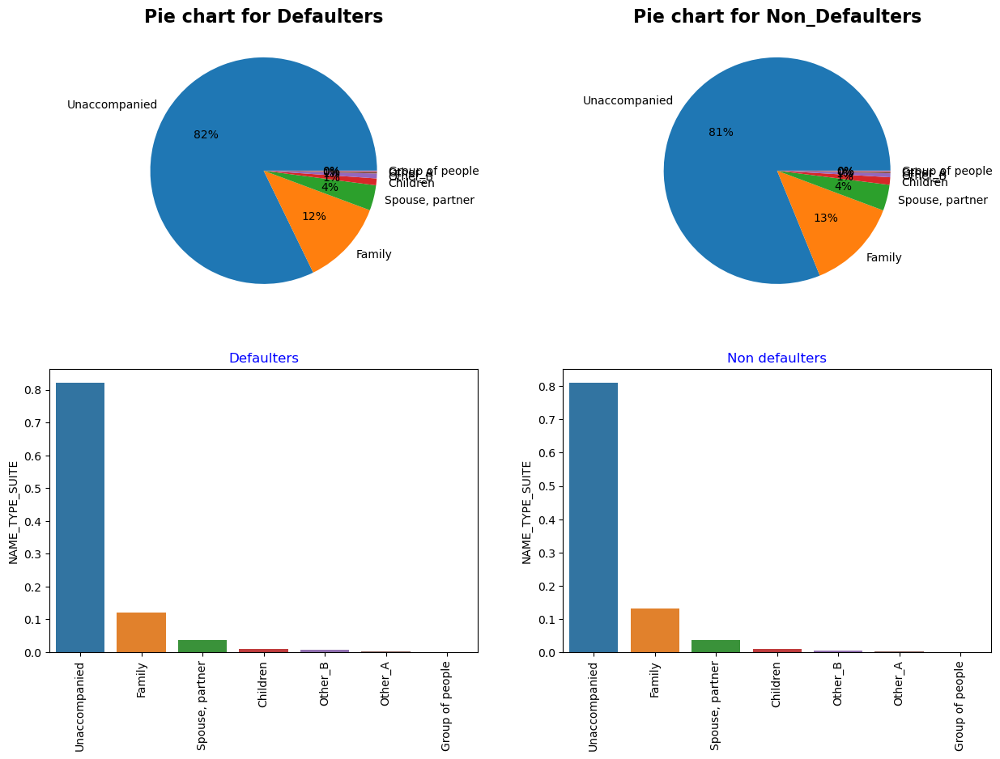

<Figure size 640x480 with 0 Axes>

NAME_INCOME_TYPE


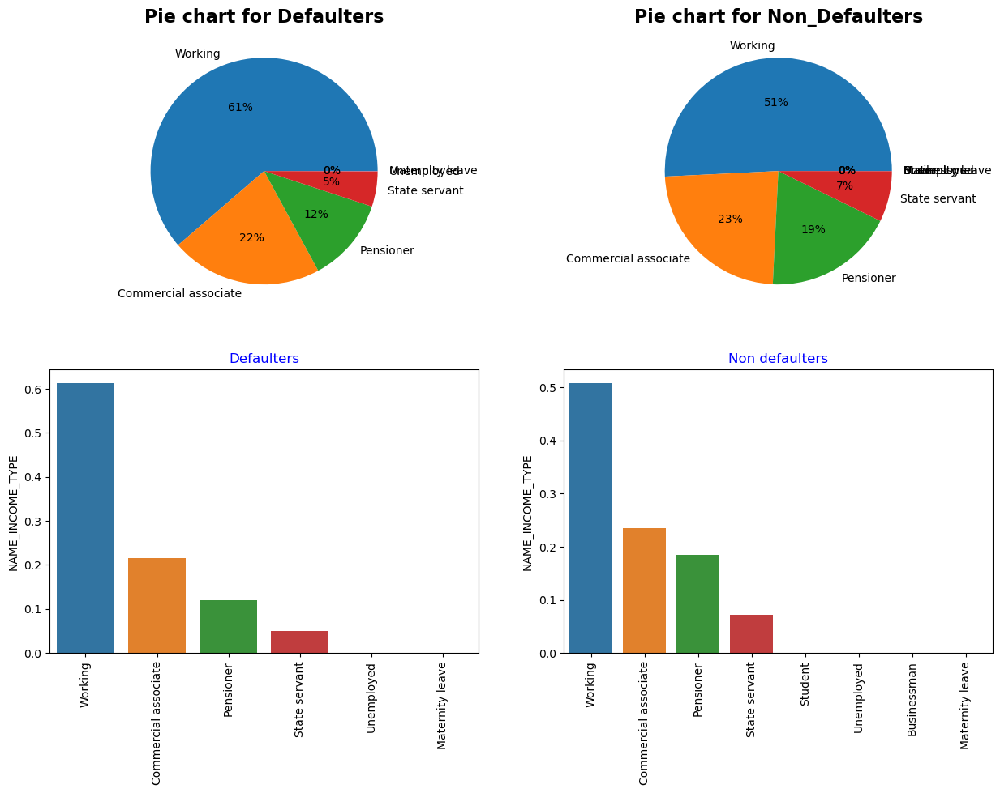

<Figure size 640x480 with 0 Axes>

NAME_EDUCATION_TYPE


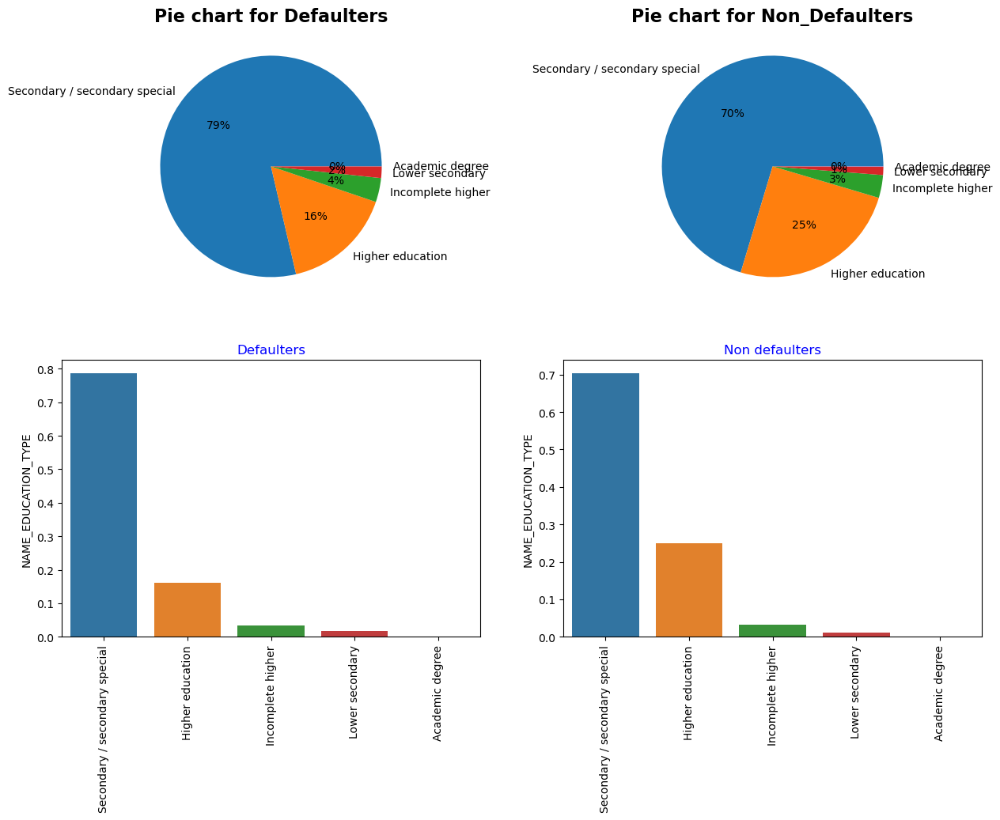

<Figure size 640x480 with 0 Axes>

NAME_FAMILY_STATUS


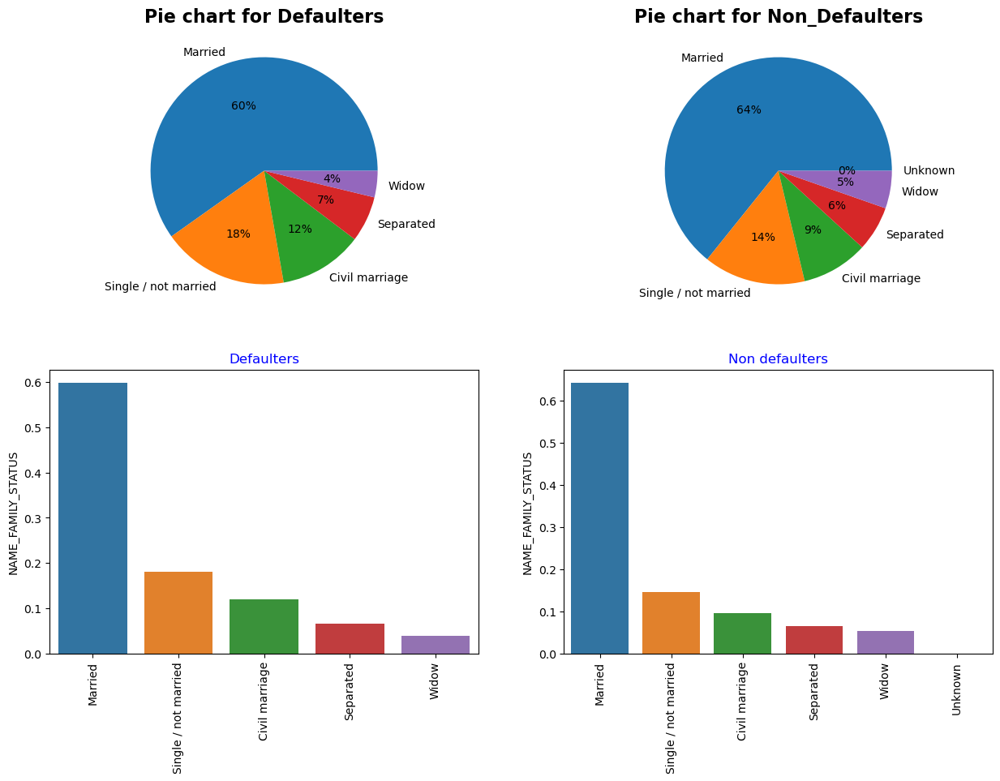

<Figure size 640x480 with 0 Axes>

NAME_HOUSING_TYPE


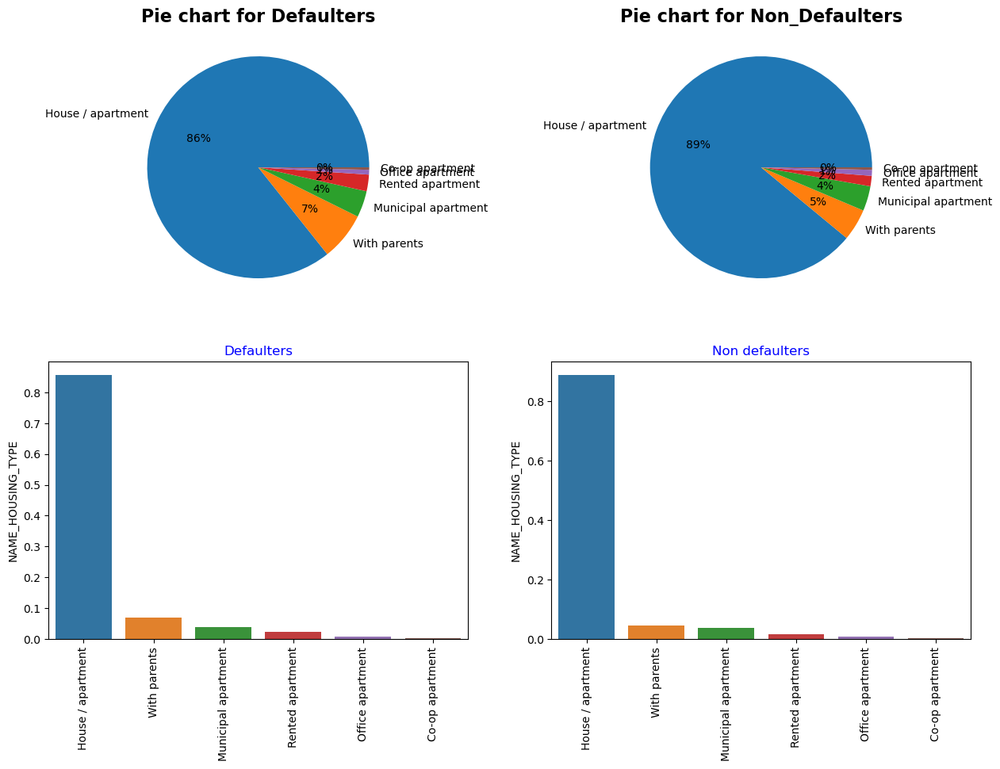

<Figure size 640x480 with 0 Axes>

OCCUPATION_TYPE


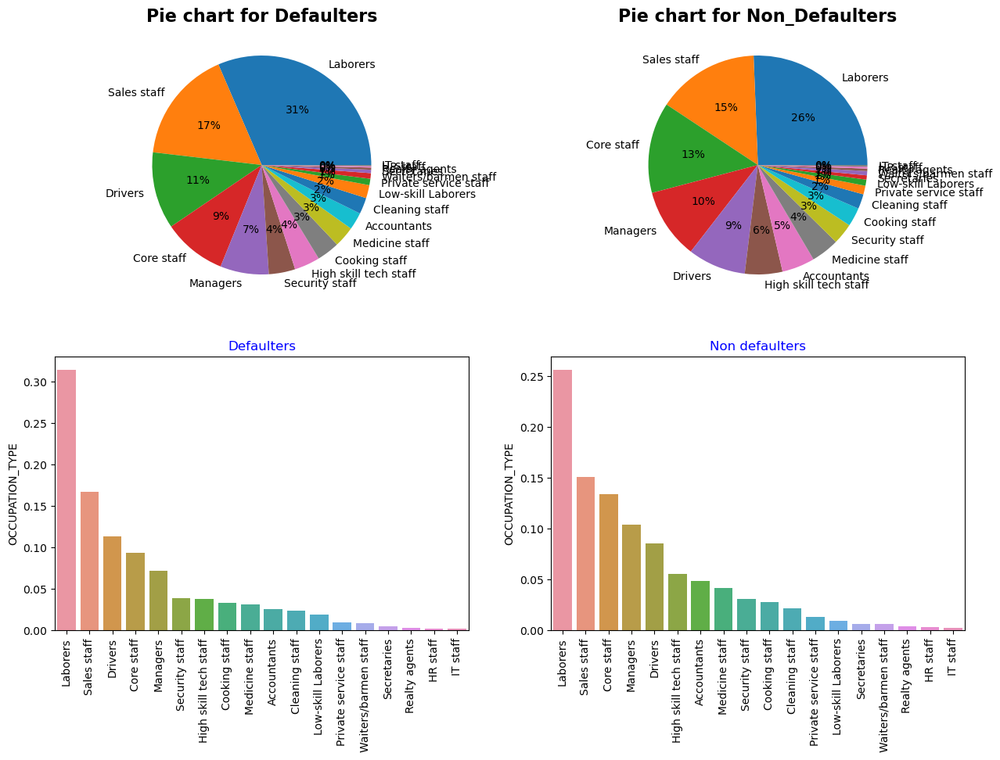

<Figure size 640x480 with 0 Axes>

ORGANIZATION_TYPE


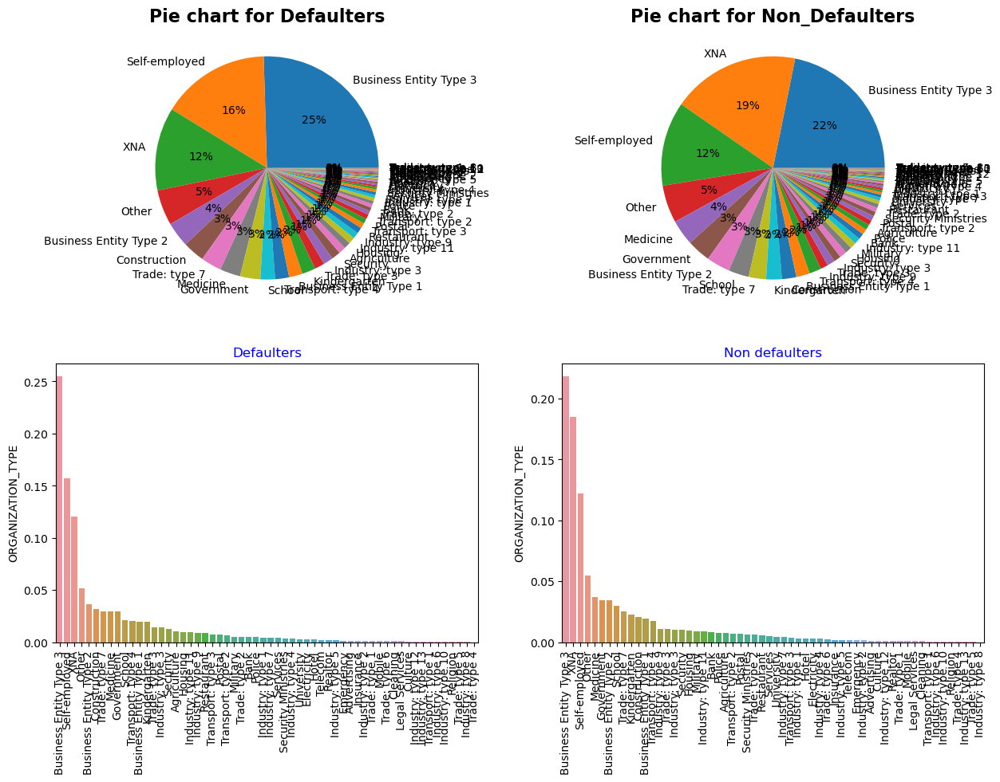

<Figure size 640x480 with 0 Axes>

TARGET


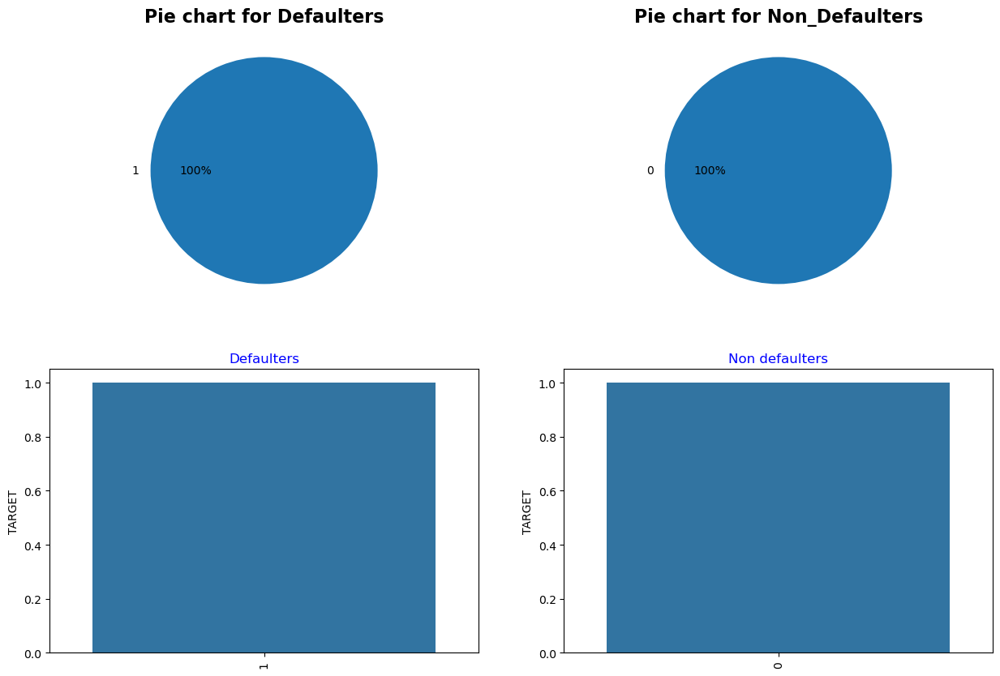

<Figure size 640x480 with 0 Axes>

REGION_RATING_CLIENT


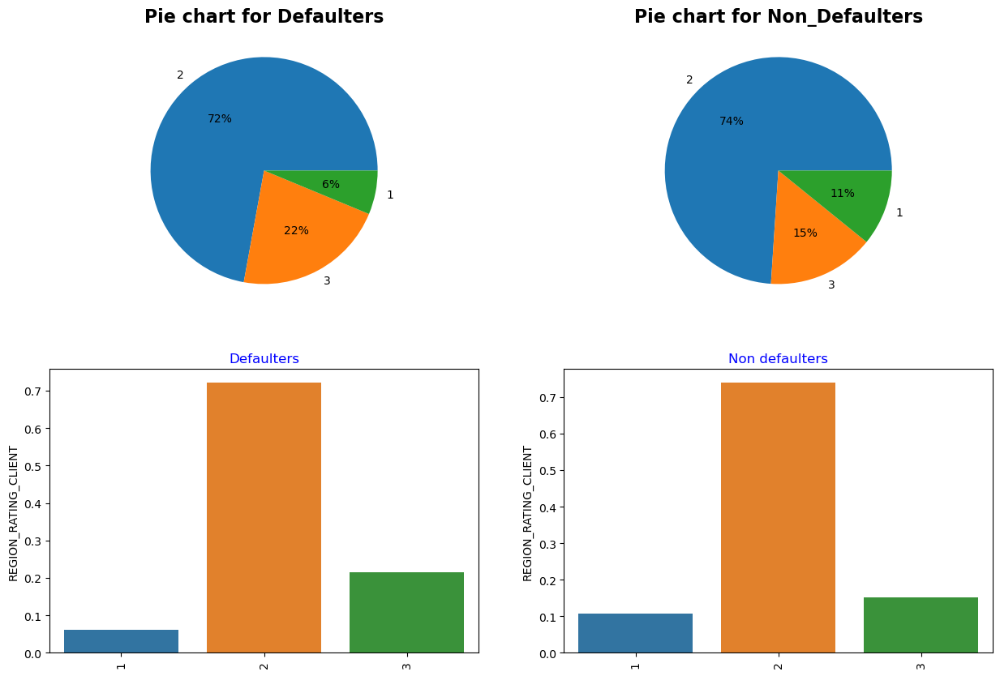

<Figure size 640x480 with 0 Axes>

REGION_RATING_CLIENT_W_CITY


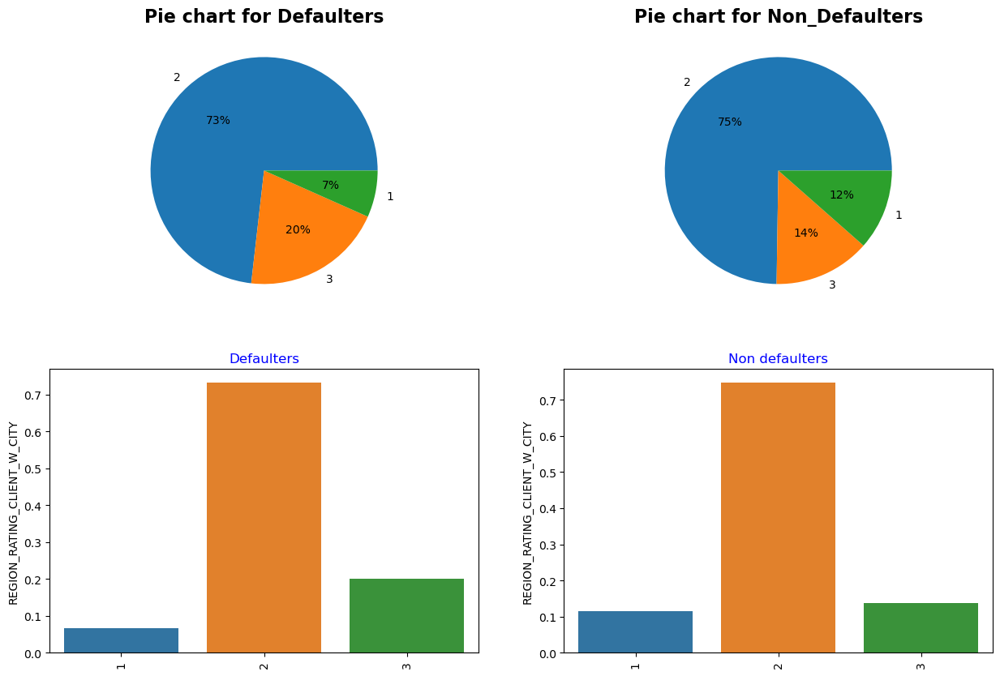

<Figure size 640x480 with 0 Axes>

AGE_GROUP


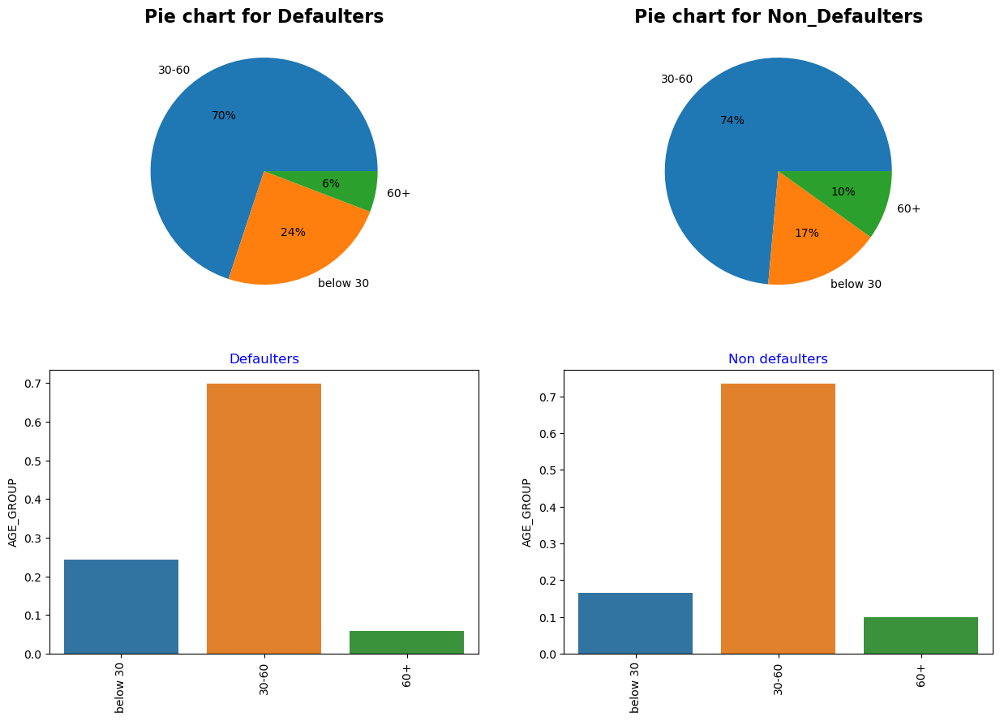

<Figure size 640x480 with 0 Axes>

AMT_INCOME_RANGE


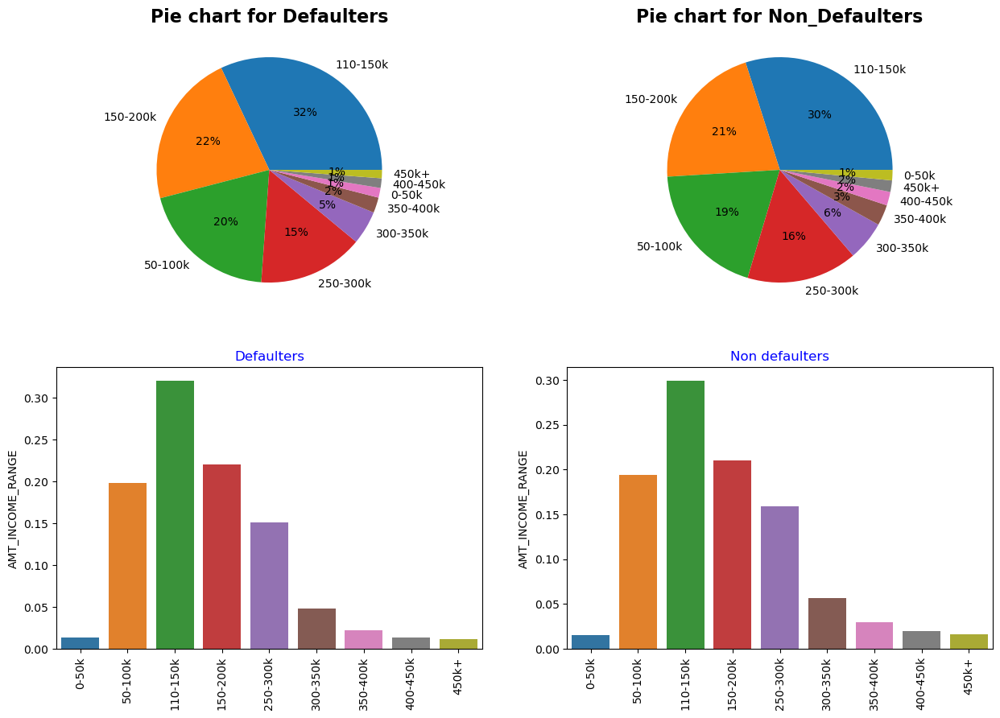

<Figure size 640x480 with 0 Axes>

YEARS_EMPLOYED


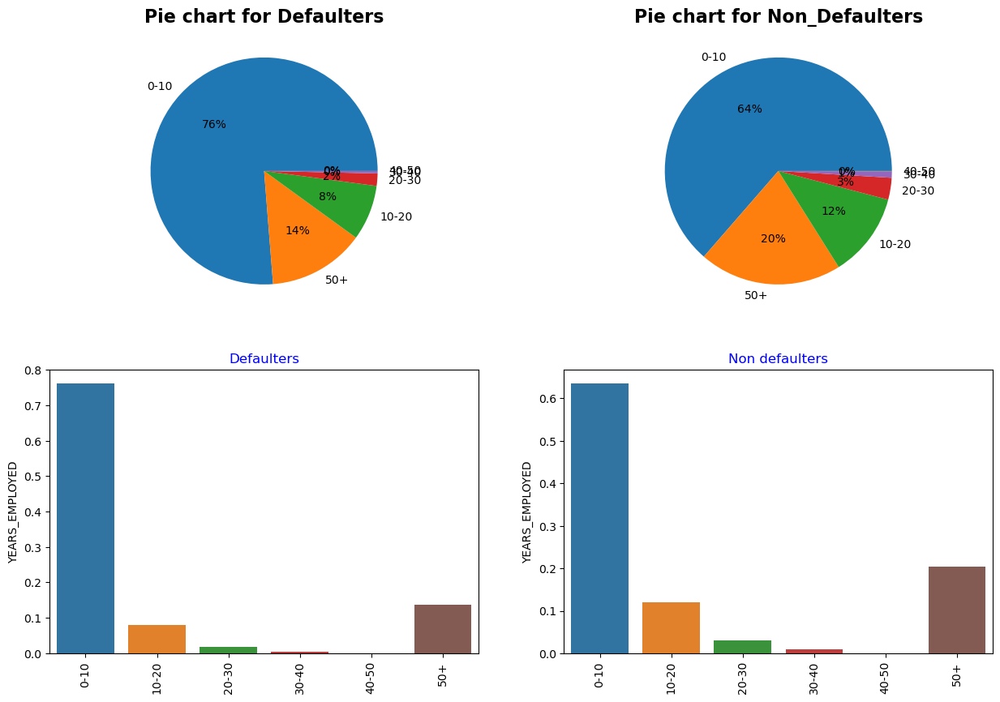

<Figure size 640x480 with 0 Axes>

In [189]:
# creating graphs for each categorical column and their % counts with help of for loop
for i in app_categ_data:
    plt.figure(figsize=(15,10))
    print("\033[1m" + i + "\033[0m")
    categ_data_default=app_target1[i].value_counts(normalize=True)
    categ_data_nondefault=app_target0[i].value_counts(normalize=True)

    plt.subplot(2, 2, 1)
    labels1= app_target1[i].value_counts().index
    plt.pie(app_target1[i].value_counts(), labels = labels1, autopct='%.0f%%')
    plt.title("Pie chart for Defaulters", fontweight="heavy",fontdict={"fontsize":16})
    
    plt.subplot(2, 2, 2)
    labels2= app_target0[i].value_counts().index
    plt.pie(app_target0[i].value_counts(), labels=labels2, autopct='%.0f%%')
    plt.title("Pie chart for Non_Defaulters", fontweight="heavy",fontdict={"fontsize":16})
    
    plt.subplot(2,2,3)
    sns.barplot(x=categ_data_default.index,y=categ_data_default)
    plt.xticks(rotation=90)
    plt.title("Defaulters",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
    
    plt.subplot(2,2,4)
    sns.barplot(x=categ_data_nondefault.index,y=categ_data_nondefault)
    plt.xticks(rotation=90)
    plt.title("Non defaulters",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
    plt.show()
    
    plt.tight_layout(pad =2)
    plt.show()

#### Conclusions from Univariate Analysis of Categorical Columns:-
1. **CODE_GENDER**: It depicts that no. of female non-defaulters are more than no. of male non-defaulters.
2. **NAME_EDUCATION_TYPE**: It shows that having applicants secondary education are more likely to be defaulters and higher education are less likely to be defaulters.
3. **NAME_FAMILY_STATUS**: No major difference between defaulters and non-defaulters based on family status.
4. **NAME_INCOME_TYPE**: It shows that Pensioners have less percentage of defaulters and working applicants have more percentage of defaulters.
5. **OCCUPATION_TYPE**: It shows that percentage of Laborers defaulters are more than percentage of non-defaulters.
6. **REGION_RATING_CLIENT**: It shows that applicants with region rating 3 are more likely to be defaulters.
7. **REGION_RATING_CLIENT_W_CITY**: It shows that applicants with region rating client_w_city 3 are more likely to be defaulters and with region rating 1 are less likely to be defaulters.
8. **AGE_GROUP**: It shows that applicants below 30 years of age are more likely to be defaulters
9. **AMT_INCOME_RANGE**: No major difference based on income range between defaulters and non-defaulters.
10. **YEARS_EMPLOYED**: Applicants in range of 0-10 are more likely to be defaulters. 

## Univariate analysis of Numeric data

AMT_INCOME_TOTAL


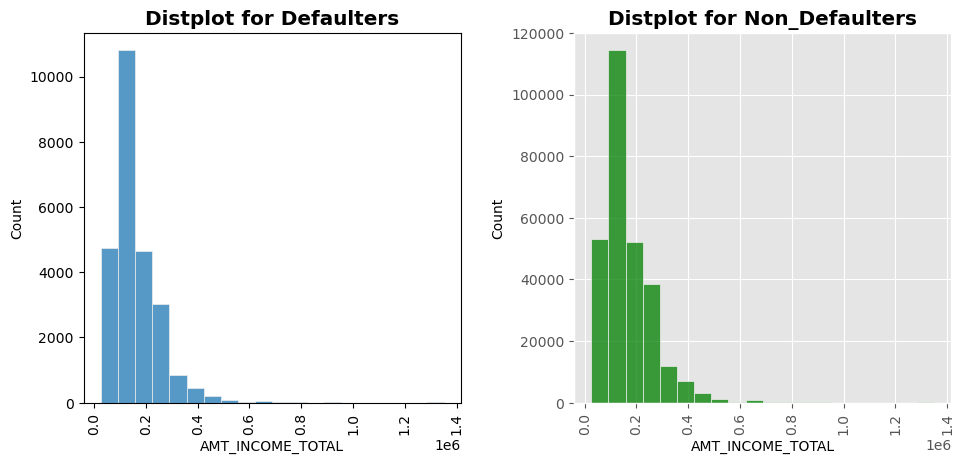

AMT_CREDIT


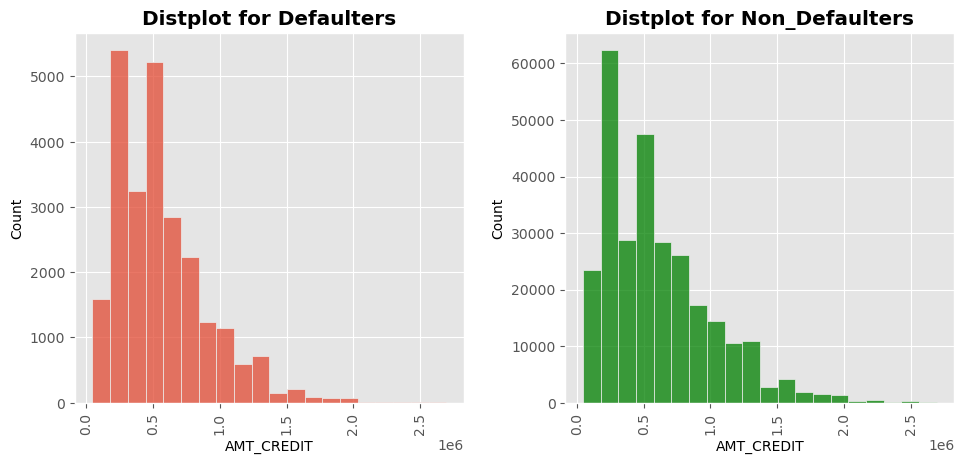

AMT_ANNUITY


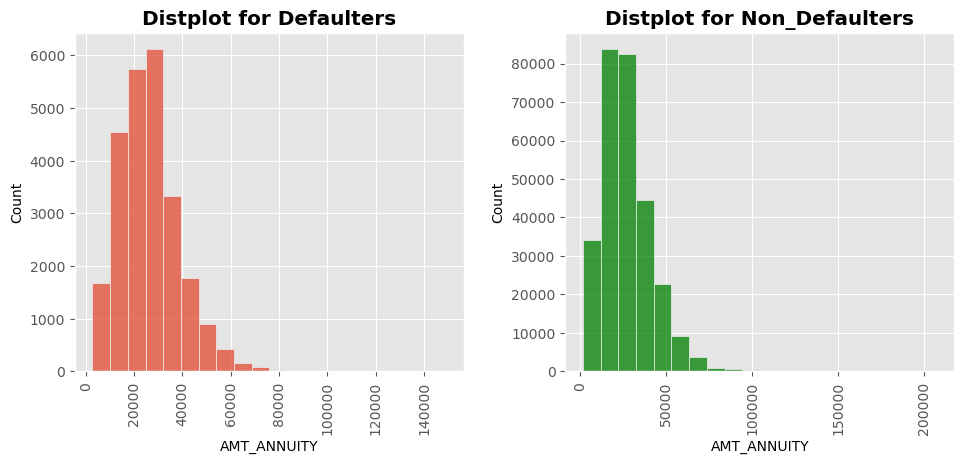

AMT_GOODS_PRICE


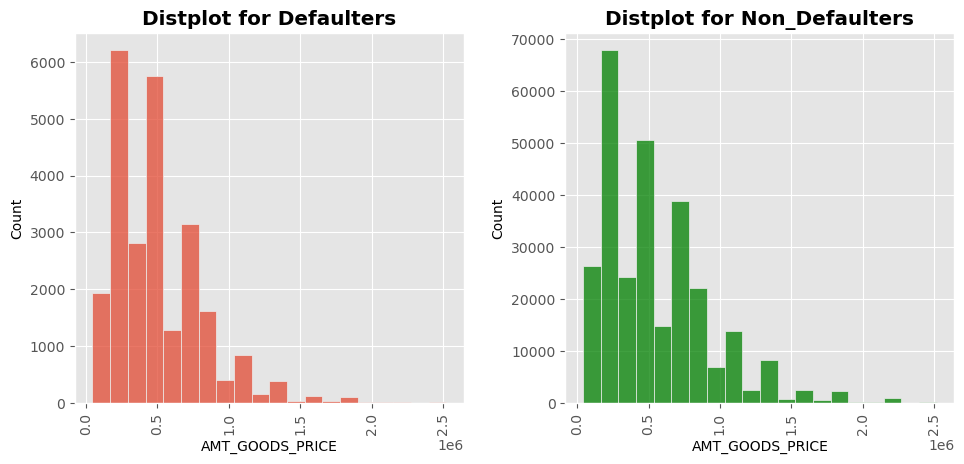

CNT_FAM_MEMBERS


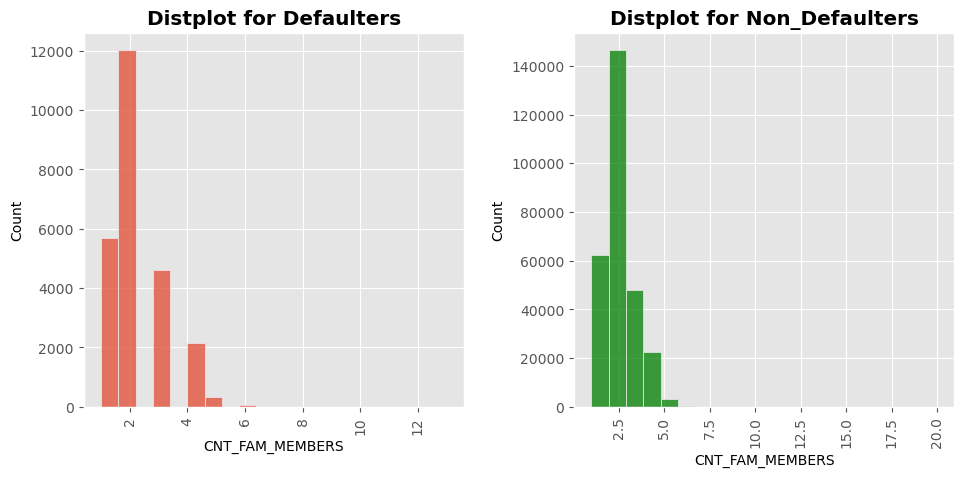

AMT_REQ_CREDIT_BUREAU_HOUR


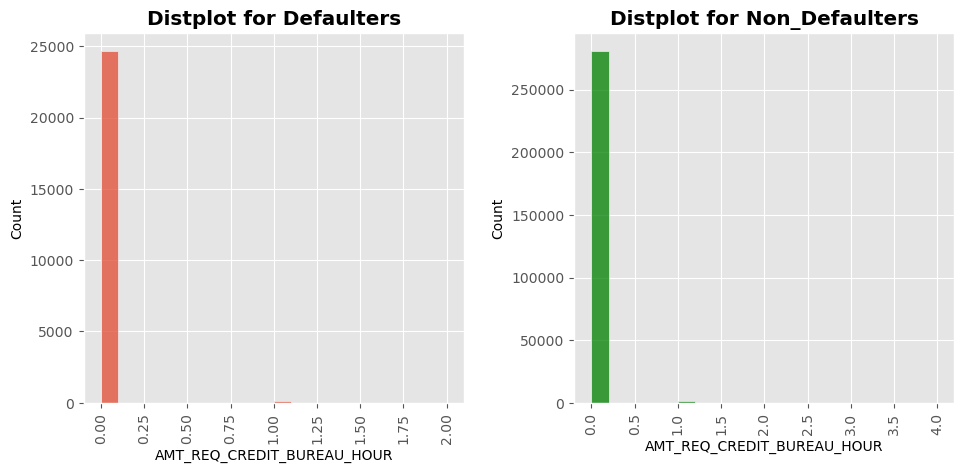

AMT_REQ_CREDIT_BUREAU_DAY


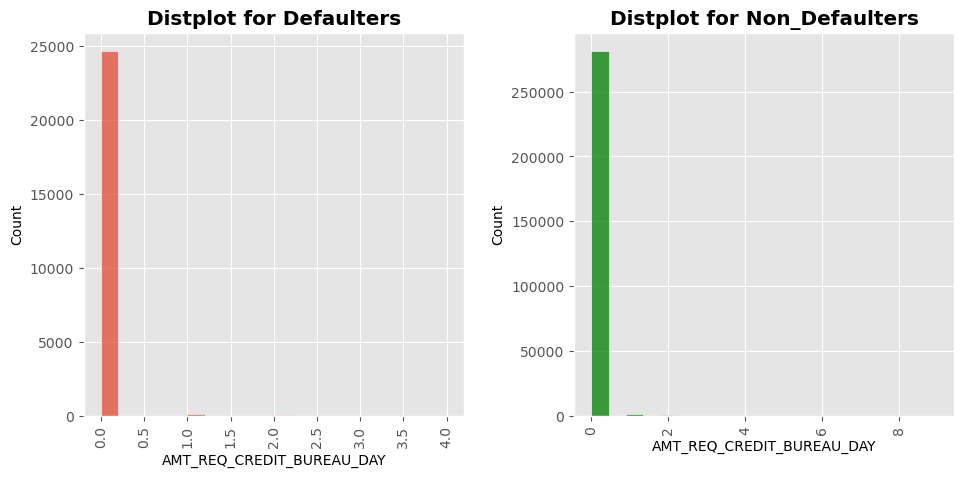

AMT_REQ_CREDIT_BUREAU_WEEK


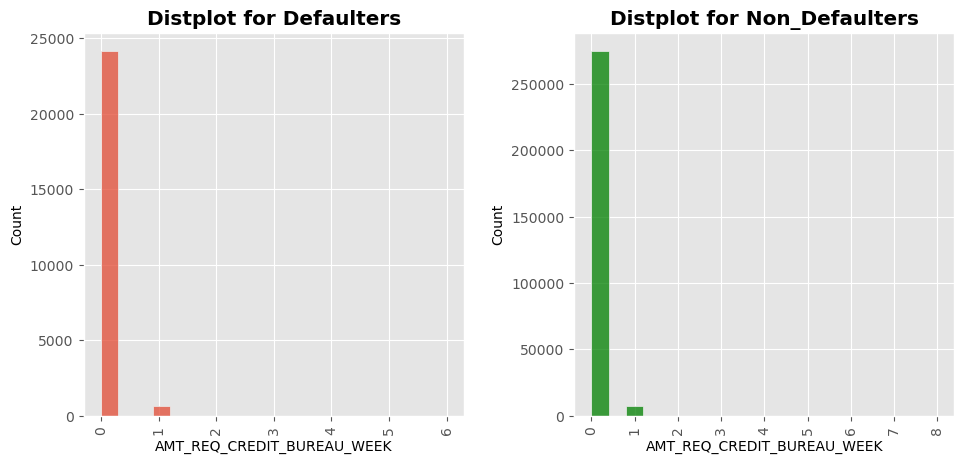

AMT_REQ_CREDIT_BUREAU_MON


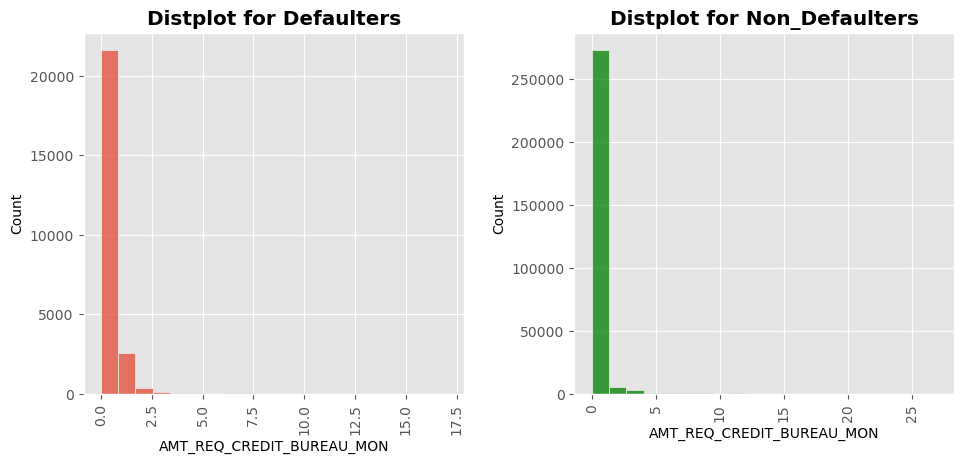

AMT_REQ_CREDIT_BUREAU_QRT


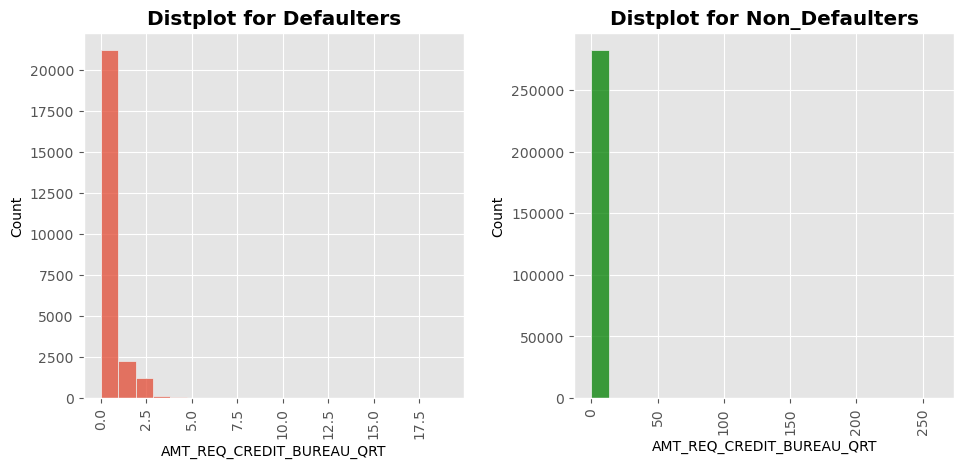

AMT_REQ_CREDIT_BUREAU_YEAR


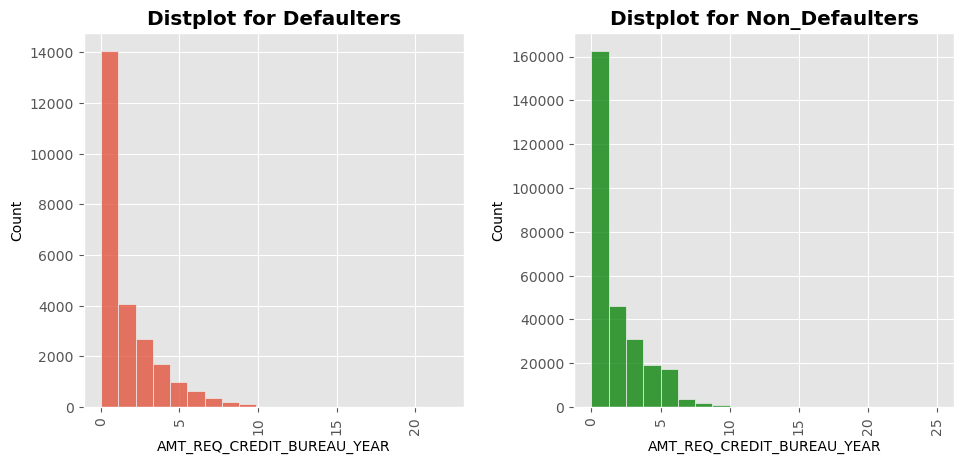

CNT_CHILDREN


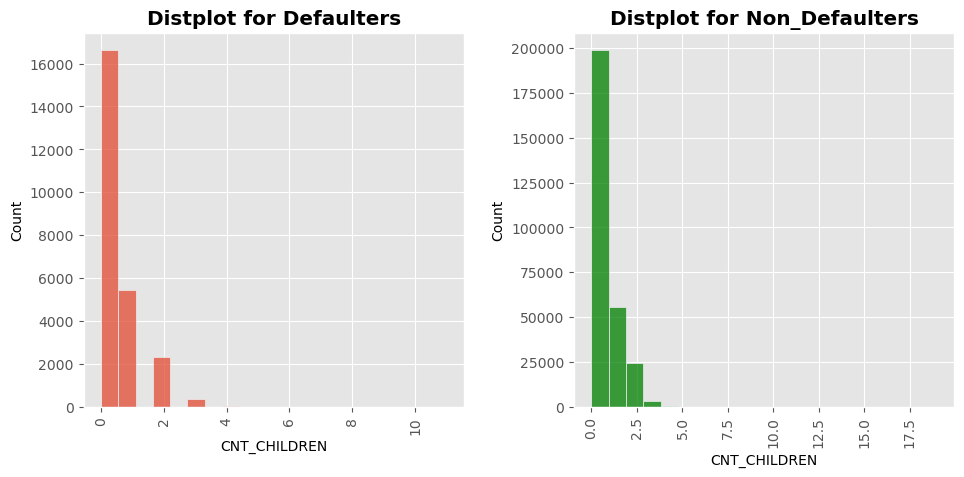

DAYS_BIRTH


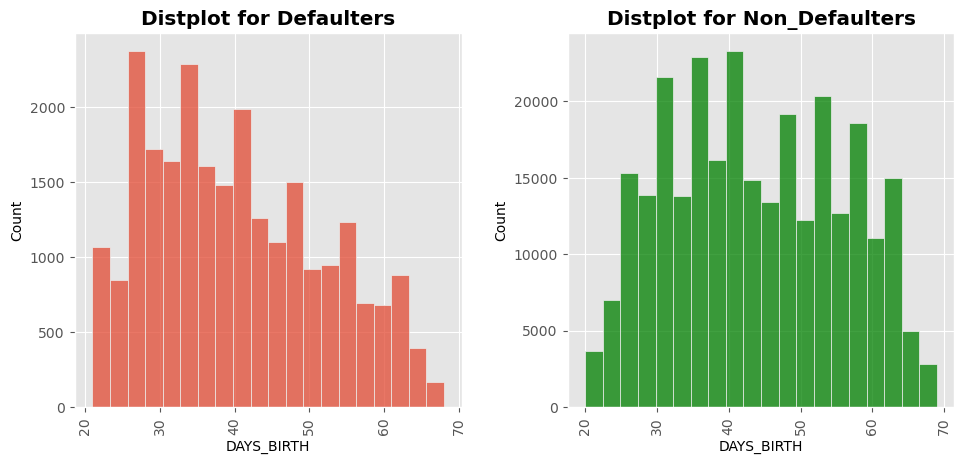

DAYS_EMPLOYED


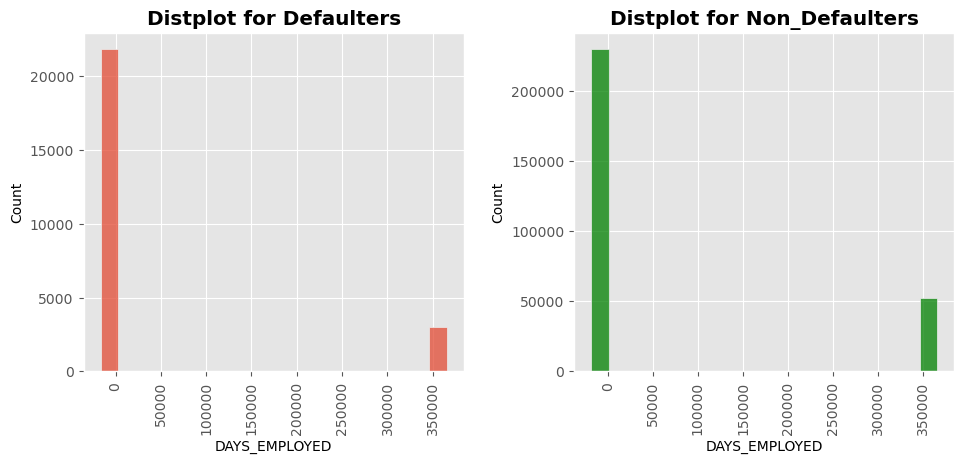

In [190]:
for i in app_num_data:
    plt.figure(figsize=(10,5))
    print("\033[1m" + i + "\033[0m")

    plt.subplot(1, 2, 1)
    plt.style.use("ggplot")
    sns.histplot(app_target1[i],bins=20)
    plt.title("Distplot for Defaulters", fontweight="heavy")
    plt.xticks(rotation=90)
    
    plt.subplot(1, 2, 2)
    plt.style.use("ggplot")
    sns.histplot(app_target0[i],bins=20,color="g")
    plt.title("Distplot for Non_Defaulters", fontweight="heavy")
    plt.xticks(rotation=90)
    
    plt.tight_layout(pad =2)
    plt.show()

**Conclusions**
1. **AMT_ANNUITY**: It shows that for defaulters annuity amount has max. count in 30,000 to 40,000 range and for non-defaulters it is in 10,000 to 20,000 range.Hence less annuity amount may have more probabilty of non-defaulters 
2. For AMT_INCOME, AMT_CREDIT, AMT_GOODS_PRICE , graphs for defaulters and non-defaulters appear to be more or less same and hence no conclusions can be drawn
3. **CNT_FAM_MEMBERS**: It shows for defaulters family member count is max at 2 and for non-defaulters at 2.5

# Bivariate Analysis of Application Dataset

## Bivariate analysis of Numeric data

<Figure size 3000x2000 with 0 Axes>

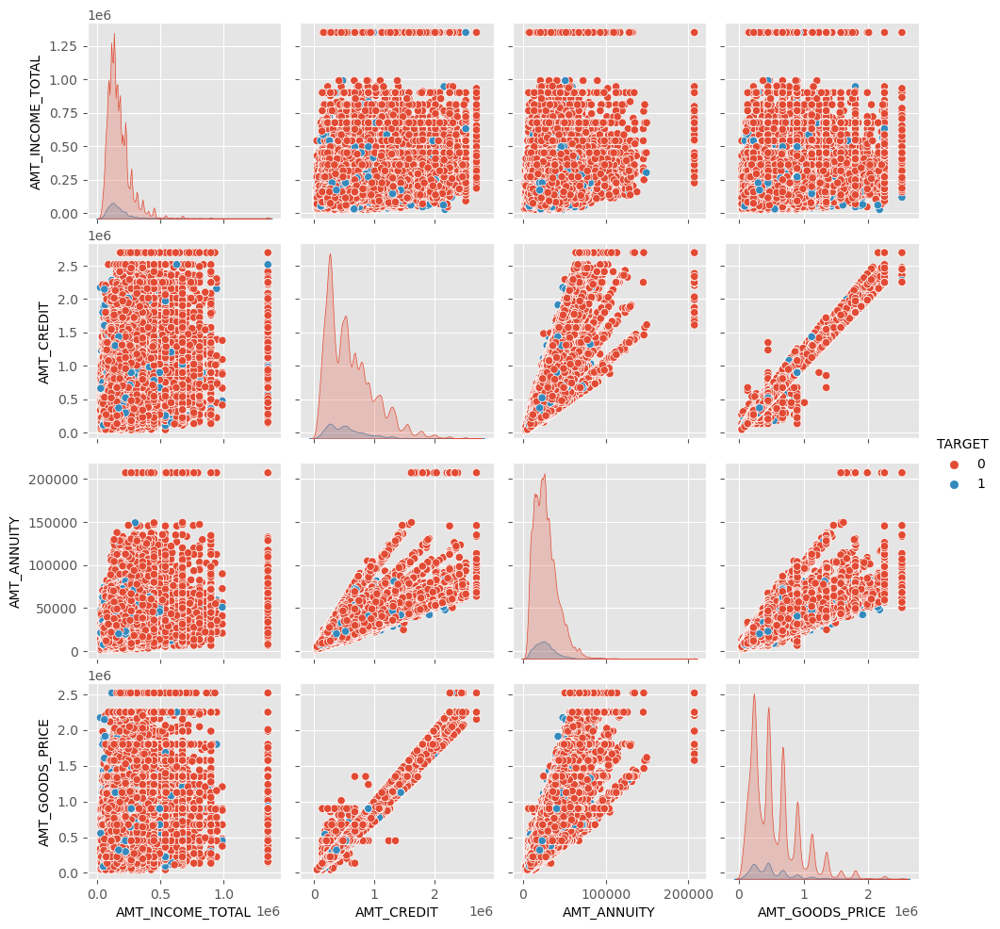

In [191]:
plt.figure(figsize=(30,20))
sns.pairplot(app[['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE','TARGET']],hue="TARGET")
plt.show()

**Conclusion**:
1. **AMT_CREDIT V/S AMT_GOODS_PRICE**: Credit amount and price of goods have linear relationship and less credit amount has more defaulters.
2. **AMT_ANNUITY V/S AMT_GOODS_PRICE**: Applicants with annuity amount less than 0.1 million and having price of goods less than 2 million have high chances of being defaulters.
3. **AMT_CREDIT V/S AMT_ANNUITY**: Applicants with credit amount less than 2 million and and annuity amount less than 0.1 million have high chances of being defaulters.

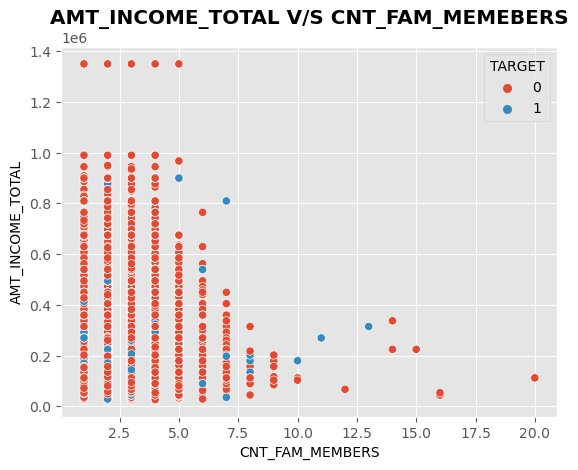

In [193]:
sns.scatterplot(data=app,x="CNT_FAM_MEMBERS",y="AMT_INCOME_TOTAL",hue="TARGET")
plt.title("AMT_INCOME_TOTAL V/S CNT_FAM_MEMEBERS", fontweight="heavy")
plt.show()

**Conclusion: Applicants with income less than 0.4 million  and no. of family members less than 8 have high chances of being defaulters**

## Bivariate analysis of Categorical & Numerical data

#### 1. NAME_FAMILY_STATUS V/S AMT_CREDIT

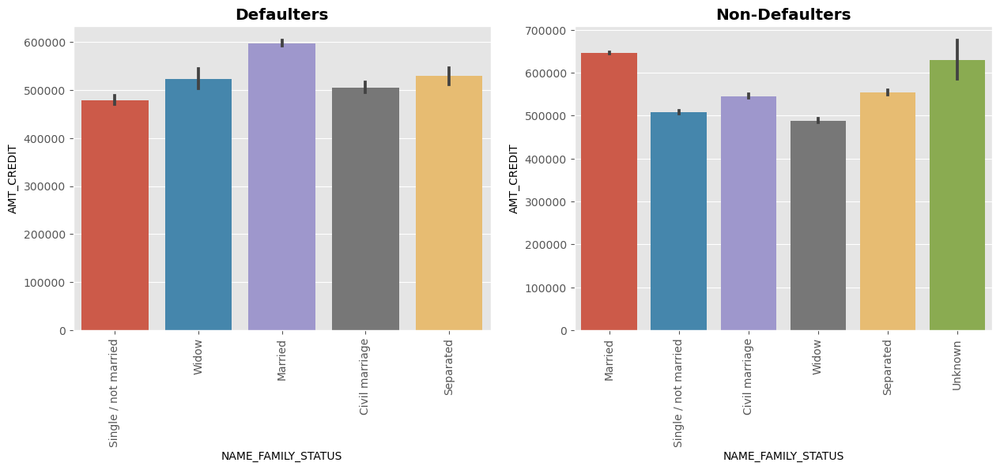

In [274]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.barplot(x="NAME_FAMILY_STATUS",y="AMT_CREDIT",data=app_target1)
plt.title("Defaulters", fontweight="heavy")
plt.xticks(rotation=90)

plt.subplot(1,2,2)
sns.barplot(x="NAME_FAMILY_STATUS",y="AMT_CREDIT",data=app_target0)
plt.title("Non-Defaulters", fontweight="heavy")
plt.xticks(rotation=90)
plt.show()

**Conclusion**: Clearly for married applicants credit amount is higher in case of defaulters

#### 2. CODE_GENDER V/S AMT_INCOME_TOTAL

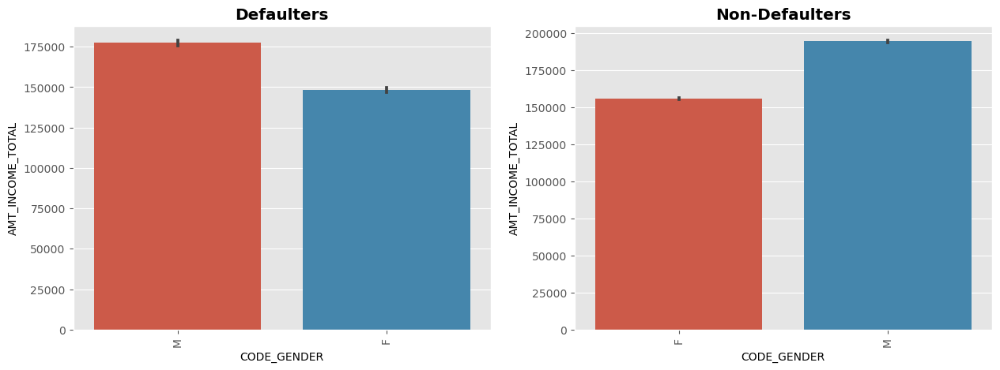

In [275]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.barplot(x="CODE_GENDER",y="AMT_INCOME_TOTAL",data=app_target1)
plt.title("Defaulters", fontweight="heavy")
plt.xticks(rotation=90)

plt.subplot(1,2,2)
sns.barplot(x="CODE_GENDER",y="AMT_INCOME_TOTAL",data=app_target0)
plt.title("Non-Defaulters", fontweight="heavy")
plt.xticks(rotation=90)
plt.show()

**Conclusion:Clearly for female non-defaulters the total income is high**

#### 3. NAME_EDUCATION_TYPE V/S CNT_CHILDREN

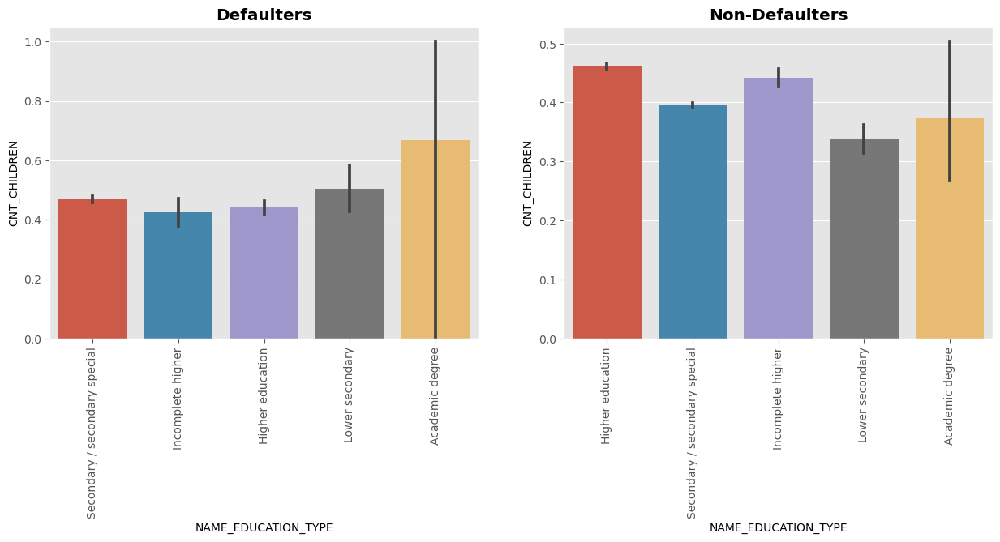

In [276]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.barplot(x="NAME_EDUCATION_TYPE",y="CNT_CHILDREN",data=app_target1)
plt.title("Defaulters", fontweight="heavy")
plt.xticks(rotation=90)

plt.subplot(1,2,2)
sns.barplot(x="NAME_EDUCATION_TYPE",y="CNT_CHILDREN",data=app_target0)
plt.title("Non-Defaulters", fontweight="heavy")
plt.xticks(rotation=90)
plt.show()

**Conclusion:Clearly for the peple with secondary education have more count of children in non-defaulter section**

#### 4. NAME_INCOME_TYPE V/S AMT_ANNUITY

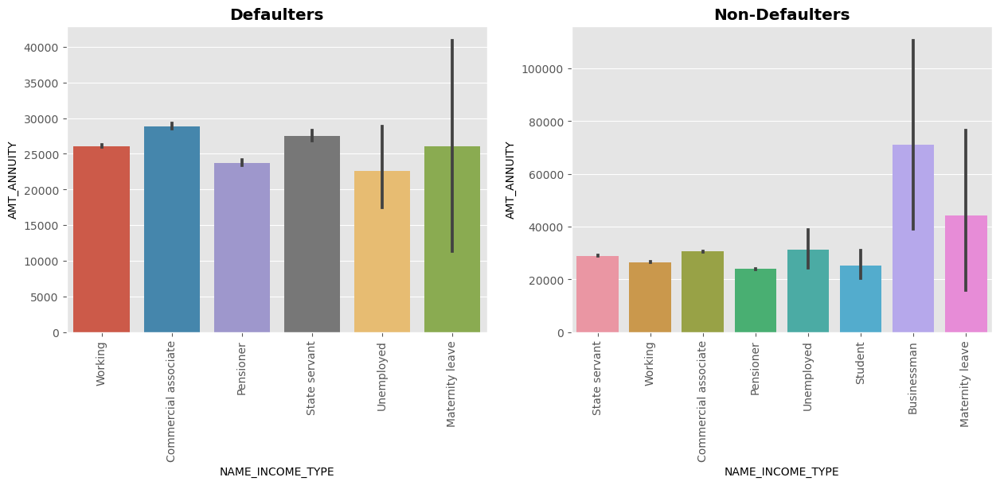

In [194]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.barplot(x="NAME_INCOME_TYPE",y="AMT_ANNUITY",data=app_target1)
plt.title("Defaulters", fontweight="heavy")
plt.xticks(rotation=90)

plt.subplot(1,2,2)
sns.barplot(x="NAME_INCOME_TYPE",y="AMT_ANNUITY",data=app_target0)
plt.title("Non-Defaulters", fontweight="heavy")
plt.xticks(rotation=90)
plt.show()

**Conclusion:Clearly for working applicants Annuity amount is less for non-defaulters and for pensioners also annuity amount is less in case of non-defaulters.**

#### 5.AGE_GROUP V/S AMT_GOODS_PRICE

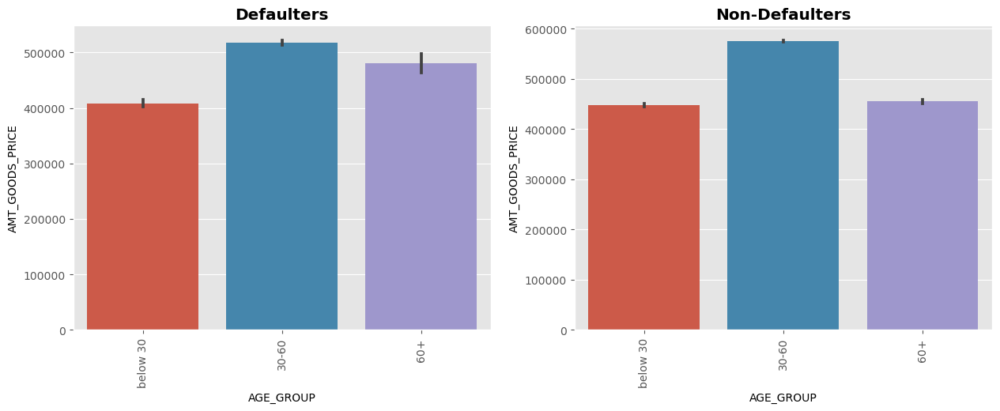

In [195]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.barplot(x="AGE_GROUP",y="AMT_GOODS_PRICE",data=app_target1)
plt.title("Defaulters", fontweight="heavy")
plt.xticks(rotation=90)

plt.subplot(1,2,2)
sns.barplot(x="AGE_GROUP",y="AMT_GOODS_PRICE",data=app_target0)
plt.title("Non-Defaulters", fontweight="heavy")
plt.xticks(rotation=90)
plt.show()

**Conclusion: Clearly applicants below 30 years of age have price of goods lower for defaulter secion.**

#### 6. FLAG_OWN_CAR V/S AMT_INCOME_TOTAL

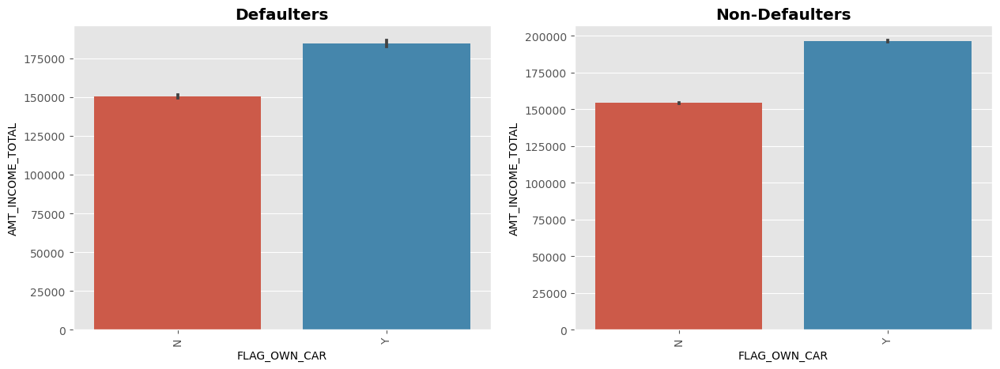

In [279]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.barplot(x="FLAG_OWN_CAR",y="AMT_INCOME_TOTAL",data=app_target1)
plt.title("Defaulters", fontweight="heavy")
plt.xticks(rotation=90)

plt.subplot(1,2,2)
sns.barplot(x="FLAG_OWN_CAR",y="AMT_INCOME_TOTAL",data=app_target0)
plt.title("Non-Defaulters", fontweight="heavy")
plt.xticks(rotation=90)
plt.show()

**Conclusions: Applicants owning a car have higher total income in case of non-defaulters**

#### 7. YEARS_EMPLOYED V/S AMT_INCOME_TOTAL

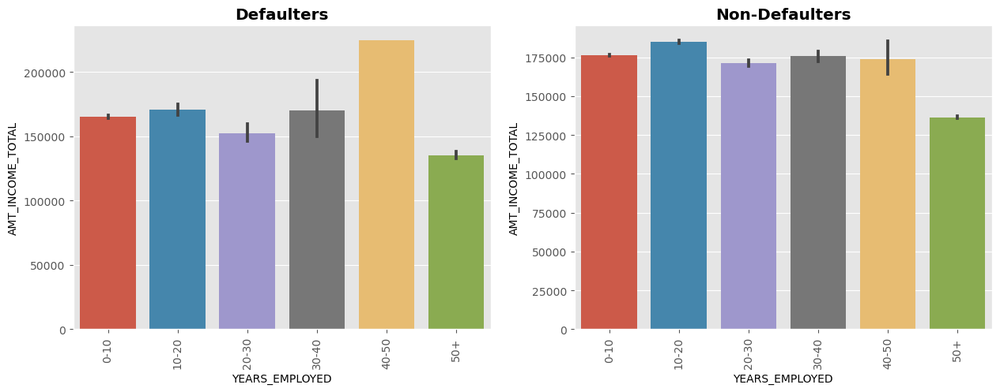

In [280]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.barplot(x="YEARS_EMPLOYED",y="AMT_INCOME_TOTAL",data=app_target1)
plt.title("Defaulters", fontweight="heavy")
plt.xticks(rotation=90)

plt.subplot(1,2,2)
sns.barplot(x="YEARS_EMPLOYED",y="AMT_INCOME_TOTAL",data=app_target0)
plt.title("Non-Defaulters", fontweight="heavy")
plt.xticks(rotation=90)
plt.show()

**Conclusion**: For all groups of years employed except 40-50, total income is higher for non-defaulters

### Bivariate analysis of Target Variable & Numerical data

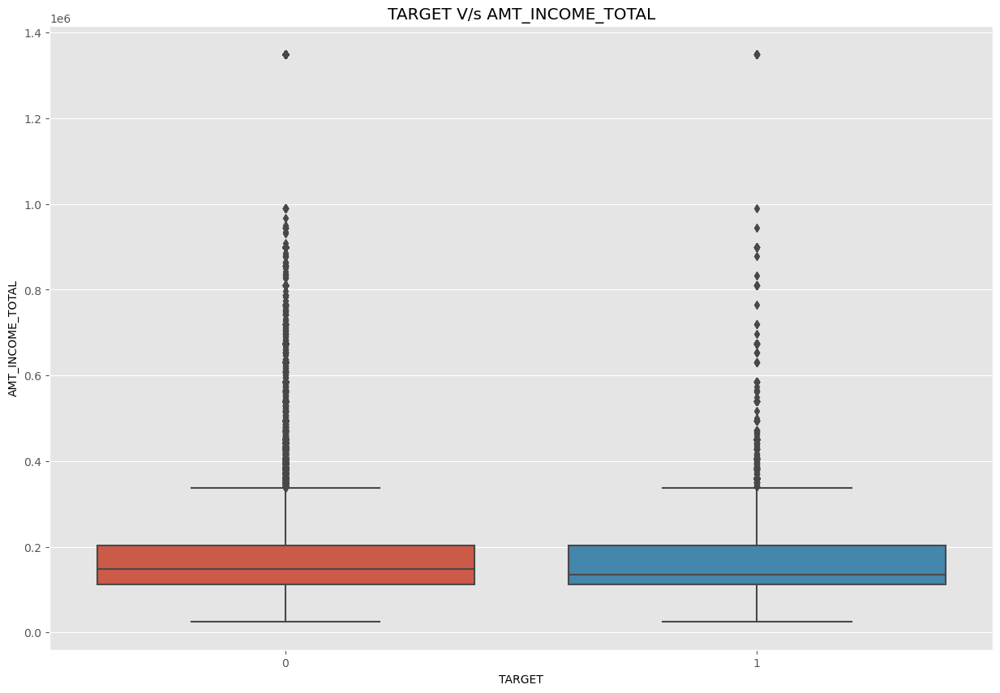

<Figure size 640x480 with 0 Axes>

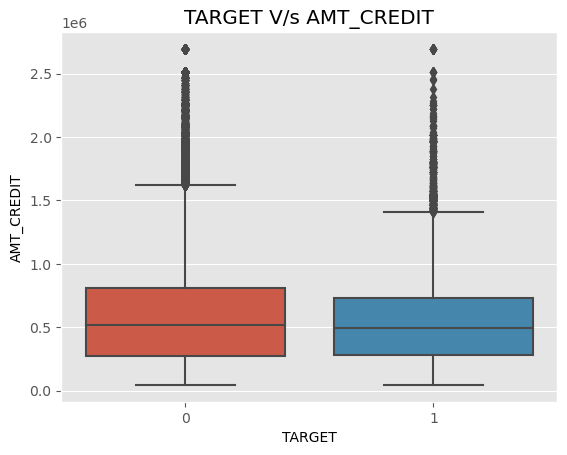

<Figure size 640x480 with 0 Axes>

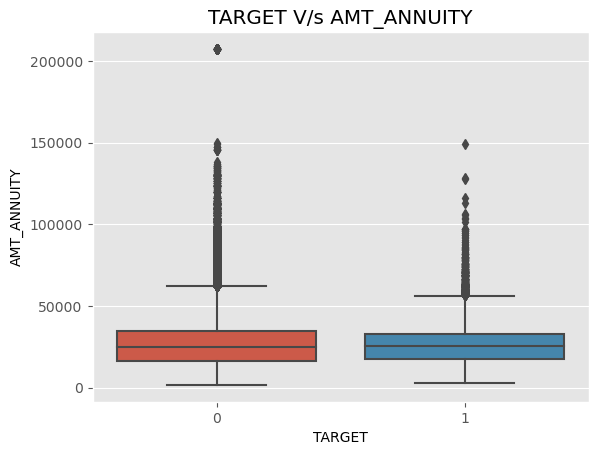

<Figure size 640x480 with 0 Axes>

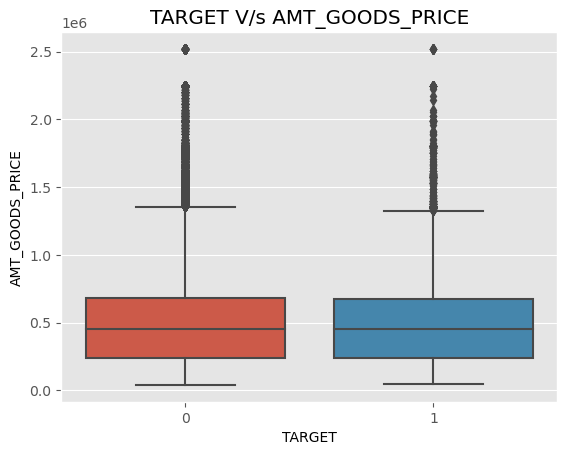

<Figure size 640x480 with 0 Axes>

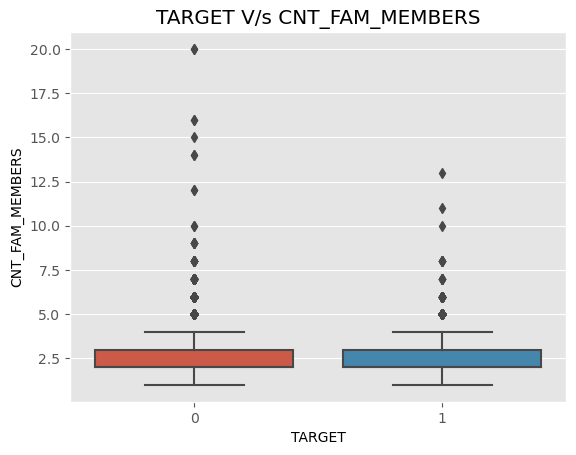

<Figure size 640x480 with 0 Axes>

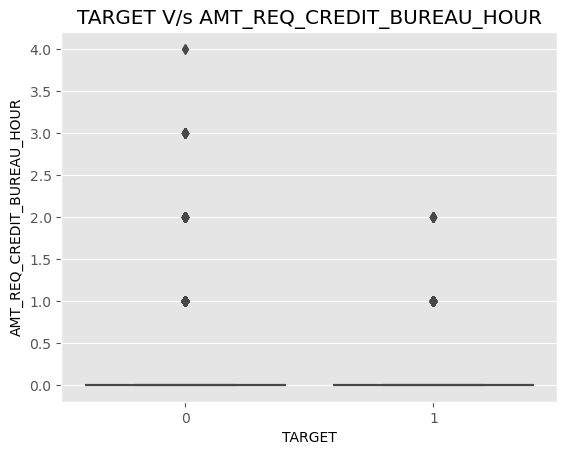

<Figure size 640x480 with 0 Axes>

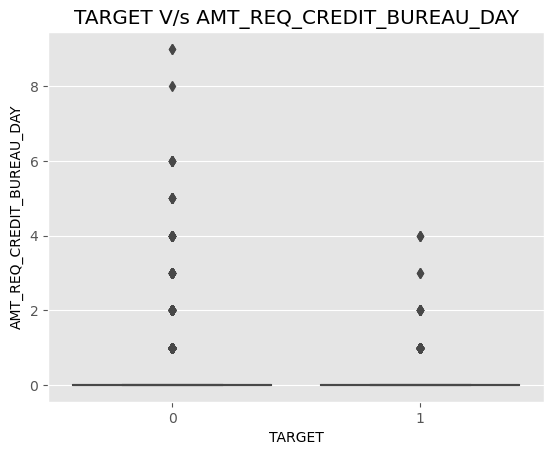

<Figure size 640x480 with 0 Axes>

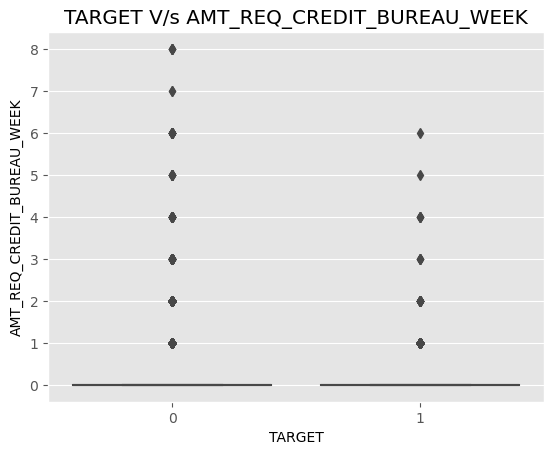

<Figure size 640x480 with 0 Axes>

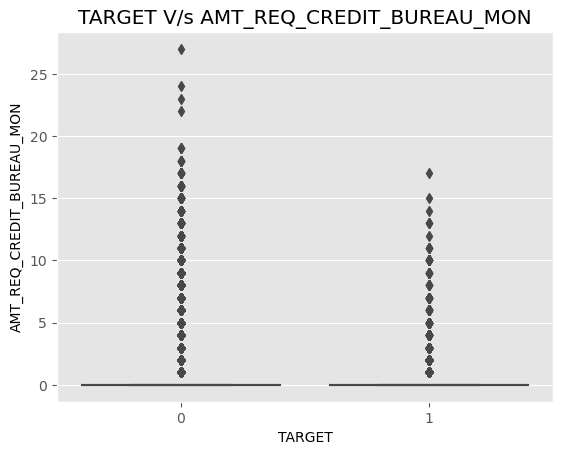

<Figure size 640x480 with 0 Axes>

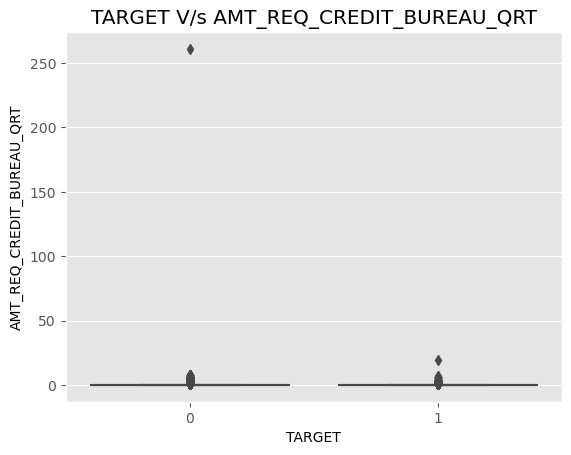

<Figure size 640x480 with 0 Axes>

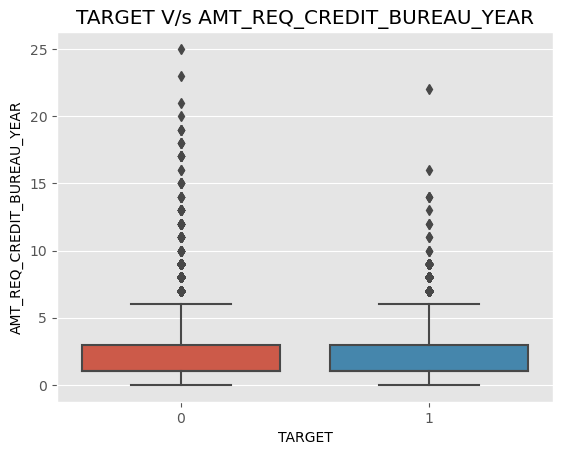

<Figure size 640x480 with 0 Axes>

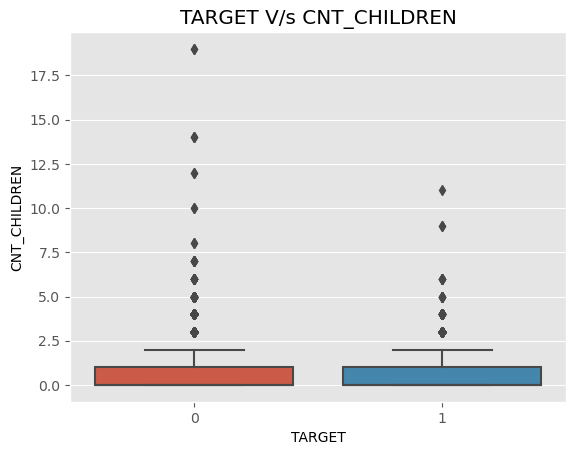

<Figure size 640x480 with 0 Axes>

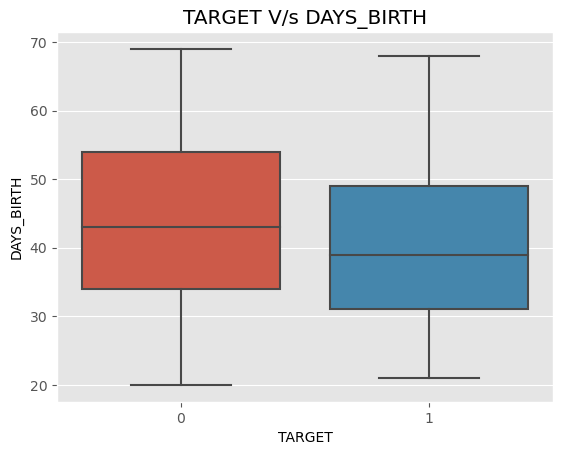

<Figure size 640x480 with 0 Axes>

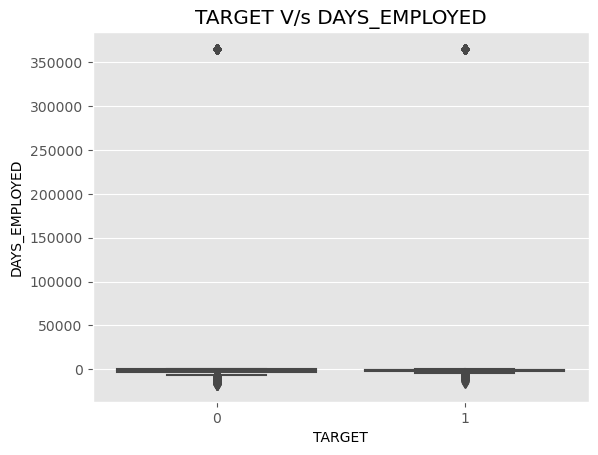

<Figure size 640x480 with 0 Axes>

In [196]:
plt.figure(figsize=(15,10))
for i in app_num_data:
    sns.boxplot(x="TARGET",y=i,data=app)
    plt.title("TARGET V/s"+ " "+ i)
    plt.show()
    
    plt.tight_layout(pad =2)
    plt.show()

**Conclusion**: The distribution of AMT_INCOME_TOTAL ,AMT_CREDIT,AMT_ANNUITY, AMT_GOODS_PRICE , AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, CNT_FAM_MEMBERS, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_YEAR,  CNT_CHILDREN of Target1/defaulters and of Target0/Non=defaulters are somewhat same and no major difference is seen.

### Bivariate analysis of Categorical column

#### 1. NAME_CONTRACT_TYPE V/S AGE_RANGE

<Figure size 1000x500 with 0 Axes>

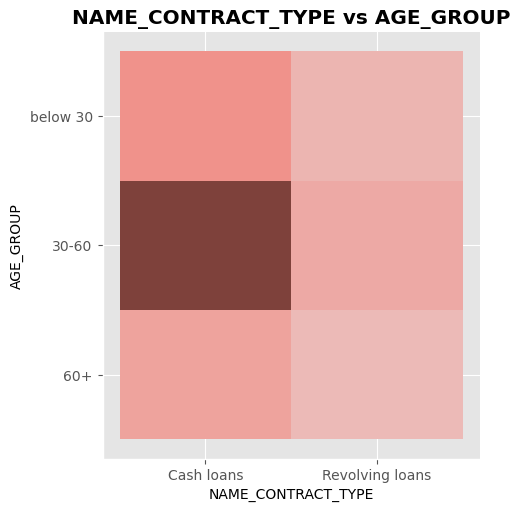

In [298]:
plt.figure(figsize=(10,5))
sns.displot(app,x="NAME_CONTRACT_TYPE",y="AGE_GROUP")
plt.title("NAME_CONTRACT_TYPE vs AGE_GROUP", fontweight="heavy")
plt.show()

**Conclusion: Clearly more applicants applying for cash loans are in age group of 30-60**

#### 2. NAME_FAMILY_STATUS V/S AMT_INCOME_RANGE

<Figure size 1000x500 with 0 Axes>

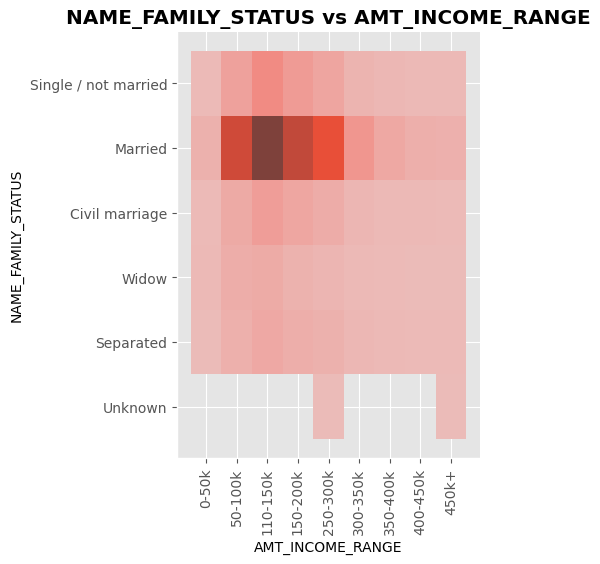

In [197]:
plt.figure(figsize=(10,5))
sns.displot(app,x="AMT_INCOME_RANGE",y="NAME_FAMILY_STATUS")
plt.xticks(rotation=90)
plt.title("NAME_FAMILY_STATUS vs AMT_INCOME_RANGE", fontweight="heavy")
plt.show()

**Conclusion: More married applicants are in 110-150K income-range**

#### 3. OCCUPATION_TYPE V/S AGE_GROUP

<Figure size 1000x1000 with 0 Axes>

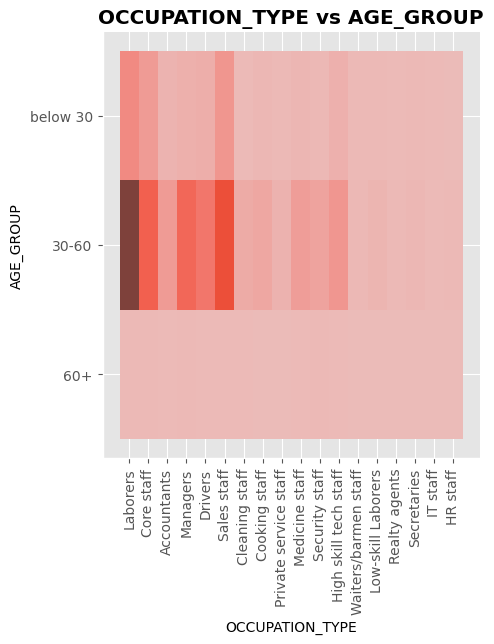

In [471]:
plt.figure(figsize=(10,10))
sns.displot(app,x="OCCUPATION_TYPE",y="AGE_GROUP")
plt.title("OCCUPATION_TYPE vs AGE_GROUP", fontweight="heavy")
plt.xticks(rotation=90)
plt.show()

**Conclusion: Clearly max no. of laborers are in age range of 30-60**

#### 4. NAME_INCOME_TYPE V/S CODE_GENDER

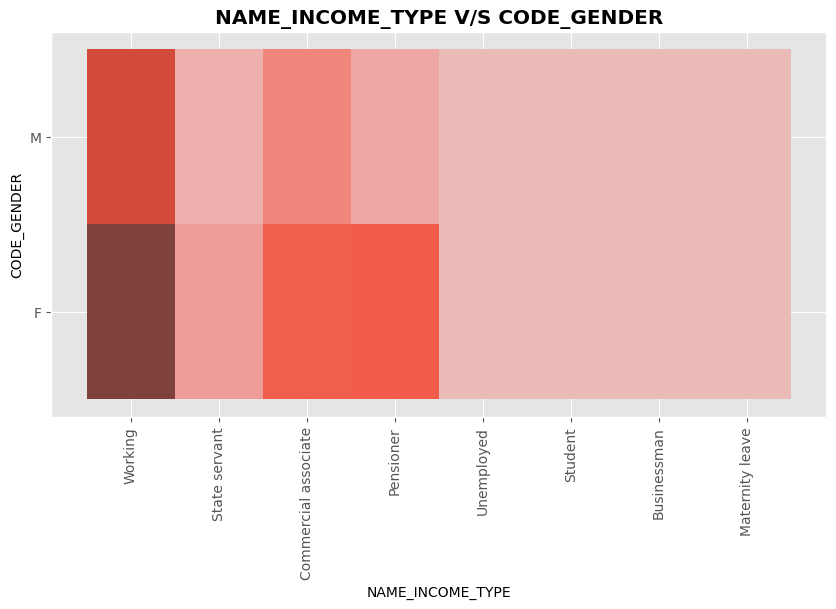

In [472]:
plt.figure(figsize=(10,5))
sns.histplot(app,x="NAME_INCOME_TYPE",y="CODE_GENDER")
plt.title("NAME_INCOME_TYPE V/S CODE_GENDER", fontweight="heavy")
plt.xticks(rotation=90)
plt.show()

**conclusion: Clearly more no. of working applicants are females**

#### 5. REGION_RATING_CLIENT V/S NAME_INCOME_TYPE

<Figure size 1000x1000 with 0 Axes>

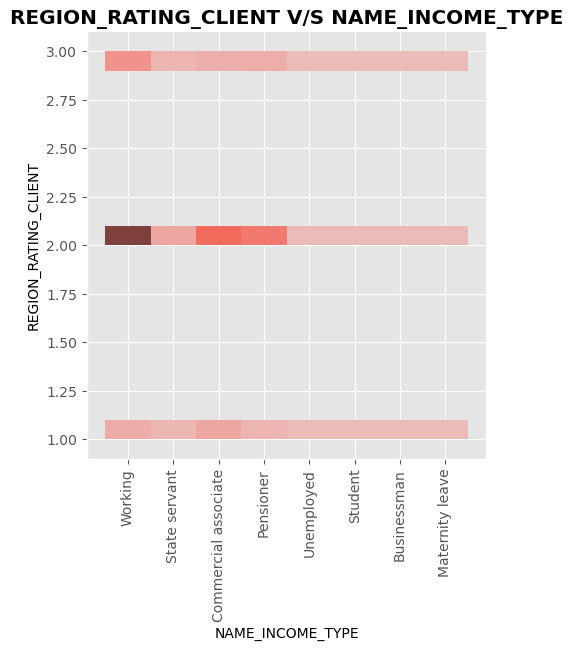

In [473]:
plt.figure(figsize=(10,10))
sns.displot(app,x="NAME_INCOME_TYPE",y="REGION_RATING_CLIENT")
plt.title("REGION_RATING_CLIENT V/S NAME_INCOME_TYPE", fontweight="heavy")
plt.xticks(rotation=90)
plt.show()

**Conclusion: Clearly most working applicants belong to region rating 2**

## Multivariate Analysis of Application Dataset

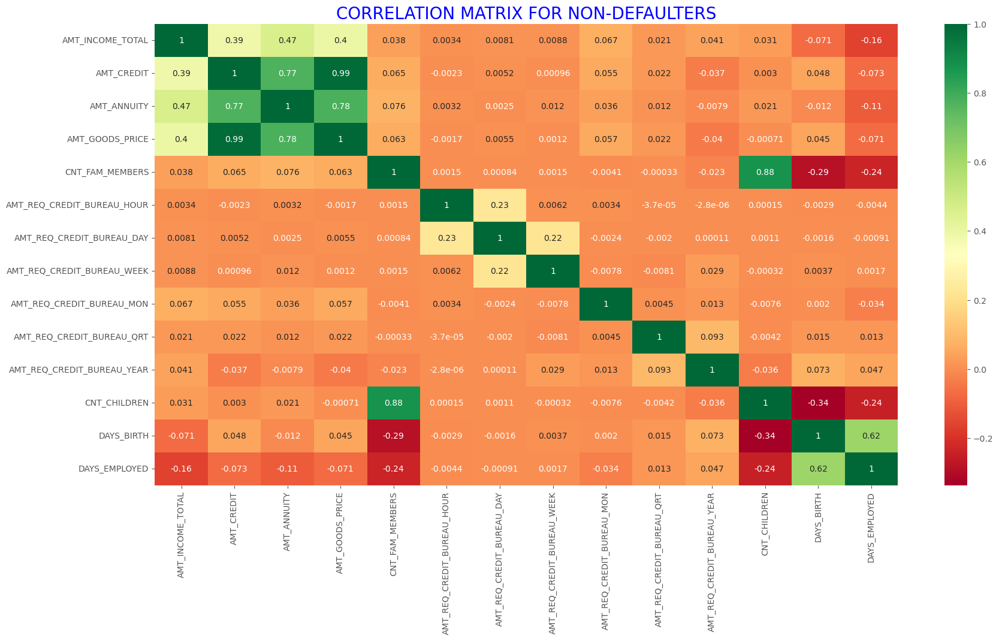

In [198]:
# Ploting heatmap for multivariate analysis of TARGET 0
plt.figure(figsize=(20,10))
sns.heatmap(app_target0[app_num_data].corr(),annot=True,cmap="RdYlGn")
plt.title("CORRELATION MATRIX FOR NON-DEFAULTERS",fontdict={"fontsize":20,"fontweight":10,"color":"blue"})
plt.show()

### Top 10 correlations for Non-Defaulters 

In [200]:
# Calculating the correlations
correlations= app_target0[app_num_data].corr()

# Getting the correlations
top_correlations = correlations.unstack().sort_values(ascending=False)

# Filtering out correlations = 1
top_correlations = top_correlations[top_correlations != 1]

# Droping NaN values
top_correlations = top_correlations.dropna()

# selecting top 10 correlations
top_10_correlations = top_correlations.head(10)

print("Top 10 correlations for Non-Defaulters:")
print("{:<30} {:<30} {:<30}".format("Variable 1", "Variable 2", "Correlation"))
for i, correlation in top_10_correlations.items():
    variable1, variable2 = i
    round_correlation = round(correlation, 2)
    print("{:<30} {:<30} {:<30}".format(variable1, variable2, round_correlation))

Top 10 correlations for Non-Defaulters:
Variable 1                     Variable 2                     Correlation                   
AMT_CREDIT                     AMT_GOODS_PRICE                0.99                          
AMT_GOODS_PRICE                AMT_CREDIT                     0.99                          
CNT_CHILDREN                   CNT_FAM_MEMBERS                0.88                          
CNT_FAM_MEMBERS                CNT_CHILDREN                   0.88                          
AMT_GOODS_PRICE                AMT_ANNUITY                    0.78                          
AMT_ANNUITY                    AMT_GOODS_PRICE                0.78                          
AMT_CREDIT                     AMT_ANNUITY                    0.77                          
AMT_ANNUITY                    AMT_CREDIT                     0.77                          
DAYS_EMPLOYED                  DAYS_BIRTH                     0.62                          
DAYS_BIRTH                    

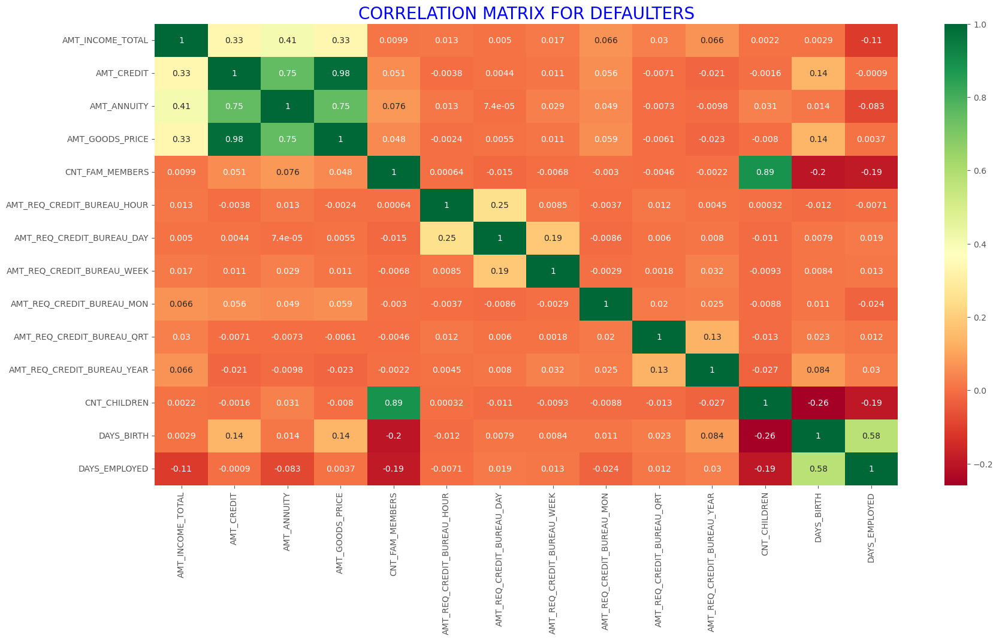

In [201]:
# Ploting heatmap for multivariate analysis of TARGET 1
plt.figure(figsize=(20,10))
sns.heatmap(app_target1[app_num_data].corr(),annot=True,cmap="RdYlGn")
plt.title("CORRELATION MATRIX FOR DEFAULTERS",fontdict={"fontsize":20,"fontweight":10,"color":"blue"})
plt.show()

### Top 10 correlations for Defaulters

In [202]:
# Calculating the correlations
correlations = app_target1[app_num_data].corr()

# Getting the correlations
top_correlations = correlations.unstack().sort_values(ascending=False)

# Filtering out correlations = 1
top_correlations = top_correlations[top_correlations != 1]

# Droping NaN values
top_correlations = top_correlations.dropna()

# Selecting the top 10 correlations
top_10_correlations = top_correlations.head(10)

print("Top 10 correlations for defaulters:")
print("{:<30} {:<30} {:<30}".format("Variable 1", "Variable 2", "Correlation"))
for i, correlation in top_10_correlations.items():
    variable1, variable2 = i
    round_correlation = round(correlation, 2)
    print("{:<30} {:<30} {:<30}".format(variable1, variable2, round_correlation))

Top 10 correlations for defaulters:
Variable 1                     Variable 2                     Correlation                   
AMT_GOODS_PRICE                AMT_CREDIT                     0.98                          
AMT_CREDIT                     AMT_GOODS_PRICE                0.98                          
CNT_CHILDREN                   CNT_FAM_MEMBERS                0.89                          
CNT_FAM_MEMBERS                CNT_CHILDREN                   0.89                          
AMT_CREDIT                     AMT_ANNUITY                    0.75                          
AMT_ANNUITY                    AMT_CREDIT                     0.75                          
AMT_GOODS_PRICE                AMT_ANNUITY                    0.75                          
AMT_ANNUITY                    AMT_GOODS_PRICE                0.75                          
DAYS_EMPLOYED                  DAYS_BIRTH                     0.58                          
DAYS_BIRTH                     DAY

# Data Cleaning of Previous Application dataset

In [203]:
# Checking null% of Pevious Application dataset
null_prev_app=(prev_app.isnull().sum())*100/sp2[0]
null_prev_app

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.286665
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000060
AMT_DOWN_PAYMENT               53.636480
AMT_GOODS_PRICE                23.081773
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
RATE_DOWN_PAYMENT              53.636480
RATE_INTEREST_PRIMARY          99.643698
RATE_INTEREST_PRIVILEGED       99.643698
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_TYPE_SUITE                49.119754
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYP

In [204]:
# Dropping the columns from prev application dataset with null% greater than 55 
null_column=null_prev_app[null_prev_app>55]
a=null_column.index
columns_to_remove=list(a)
prev_app.drop(columns_to_remove,axis=1,inplace=True)

**I have taken null% cut off 55 as In my opinion AMT_DOWN_PAYMENT which has null % 54 seems to be imp column for our analysis and I would like to keep it**

In [207]:
# Checking left over columns for null values
null_prev_app=round((prev_app.isnull().sum())*100/sp2[0],0)
null_prev_app[null_prev_app>0]

AMT_ANNUITY                  22.0
AMT_DOWN_PAYMENT             54.0
AMT_GOODS_PRICE              23.0
RATE_DOWN_PAYMENT            54.0
NAME_TYPE_SUITE              49.0
CNT_PAYMENT                  22.0
DAYS_FIRST_DRAWING           40.0
DAYS_FIRST_DUE               40.0
DAYS_LAST_DUE_1ST_VERSION    40.0
DAYS_LAST_DUE                40.0
DAYS_TERMINATION             40.0
NFLAG_INSURED_ON_APPROVAL    40.0
dtype: float64

**Since AMT_ANNUITY ,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE seem to be important variables for our analysis and have high number of null% hence dropping them is not a good idea. Also imputing them will exaggerate our analysis**

In [208]:
var= ["NAME_TYPE_SUITE","RATE_DOWN_PAYMENT","NFLAG_INSURED_ON_APPROVAL","DAYS_FIRST_DRAWING","DAYS_FIRST_DUE","DAYS_LAST_DUE_1ST_VERSION","DAYS_LAST_DUE","CNT_PAYMENT","DAYS_TERMINATION"]
prev_app.drop(var,axis=1,inplace=True)

**Since NFLAG_INSURED_ON_APPROVAL,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE, DAYS_LAST_DUE_1ST_VERSION, CNT_PAYMENT, DAYS_TERMINATION columns dont seem important for our analysis, I decide to drop them**

In [209]:
null_prev_app=round((prev_app.isnull().sum())*100/sp2[0],0)
null_prev_app[null_prev_app>0]

AMT_ANNUITY         22.0
AMT_DOWN_PAYMENT    54.0
AMT_GOODS_PRICE     23.0
dtype: float64

### Checking of missing values

#### 1. Checking for missing values in NAME_CONTRACT_TYPE

In [569]:
prev_app["NAME_CONTRACT_TYPE"].value_counts()

Cash loans         747553
Consumer loans     729151
Revolving loans    193164
XNA                   346
Name: NAME_CONTRACT_TYPE, dtype: int64

**Since XNA is not defined I will assume it to be missing value. Since no. of XNAs are not high I decide to replace them with the mode as it is a categorical column**

In [570]:
# Calculating the mode
prev_app["NAME_CONTRACT_TYPE"].mode()

0    Cash loans
Name: NAME_CONTRACT_TYPE, dtype: object

In [571]:
# replacing XNA with mode
prev_app.loc[(prev_app["NAME_CONTRACT_TYPE"]=="XNA"),"NAME_CONTRACT_TYPE"]="Cash loans"
prev_app["NAME_CONTRACT_TYPE"].value_counts()

Cash loans         747899
Consumer loans     729151
Revolving loans    193164
Name: NAME_CONTRACT_TYPE, dtype: int64

#### 2. Checking for missing vlues in NAME_PAYMENT_TYPE

In [572]:
prev_app["NAME_PAYMENT_TYPE"].value_counts()

Cash through the bank                        1033552
XNA                                           627384
Non-cash from your account                      8193
Cashless from the account of the employer       1085
Name: NAME_PAYMENT_TYPE, dtype: int64

**Since XNA is not defined I will assume it to be missing value. Since no. of XNAs are too high I decide to leave these missing values as they are**

#### 3. Checking for missing vlues in CODE_REJECTION_REASON

In [573]:
prev_app["CODE_REJECT_REASON"].value_counts()

XAP       1353093
HC         175231
LIMIT       55680
SCO         37467
CLIENT      26436
SCOFR       12811
XNA          5244
VERIF        3535
SYSTEM        717
Name: CODE_REJECT_REASON, dtype: int64

**Since XNA and XAP are not defined I will assume it to be missing value. Since no. of XNAs and XAPs are too high I decide to leave these missing values as they are**

#### 4. Checking for missing values in NAME_PORTFOLIO

In [574]:
prev_app["NAME_PORTFOLIO"].value_counts()

POS      691011
Cash     461563
XNA      372230
Cards    144985
Cars        425
Name: NAME_PORTFOLIO, dtype: int64

**Since XNA is not defined I will assume it to be missing value. Since no. of XNAs are too high I decide to leave these missing values as they are**

In [575]:
prev_app.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'DAYS_DECISION',
       'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

In [210]:
del_prev_col=["WEEKDAY_APPR_PROCESS_START","HOUR_APPR_PROCESS_START","FLAG_LAST_APPL_PER_CONTRACT","NFLAG_LAST_APPL_IN_DAY","NAME_PRODUCT_TYPE","NAME_YIELD_GROUP","PRODUCT_COMBINATION","CHANNEL_TYPE",'NAME_SELLER_INDUSTRY','SELLERPLACE_AREA','NAME_CASH_LOAN_PURPOSE','DAYS_DECISION']
prev_app.drop(del_prev_col,axis=1,inplace=True)

**Since del_prev_col do not seem very important for our analysis, I decide to drop them**

In [211]:
prev_app.shape

(1670214, 14)

In [212]:
# bifurcating coloumns to categorical and numerical data types
# approach: All object data types are for sure categorical and all float are for sure numerical. Out of rest left we can use 
        # nunique() function and observe the no. of unique values of each column. The columns with small no. of unique values 
        # can be considered categorical. In this case columns with less than or equal to 3 considered categorical. Rest are
        # considerd numerical
# filtering object data types and storing in variable x
x=prev_app.loc[:,prev_app.dtypes==np.object]
# filtering float data types and storing variable in y
y=prev_app.loc[:,prev_app.dtypes==np.float64]
# filtering out data which is niether object nor float and storing in variable z
z=prev_app.loc[:,(prev_app.dtypes!=np.object) & (prev_app.dtypes!=np.float64)]
# observing no. of unique values in z
j=z.nunique()
# filtering out columns with no. of unique values less than or equal to 3 and storing in variable k
k=j[j<=3]
# filtering out columns with no. of unique values greater than 3 and storing in variable m
m=j[j>3]
# converting x and k to lists and concating both and storing concated list to app_categ_data
l1=x.columns.tolist()
l2=k.index.tolist()
l1.extend(l2)
app_prev_categ_data=l1
# converting y and m to lists and concating both and storing concated list to app_num_data
l3=y.columns.tolist()
l4=m.index.tolist()
l3.extend(l4)
app_prev_num_data=l3
# removing SK_ID_CURR column from numerical columns since it is ID
app_prev_ID_data=app_prev_num_data[5:7]
app_prev_num_data=app_prev_num_data[0:5]
# verifying if all columns are bifurcated
print(len(app_prev_categ_data)+len(app_prev_num_data)+len(app_prev_ID_data))
print(prev_app.shape[1])
# printing list of categorical, contineous and ID columns of application dataset
print("Categorical Data =" ,app_prev_categ_data)
print("Numerical Data =" , app_prev_num_data)
print("ID Coloumns=", app_prev_ID_data)
prev_app.shape

14
14
Categorical Data = ['NAME_CONTRACT_TYPE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO']
Numerical Data = ['AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE']
ID Coloumns= ['SK_ID_PREV', 'SK_ID_CURR']


(1670214, 14)

### Checking Outliers

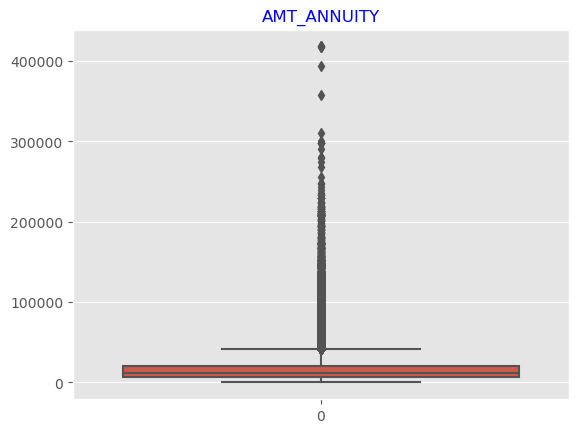

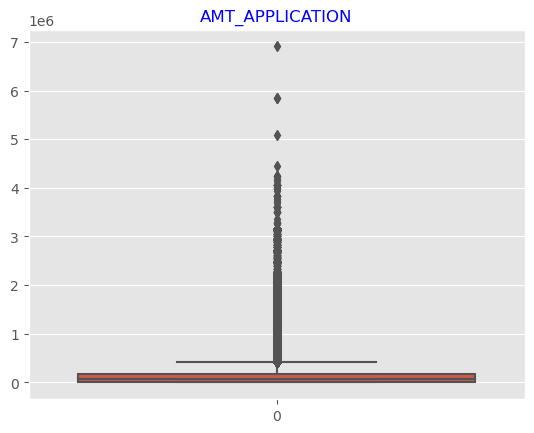

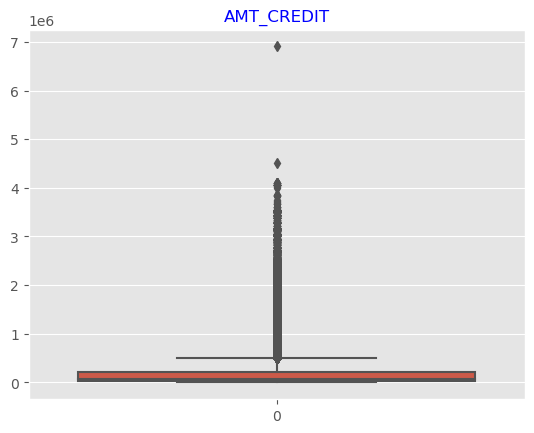

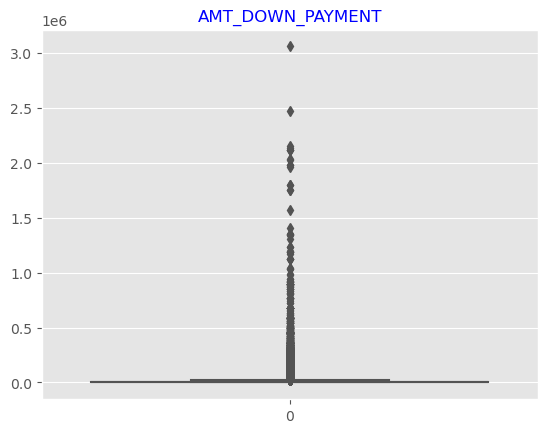

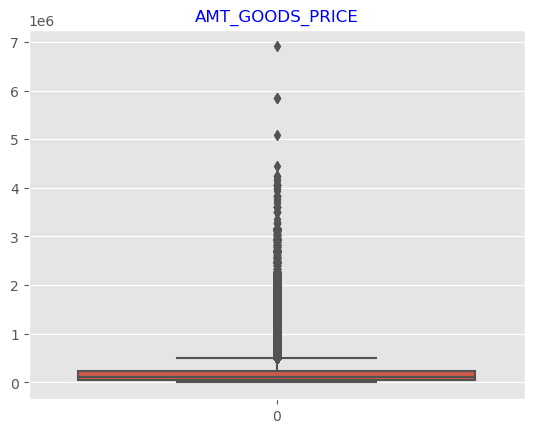

In [579]:
for i in app_prev_num_data:
    sns.boxplot(prev_app[i])
    plt.title(i,fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
    plt.show()

#### Outlier checking in AMT_ANNUITY Column

In [580]:
prev_app["AMT_ANNUITY"].describe()

count    1.297979e+06
mean     1.595512e+04
std      1.478214e+04
min      0.000000e+00
25%      6.321780e+03
50%      1.125000e+04
75%      2.065842e+04
max      4.180581e+05
Name: AMT_ANNUITY, dtype: float64

In [581]:
prev_app["AMT_ANNUITY"].quantile([0.5,0.7,0.9,0.95,0.99,0.999])

0.500     11250.0000
0.700     17783.1270
0.900     34703.8200
0.950     45336.7800
0.990     69685.7886
0.999    119231.4150
Name: AMT_ANNUITY, dtype: float64

In [582]:
prev_app[prev_app["AMT_ANNUITY"] > 119231].shape

(1309, 14)

**rows above 99% are in large numbers and caping these no. of values will not be a good idea as it might exaggerate our data**

In [583]:
print(prev_app[prev_app["AMT_ANNUITY"] > 250000].shape)
# Filtering out data above 250000 
annu_filt=prev_app[prev_app["AMT_ANNUITY"] > 250000]
print(annu_filt["AMT_ANNUITY"].median())

(18, 14)
298557.585


In [584]:
# Caping rows with AMT_ANNUITY more than 250000
prev_app.loc[(prev_app["AMT_ANNUITY"]>250000),"AMT_ANNUITY"]=298557

**Since there is a huge difference between 99.9% and maximum value of AMT_ANNUITY, I decide to cap values of AMT_ANNUITY more than 250000 with the median of these values i.e. 298557 as the number of rows for such values are less and wont affect our analysis much**

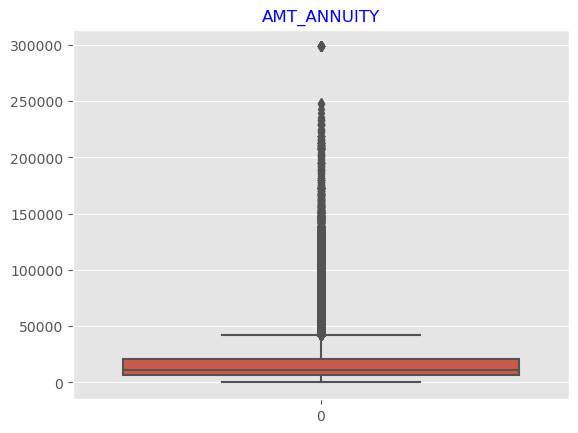

In [585]:
# checking box plot for AMT_ANNUITY
sns.boxplot(prev_app["AMT_ANNUITY"])
plt.title("AMT_ANNUITY",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
plt.show()

#### Outlier checking in AMT_APPLICATION Column

In [586]:
prev_app["AMT_APPLICATION"].describe()

count    1.670214e+06
mean     1.752339e+05
std      2.927798e+05
min      0.000000e+00
25%      1.872000e+04
50%      7.104600e+04
75%      1.803600e+05
max      6.905160e+06
Name: AMT_APPLICATION, dtype: float64

In [587]:
prev_app["AMT_APPLICATION"].quantile([0.5,0.7,0.9,0.95,0.99,0.999])

0.500      71046.0
0.700     144769.5
0.900     450000.0
0.950     787500.0
0.990    1350000.0
0.999    2250000.0
Name: AMT_APPLICATION, dtype: float64

In [588]:
prev_app[prev_app["AMT_APPLICATION"] > 2250000].shape

(1029, 14)

**rows above 99% are in large numbers and caping these no. of values will not be a good idea as it might exaggerate our data**

In [589]:
print(prev_app[prev_app["AMT_APPLICATION"] > 4000000].shape)
# Filtering out data with AMT_APPLICATION greater than 4000000
cond_appl=prev_app[prev_app["AMT_APPLICATION"] > 4000000]
print(cond_appl["AMT_APPLICATION"].median())

(23, 14)
4050000.0


In [590]:
# Caping rows with AMT_APPLICATION more than 4000000
prev_app.loc[(prev_app["AMT_APPLICATION"]>4000000),"AMT_APPLICATION"]=4050000.0

**Since there is a huge difference between 99.9% and maximum value of AMT_APPLICATION, I decide to cap values of AMT_APPLICATION more than 4000000 with the median of these values i.e. 4050000 as the number of rows for such values are less and wont affect our analysis much**

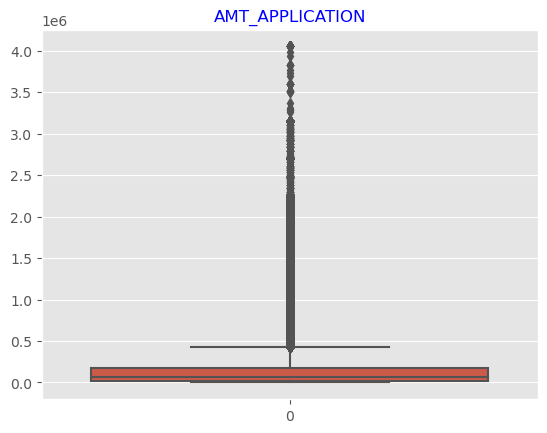

In [591]:
# checking box plot for AMT_APPLICATION
sns.boxplot(prev_app["AMT_APPLICATION"])
plt.title("AMT_APPLICATION",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
plt.show()

#### Outlier checking in AMT_CREDIT Column

In [592]:
prev_app["AMT_CREDIT"].describe()

count    1.670213e+06
mean     1.961140e+05
std      3.185746e+05
min      0.000000e+00
25%      2.416050e+04
50%      8.054100e+04
75%      2.164185e+05
max      6.905160e+06
Name: AMT_CREDIT, dtype: float64

In [593]:
prev_app["AMT_CREDIT"].quantile([0.5,0.7,0.9,0.95,0.99,0.999])

0.500      80541.0
0.700     167895.0
0.900     533160.0
0.950     886500.0
0.990    1515377.7
0.999    2517300.0
Name: AMT_CREDIT, dtype: float64

In [594]:
prev_app[prev_app["AMT_CREDIT"] > 2517300].shape

(978, 14)

**rows above 99% are in large numbers and caping these no. of values will not be a good idea as it might exaggerate our data**

In [595]:
print(prev_app[prev_app["AMT_CREDIT"] > 3700000].shape)
# Filtering out data with AMT_CREDIT greater than 3700000
cond_credit_prev=prev_app[prev_app["AMT_CREDIT"] > 3700000]
print(cond_credit_prev["AMT_CREDIT"].median())

(32, 14)
4050000.0


In [596]:
# capping rows with AMT_CREDIT more than 3700000
prev_app.loc[(prev_app["AMT_CREDIT"]>3700000),"AMT_CREDIT"]=4050000.0

**Since there is a huge difference between 99.9% and maximum value of AMT_CREDIT, I decide to cap values of AMT_CREDIT more than 3700000 with the median of these values i.e. 4050000 as the number of rows for such values are less and wont affect our analysis much**

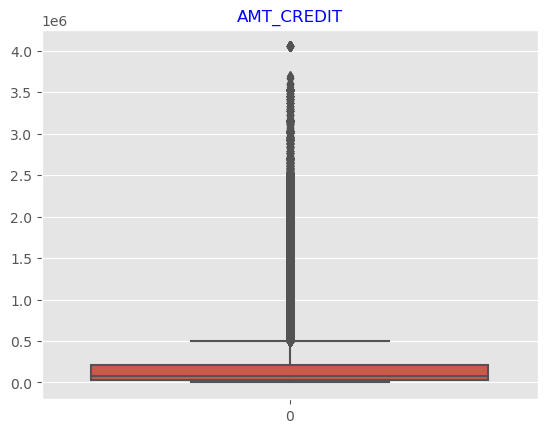

In [597]:
# checking box plot for AMT_CREDIT
sns.boxplot(prev_app["AMT_CREDIT"])
plt.title("AMT_CREDIT",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
plt.show()

#### Outlier checking in AMT_DOWN_PAYMENT Column

In [598]:
prev_app["AMT_DOWN_PAYMENT"].describe()

count    7.743700e+05
mean     6.697402e+03
std      2.092150e+04
min     -9.000000e-01
25%      0.000000e+00
50%      1.638000e+03
75%      7.740000e+03
max      3.060045e+06
Name: AMT_DOWN_PAYMENT, dtype: float64

In [599]:
prev_app["AMT_DOWN_PAYMENT"].quantile([0.5,0.7,0.9,0.95,0.99,0.999])

0.500      1638.0000
0.700      6057.0000
0.900     17109.0000
0.950     26184.0825
0.990     65930.8950
0.999    208801.9602
Name: AMT_DOWN_PAYMENT, dtype: float64

In [600]:
prev_app[prev_app["AMT_DOWN_PAYMENT"] > 208801 ].shape

(775, 14)

**rows above 99% are in large numbers and caping these no. of values will not be a good idea as it might exaggerate our data**

In [601]:
print(prev_app[prev_app["AMT_DOWN_PAYMENT"] > 500000 ].shape)
# Filtering out prev_app data with AMT_DOWN_PAYMENT greater tha 500000
cond_down=prev_app[prev_app["AMT_DOWN_PAYMENT"] > 500000]
print(cond_down["AMT_DOWN_PAYMENT"].median())

(141, 14)
765000.0


In [602]:
# capping rows with AMT_DOWN_PAYMENT more than 500000
prev_app.loc[(prev_app["AMT_DOWN_PAYMENT"]>500000),"AMT_DOWN_PAYMENT"]=765000

**Since there is a huge difference between 99.9% and maximum value of AMT_DOWN_PAYMENT, I decide to cap values of AMT_DOWN_PAYMENT more than 500000 with the median of these values i.e. 765000 as the number of rows for such values are less and wont affect our analysis much**

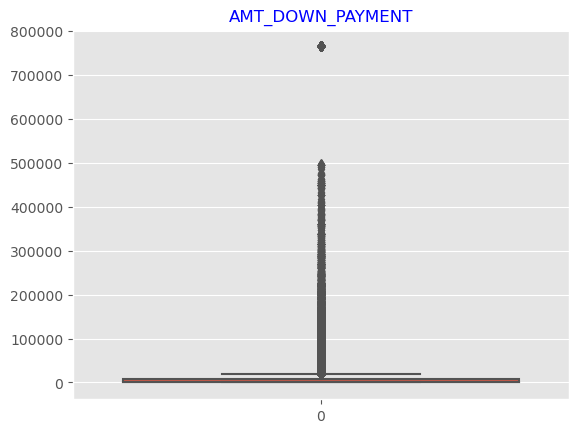

In [603]:
# checking box plot for AMT_DOWN_PAYMENT
sns.boxplot(prev_app["AMT_DOWN_PAYMENT"])
plt.title("AMT_DOWN_PAYMENT",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
plt.show()

#### Outlier checking for AMT_GOODS_PRICE Column

In [604]:
prev_app["AMT_GOODS_PRICE"].describe()

count    1.284699e+06
mean     2.278473e+05
std      3.153966e+05
min      0.000000e+00
25%      5.084100e+04
50%      1.123200e+05
75%      2.340000e+05
max      6.905160e+06
Name: AMT_GOODS_PRICE, dtype: float64

In [605]:
prev_app["AMT_GOODS_PRICE"].quantile([0.5,0.7,0.9,0.95,0.99,0.999])

0.500     112320.0
0.700     211500.0
0.900     585000.0
0.950     900000.0
0.990    1395000.0
0.999    2250000.0
Name: AMT_GOODS_PRICE, dtype: float64

In [606]:
prev_app[prev_app["AMT_GOODS_PRICE"] > 2250000 ].shape

(1029, 14)

**rows above 99% are in large numbers and caping these no. of values will not be a good idea as it might exaggerate our data**

In [607]:
print(prev_app[prev_app["AMT_GOODS_PRICE"] > 3500000 ].shape)
# Filtering out data with AMT_GOODS_PRICE greater than 3500000
cond_good_prev=prev_app[prev_app["AMT_GOODS_PRICE"] > 3500000 ]
print(cond_good_prev["AMT_GOODS_PRICE"].median())

(48, 14)
3959235.0


In [608]:
# capping rows with AMT__GOODS_PRICE more than 3500000
prev_app.loc[(prev_app["AMT_GOODS_PRICE"]>3500000),"AMT_GOODS_PRICE"]=3959235

**Since there is a huge difference between 99.9% and maximum value of AMT_GOOD_PRICE, I decide to cap values of AMT_GOODS_PRICE more than 3500000 with the median of these values i.e.  3959235 as the number of rows for such values are less and wont affect our analysis much**

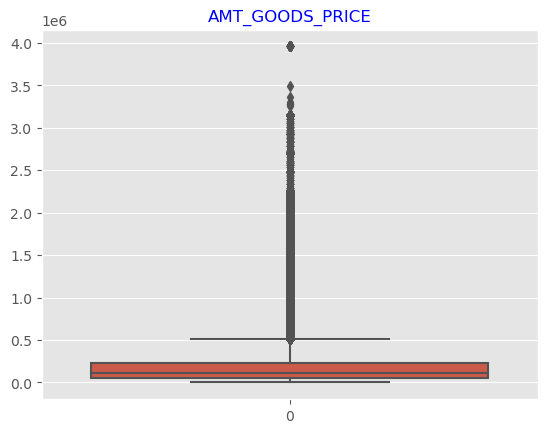

In [609]:
# checking box plot for AMT_GOODS_PRICE
sns.boxplot(prev_app["AMT_GOODS_PRICE"])
plt.title("AMT_GOODS_PRICE",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
plt.show()

## Univariate Analysis of Previous Application Dataset

In [611]:
# For better analysis, lets filter out previous application data into approved and refused

# Filtering out approved loan data:
approved_data=prev_app[prev_app["NAME_CONTRACT_STATUS"]=="Approved"]

# Filtering out refused loan data:
refused_data=prev_app[prev_app["NAME_CONTRACT_STATUS"]=="Refused"]

#### Univariate analysis of Categorical data

NAME_CONTRACT_TYPE


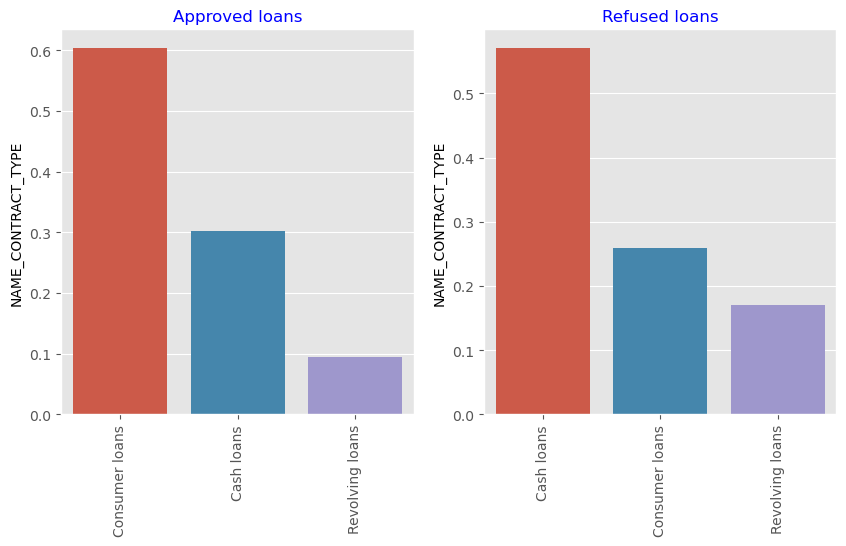

<Figure size 640x480 with 0 Axes>

NAME_CONTRACT_STATUS


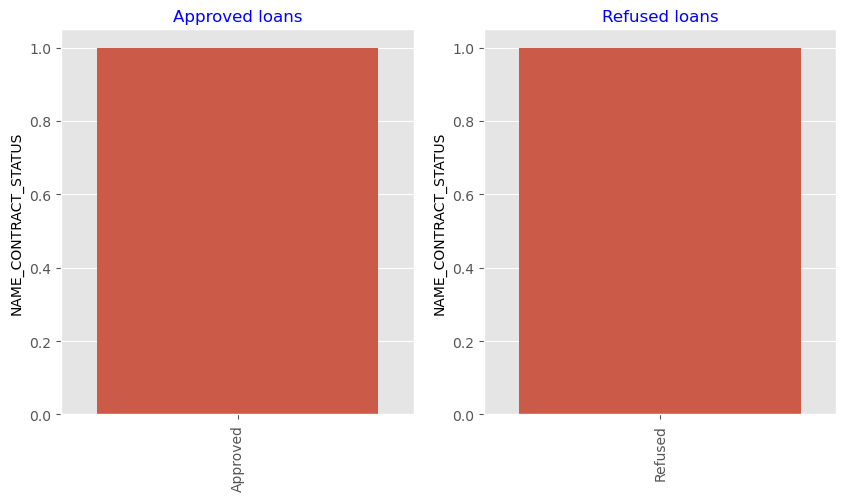

<Figure size 640x480 with 0 Axes>

NAME_PAYMENT_TYPE


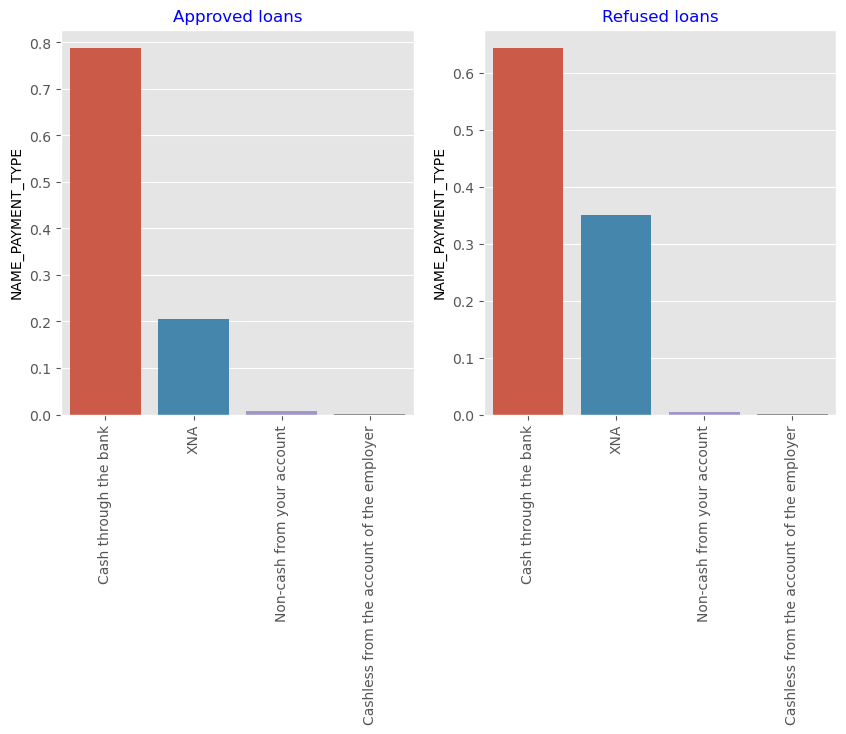

<Figure size 640x480 with 0 Axes>

CODE_REJECT_REASON


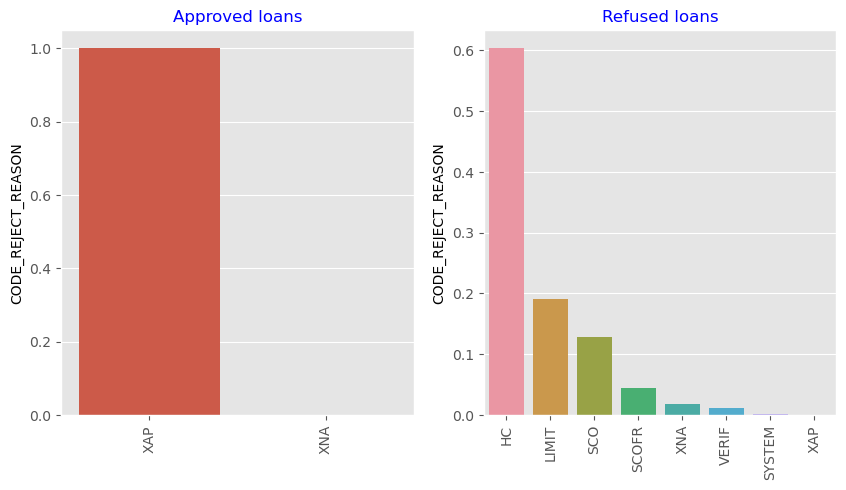

<Figure size 640x480 with 0 Axes>

NAME_CLIENT_TYPE


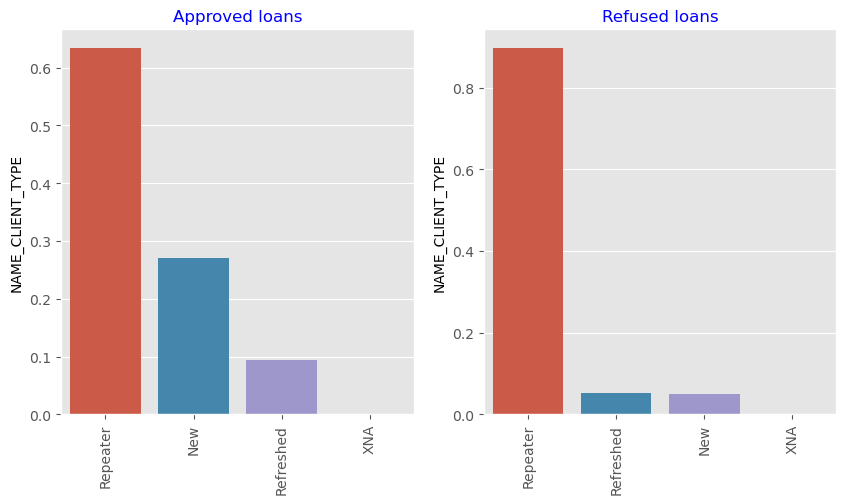

<Figure size 640x480 with 0 Axes>

NAME_GOODS_CATEGORY


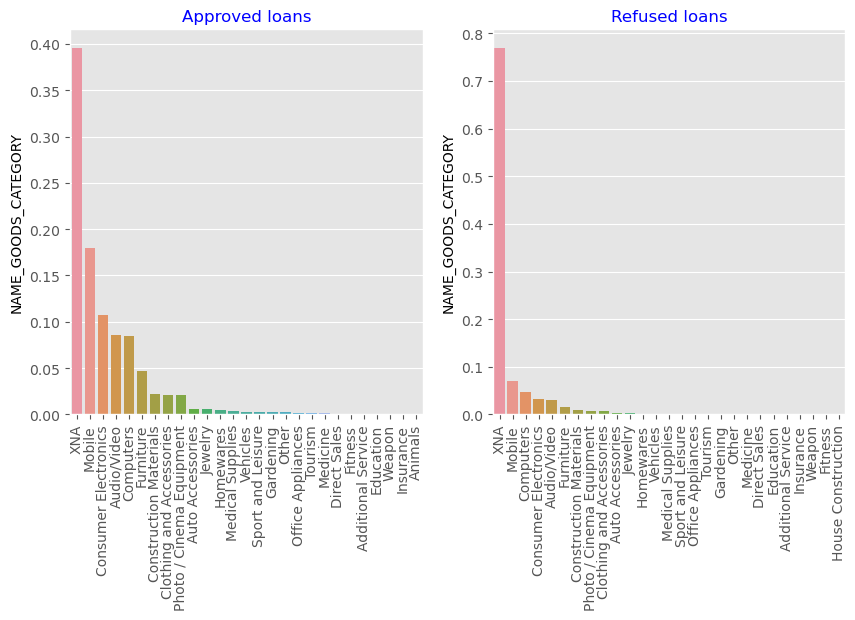

<Figure size 640x480 with 0 Axes>

NAME_PORTFOLIO


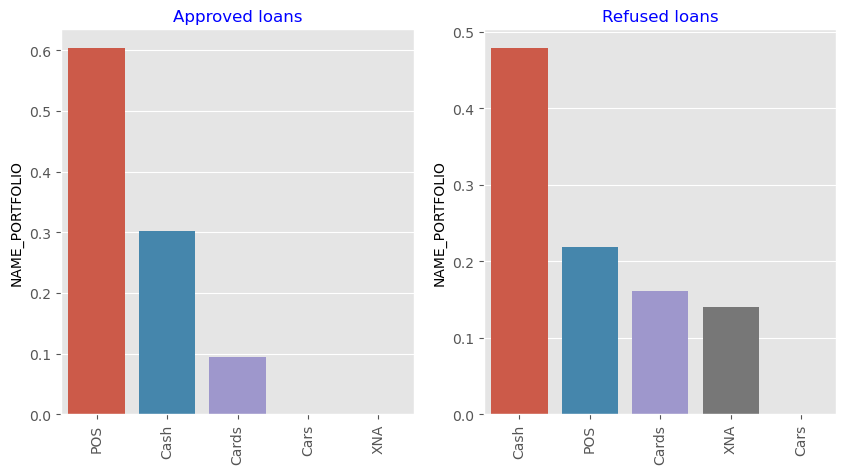

<Figure size 640x480 with 0 Axes>

In [476]:
for i in app_prev_categ_data:
    plt.figure(figsize=(10,5))
    print("\033[1m" + i + "\033[0m")
    categ_data_approve=approved_data[i].value_counts(normalize=True)
    categ_data_refuse=refused_data[i].value_counts(normalize=True)

    plt.subplot(1,2,1)
    sns.barplot(x=categ_data_approve.index,y=categ_data_approve)
    plt.xticks(rotation=90)
    plt.title("Approved loans",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
    
    plt.subplot(1,2,2)
    sns.barplot(x=categ_data_refuse.index,y=categ_data_refuse)
    plt.xticks(rotation=90)
    plt.title("Refused loans",fontdict={"fontsize":12,"fontweight":10,"color":"blue"})
    plt.show()
    
    plt.tight_layout(pad =2)
    plt.show()

**Conclusion drawn**
1. **NAME_CONTRACT_TYPE**: percentage of approved cash loans are less than rejected cash loans and percentage of rejected revolving loans is more than approved revolving loans.
2. **NAME_PAYMENT_TYPE**: percentage of payment type cash through the bank is higher for approved loans as compared to refused loans.
2. **NAME_CLIENT_TYPE**:Repeater clients have high chances of refused loans.
3. **NAME_GOODS_CATEGORY**: Loans for Mobile phones have highest percentage of approval.
4. **NAME_PORTFOLIO**: percentage of cash portfolio is higher for refused loans.

#### Univariate analysis of Numerical data

AMT_ANNUITY


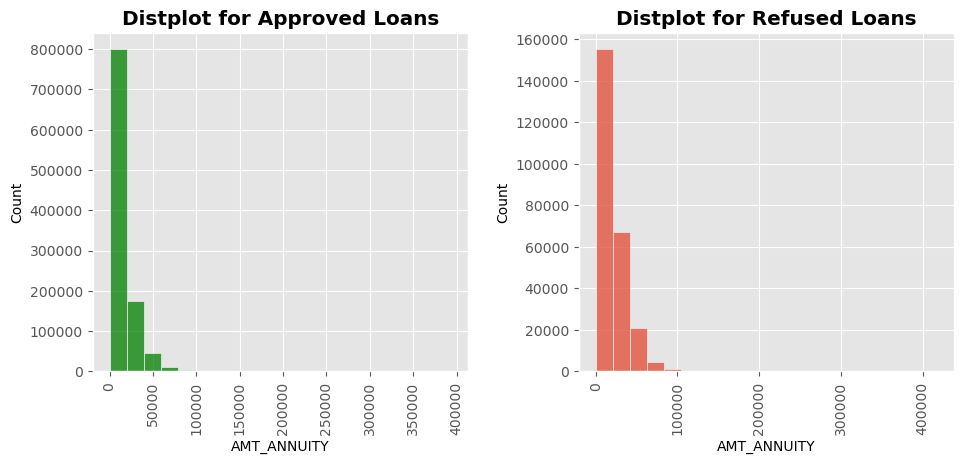

AMT_APPLICATION


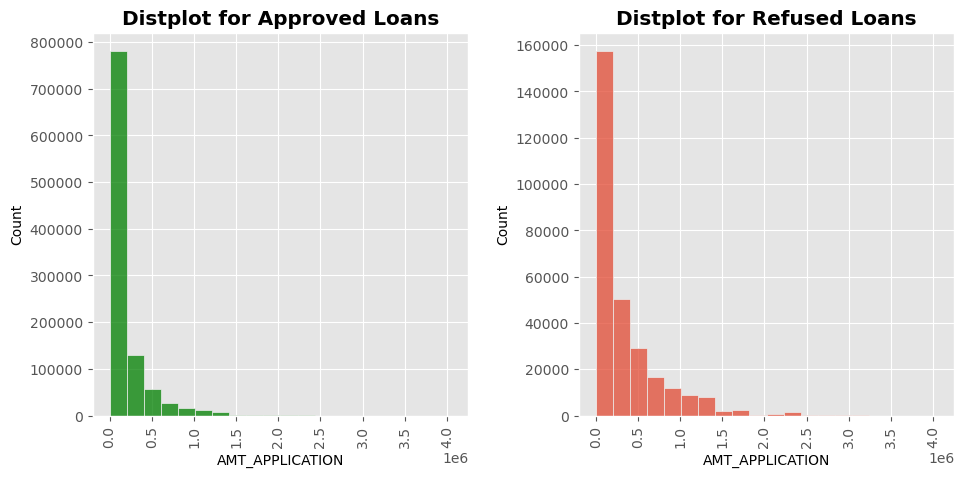

AMT_CREDIT


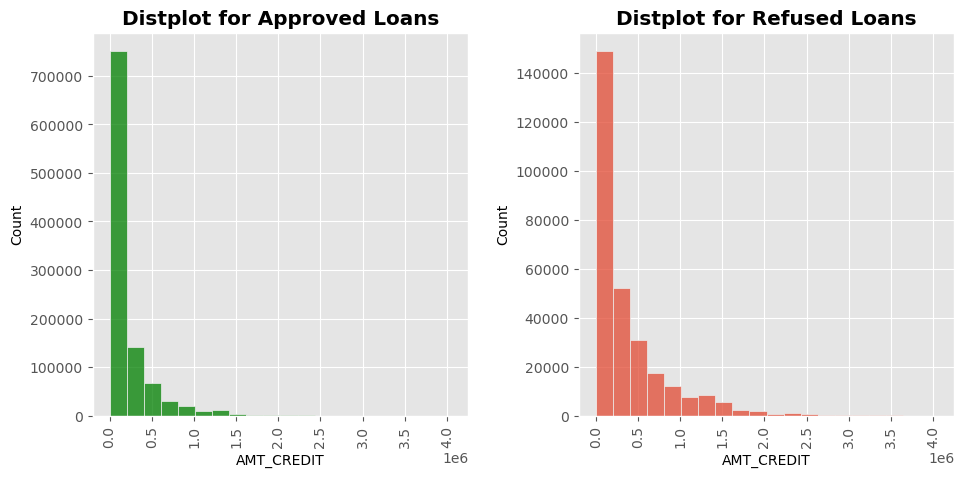

AMT_DOWN_PAYMENT


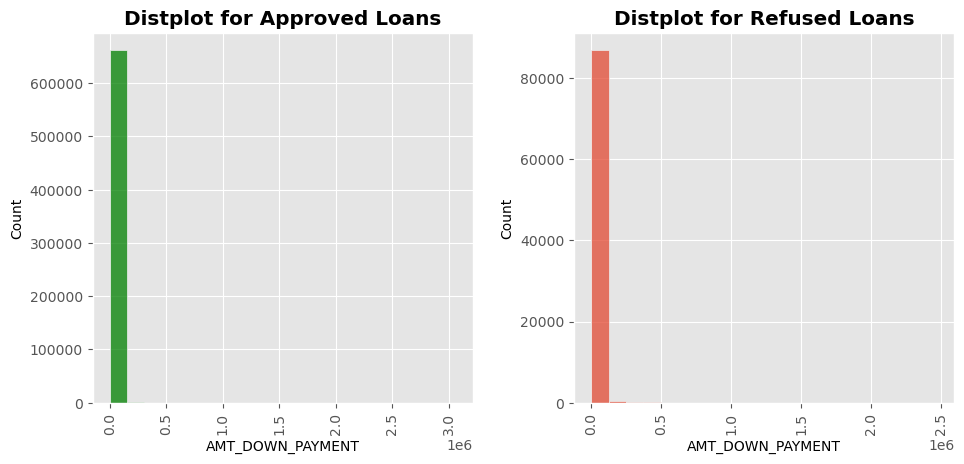

AMT_GOODS_PRICE


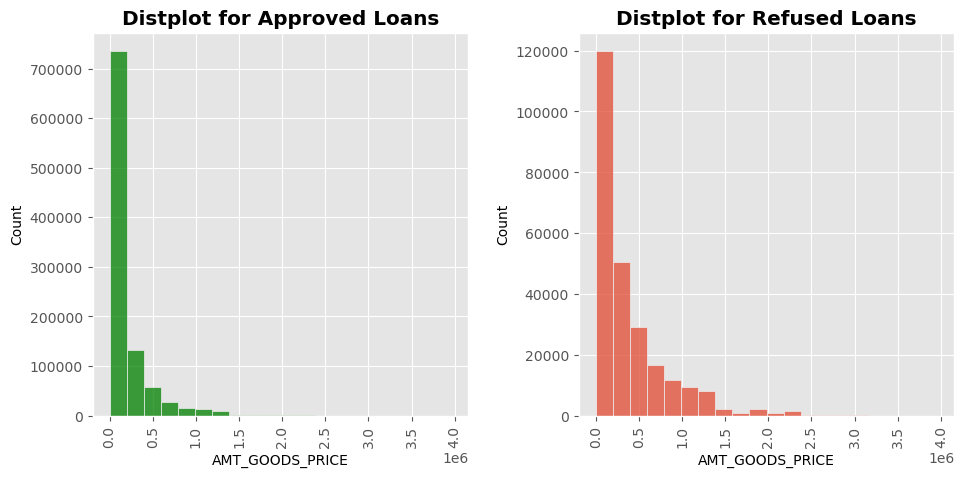

In [432]:
for i in app_prev_num_data:
    plt.figure(figsize=(10,5))
    print("\033[1m" + i + "\033[0m")

    plt.subplot(1, 2, 1)
    plt.style.use("ggplot")
    sns.histplot(approved_data[i],bins=20,color="g")
    plt.title("Distplot for Approved Loans", fontweight="heavy")
    plt.xticks(rotation=90)
    
    plt.subplot(1, 2, 2)
    plt.style.use("ggplot")
    sns.histplot(refused_data[i],bins=20)
    plt.title("Distplot for Refused Loans", fontweight="heavy")
    plt.xticks(rotation=90)
    
    plt.tight_layout(pad =2)
    plt.show()

**Conclusions**:
1. **AMT_ANNUITY**: Data for AMT_ANNUITY is distributed in range of 0-50000 for approved and 0 to 100000 for refused loans
2. **AMT_APPLICATION**: Data for AMT_APPLICATION is distributed in range of 0-1.5 million for approved and 0 to 2.5 million for refused loans.
3. **AMT_CREDIT**:Data for AMT_CREDIT is distributed in range of 0-1.5 million for approved and 0 to 2.5 million for refused loans.
4. **AMT_GOODS_PRICE**::Data for AMT_GOOD_PRICE is distributed in range of 0-1.5 million for approved and 0 to 2.5 million for refused loans.

### Bivariate analysis of Numeric Data

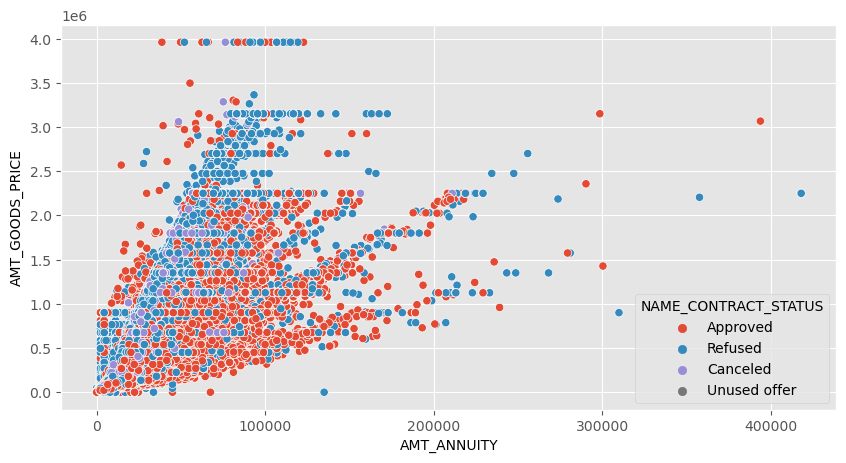

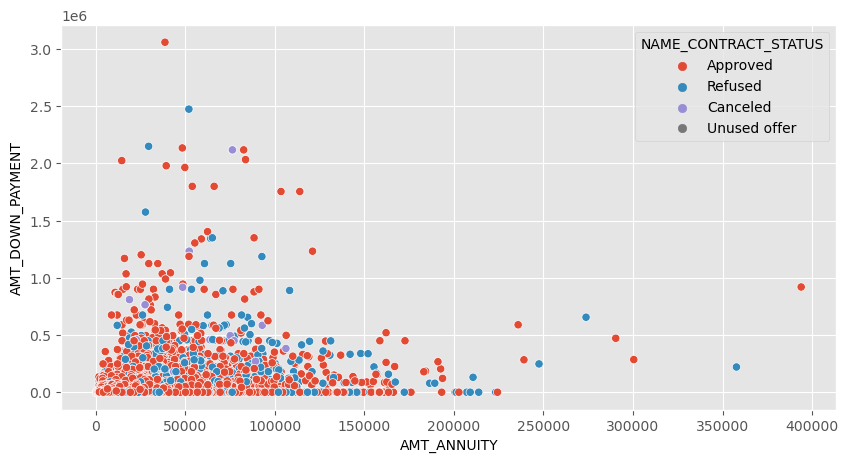

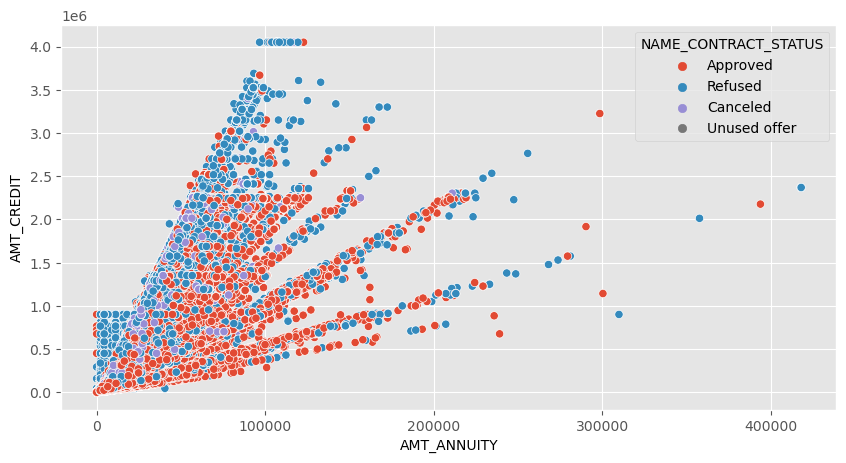

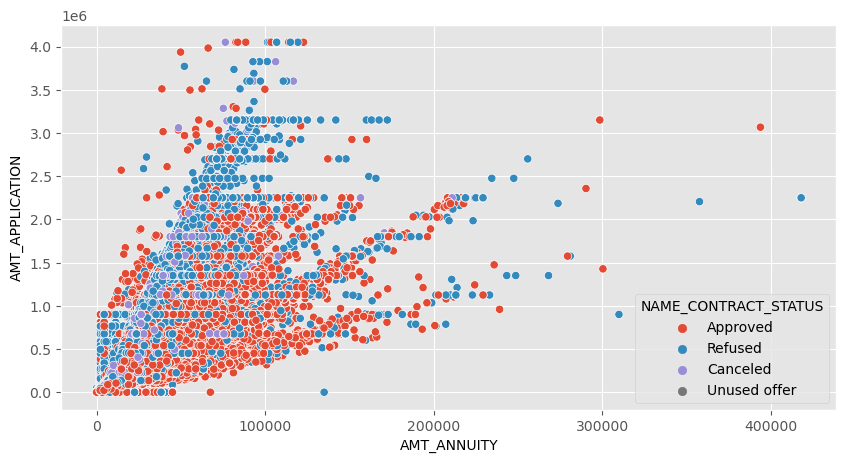

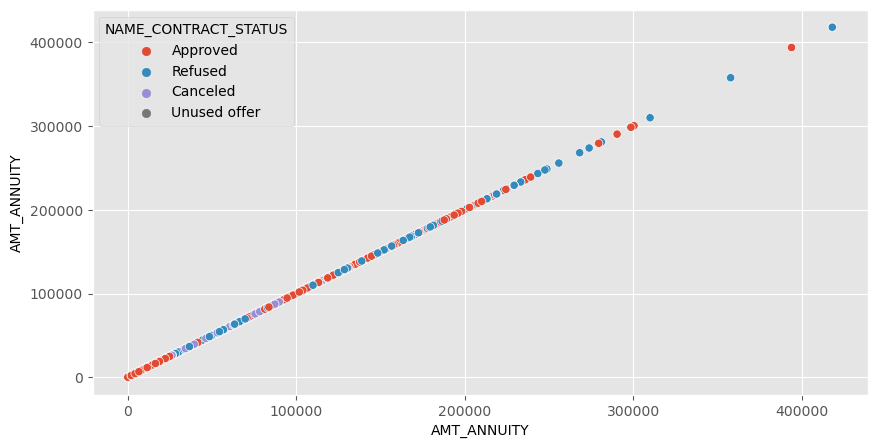

...

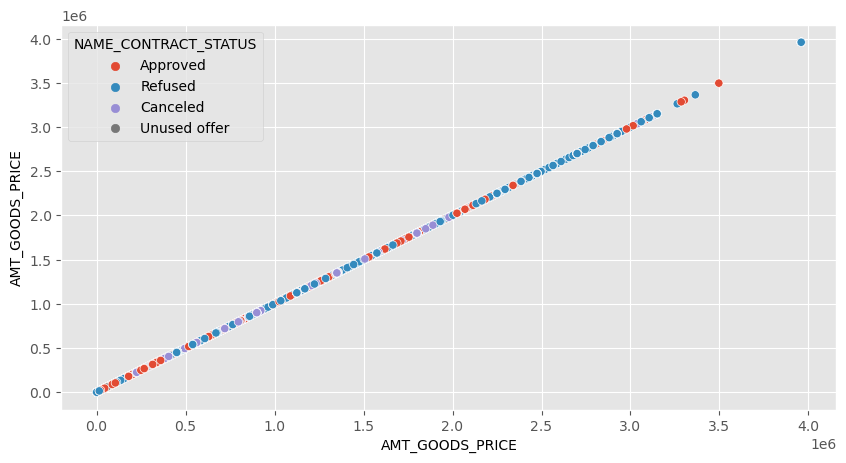

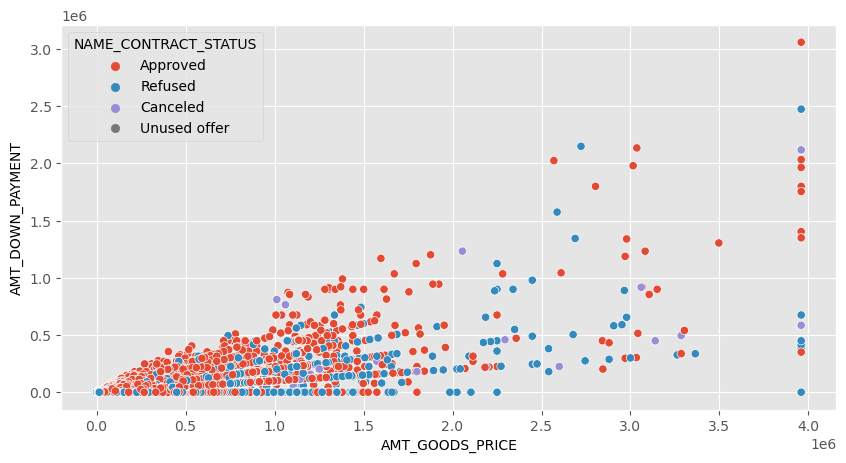

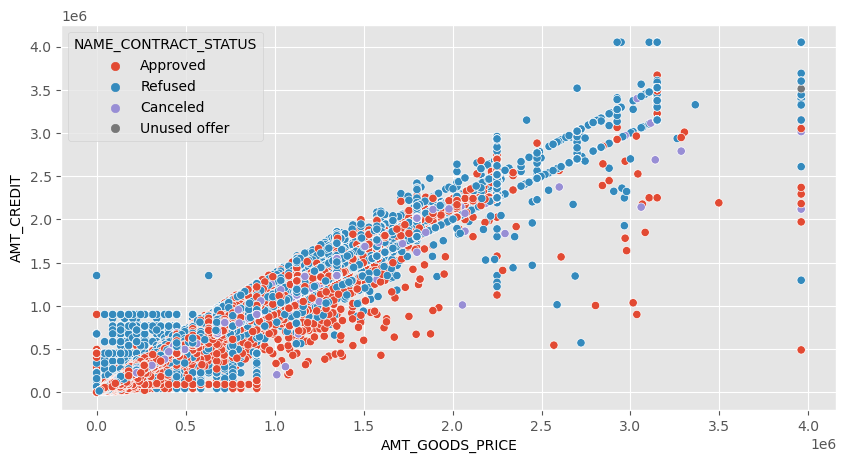

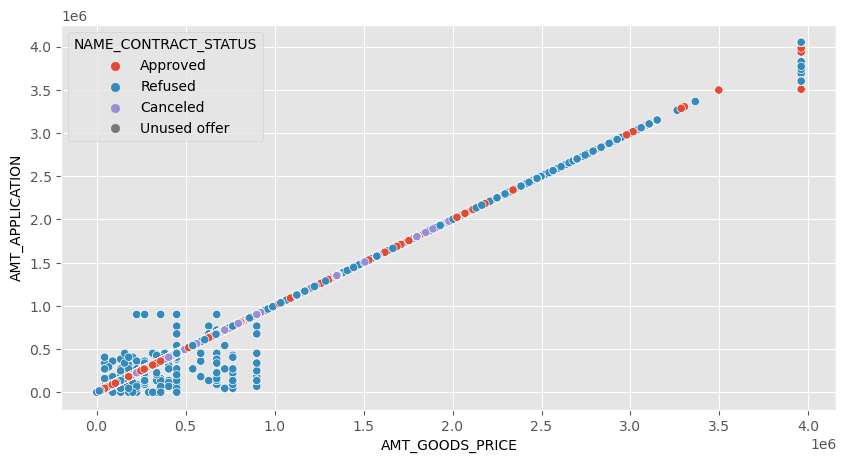

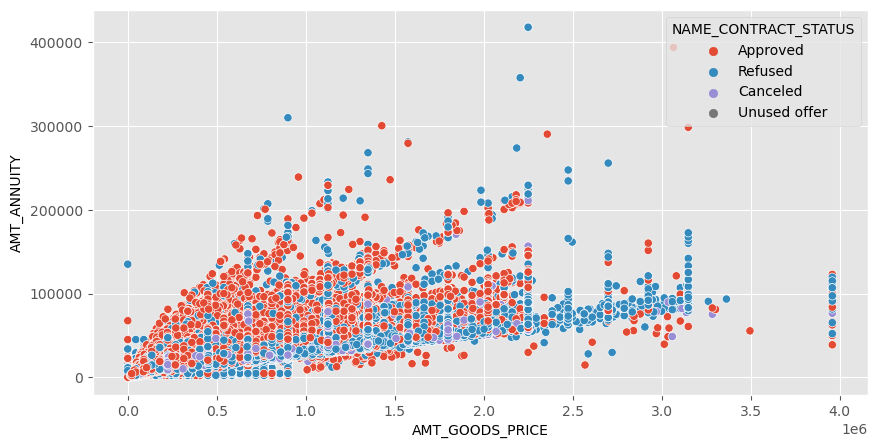

In [433]:
for i in app_prev_num_data:
    for j in app_prev_num_data[::-1]:
        plt.figure(figsize=(10,5))
        sns.scatterplot(x=i,y=j,data=prev_app,hue="NAME_CONTRACT_STATUS")
        plt.show()

**Conclusions**
1. Loan applications with annuity amount less than 0.15 million and goods price less than 3 million have higher chance of rejection
2. There is linear relationship between AMT_CREDIT and AMT_ANNUITY.
3. AMT_APPLICATION and AMT_GOODS_PRICE have linear relationship. Applications with less than 0.5 million amount and goods price less than 0.5 million  have high chances of approval.
4. AMT_CREDIT and AMT_APPLICATION have linear relationship. 
5. AMT_DOWN_PAYMENT and AMT_GOODS_PRICE have linear relationship. Applications less than 1 million good price and down payment 300000 have more chances of approval.
6. AMT_APPLICATION and AMT_DOWN_PAYMENT have linear relationship. Applications less than 2 million application amount and down payment less than 500000 have more chances of rejection.

### BIVARIATE ANALYSIS OF CATEGORICAL AND NUMERICAL COLUMNS

#### 1. NAME_GOODS_CATEGORY V/S AMT_APPLICATION

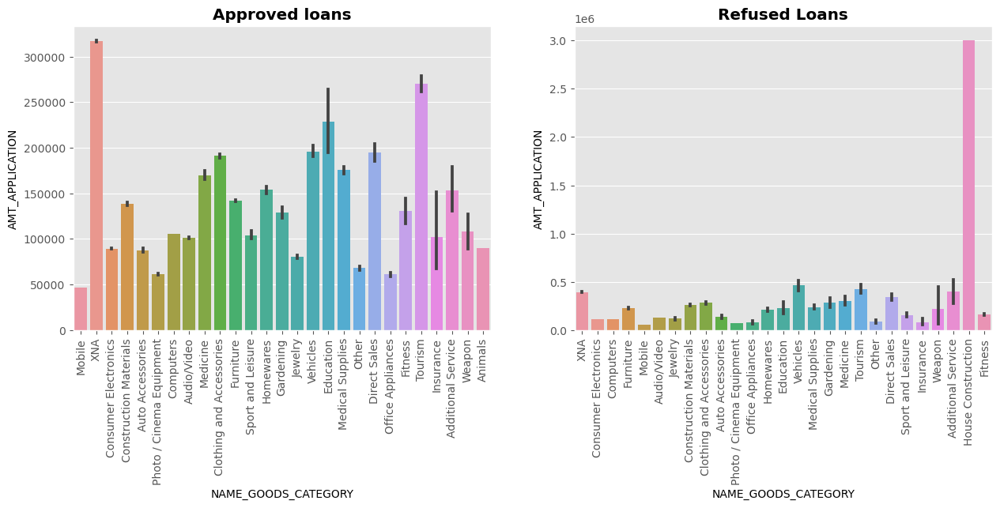

In [492]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.barplot(x="NAME_GOODS_CATEGORY",y="AMT_APPLICATION",data=approved_data)
plt.title("Approved loans", fontweight="heavy")
plt.xticks(rotation=90)

plt.subplot(1,2,2)
sns.barplot(x="NAME_GOODS_CATEGORY",y="AMT_APPLICATION",data=refused_data)
plt.title("Refused Loans", fontweight="heavy")
plt.xticks(rotation=90)
plt.show()

**Conclusion:For Tourism aplication amount is more in case of approved loans than in case of refused loans.**

### 2. NAME_CONTRACT_TYPE V/S AMT_ANNUITY

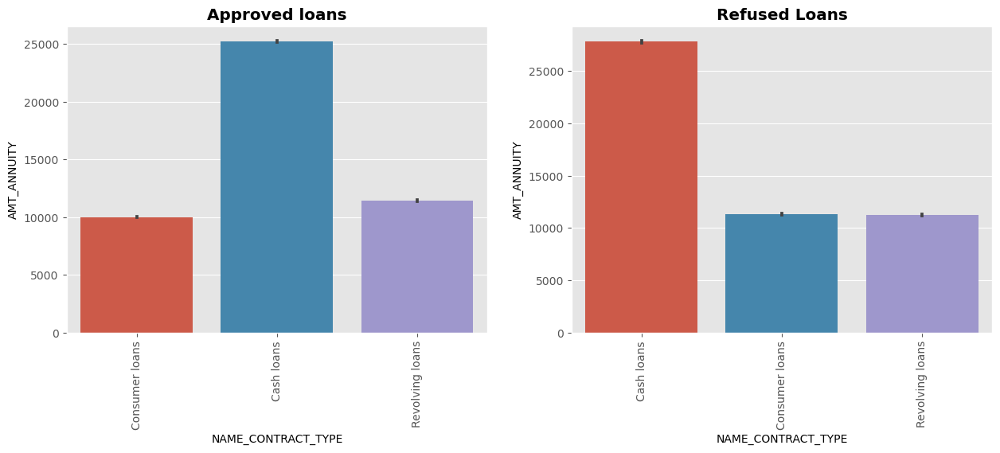

In [477]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.barplot(x="NAME_CONTRACT_TYPE",y="AMT_ANNUITY",data=approved_data)
plt.title("Approved loans", fontweight="heavy")
plt.xticks(rotation=90)

plt.subplot(1,2,2)
sns.barplot(x="NAME_CONTRACT_TYPE",y="AMT_ANNUITY",data=refused_data)
plt.title("Refused Loans", fontweight="heavy")
plt.xticks(rotation=90)
plt.show()

**Conclusion:For cash loans annuity amount is less in case of approved loans than in case of refused loans.**

### 3. NAME_PORTFOLIO V/S AMT_CREDIT

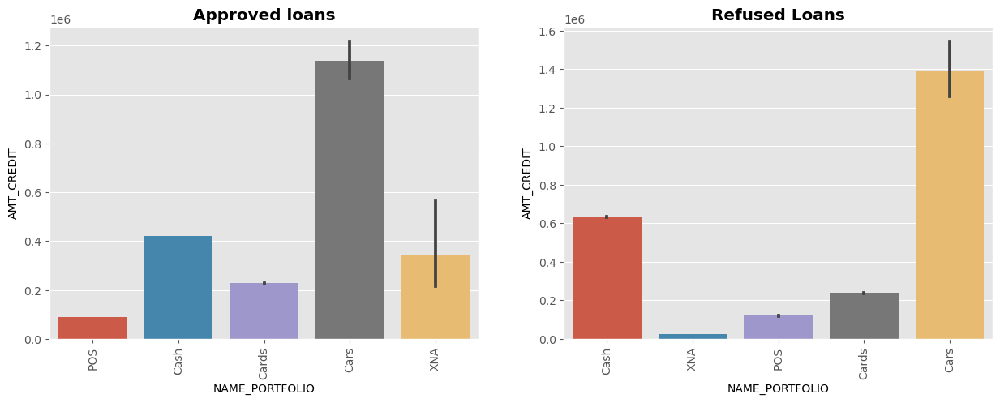

In [494]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.barplot(x="NAME_PORTFOLIO",y="AMT_CREDIT",data=approved_data)
plt.title("Approved loans", fontweight="heavy")
plt.xticks(rotation=90)

plt.subplot(1,2,2)
sns.barplot(x="NAME_PORTFOLIO",y="AMT_CREDIT",data=refused_data)
plt.title("Refused Loans", fontweight="heavy")
plt.xticks(rotation=90)
plt.show()

#### Bivariate analysis of Categorical Data

#### 1. NAME_CONTRACT_TYPE vs NAME_CLIENT_TYPE

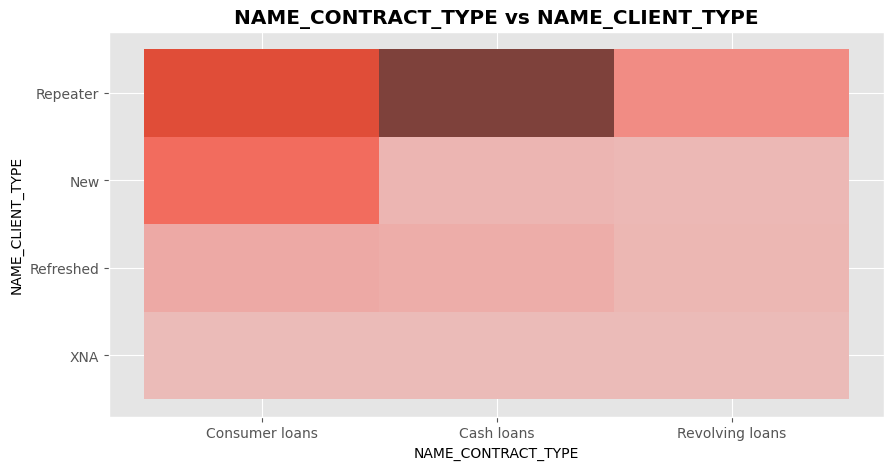

In [478]:
plt.figure(figsize=(10,5))
sns.histplot(data=prev_app,x=prev_app["NAME_CONTRACT_TYPE"],y=prev_app["NAME_CLIENT_TYPE"], kde = True)
plt.title("NAME_CONTRACT_TYPE vs NAME_CLIENT_TYPE", fontweight="heavy")
plt.show()

**Conclusion**: More Repeater clients apply for cash loans than any other type.

#### 2. NAME_CONTRACT_TYPE vs NAME_PAYMENT_TYPE

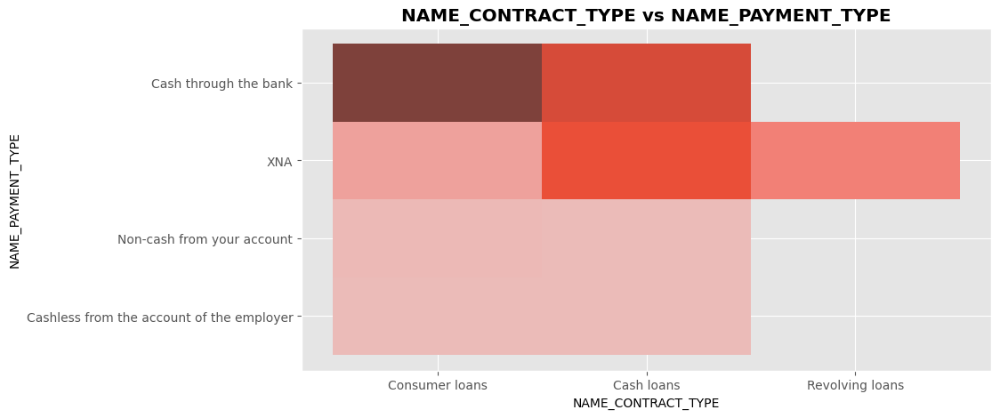

In [479]:
plt.figure(figsize=(10,5))
sns.histplot(data=prev_app,x=prev_app["NAME_CONTRACT_TYPE"],y=prev_app["NAME_PAYMENT_TYPE"], kde = True)
plt.title("NAME_CONTRACT_TYPE vs NAME_PAYMENT_TYPE", fontweight="heavy")
plt.show()

**Conclusion**: More Consumer loans are paid via cash through bank

#### 3.NAME_CONTRACT_TYPE v/s NAME_GOODS_CATEGORY

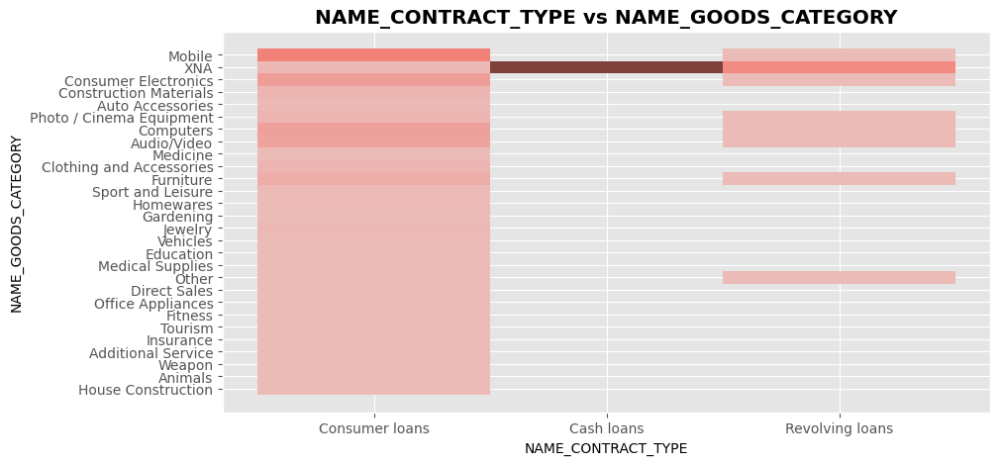

In [480]:
plt.figure(figsize=(10,5))
sns.histplot(data=prev_app,x=prev_app["NAME_CONTRACT_TYPE"],y=prev_app["NAME_GOODS_CATEGORY"], kde = True)
plt.title("NAME_CONTRACT_TYPE vs NAME_GOODS_CATEGORY", fontweight="heavy")
plt.show()

**Conclusion**:Most consumer loans are for mobiles

#### 4. NAME_CONTRACT_TYPE vs CODE_REJECT_REASON

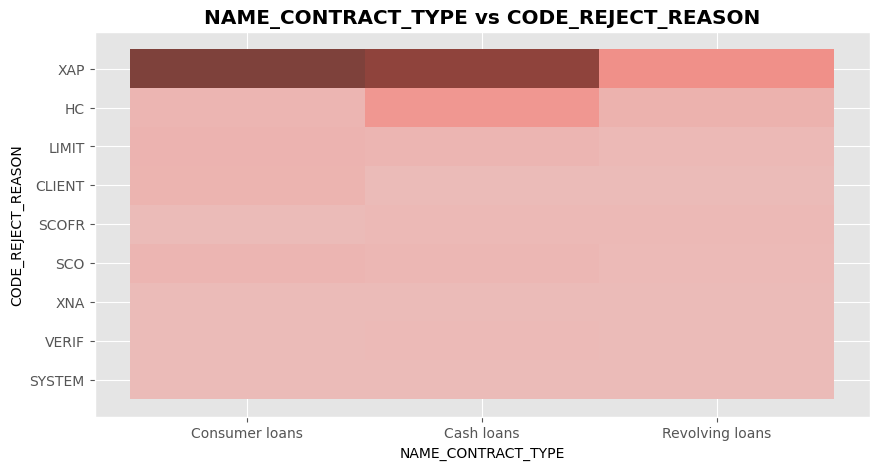

In [481]:
plt.figure(figsize=(10,5))
sns.histplot(data=prev_app,x=prev_app["NAME_CONTRACT_TYPE"],y=prev_app["CODE_REJECT_REASON"], kde = True)
plt.title("NAME_CONTRACT_TYPE vs CODE_REJECT_REASON", fontweight="heavy")
plt.show()

**Conclusion**:More cash loans have HC code reject reason.

#### 5.NAME_GOODS_CATEGORY vs CODE_REJECT_REASON

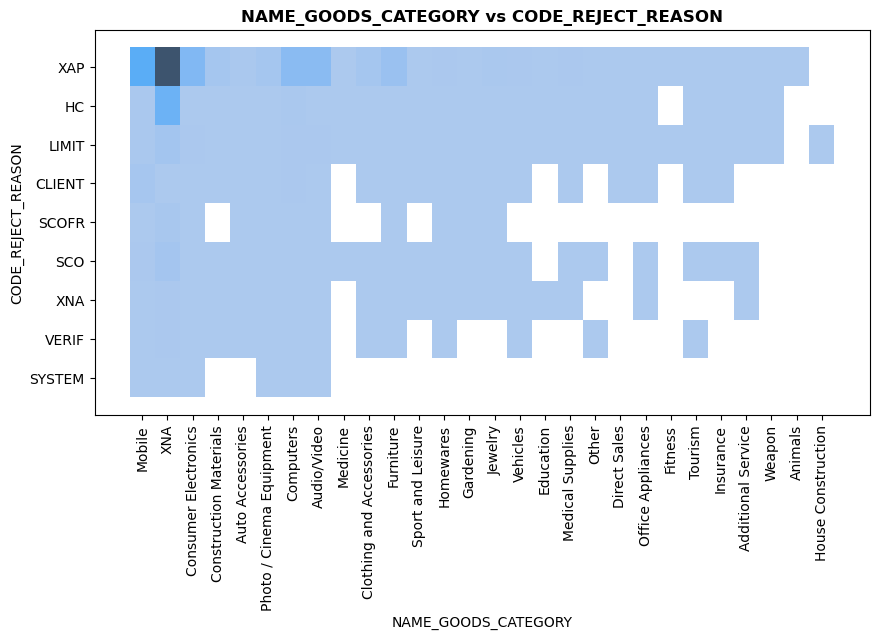

In [10]:
plt.figure(figsize=(10,5))
sns.histplot(data=prev_app,x=prev_app["NAME_GOODS_CATEGORY"],y=prev_app["CODE_REJECT_REASON"], kde = True)
plt.title("NAME_GOODS_CATEGORY vs CODE_REJECT_REASON", fontweight="heavy")
plt.xticks(rotation=90)
plt.show()

**Conclusion**:More Mobiles loan applications have XAP rejection reason.

## Multivariate Analysis of Previous application data

In [482]:
prev_app["NAME_CONTRACT_STATUS"].value_counts()

Approved        1036781
Canceled         316319
Refused          290678
Unused offer      26436
Name: NAME_CONTRACT_STATUS, dtype: int64

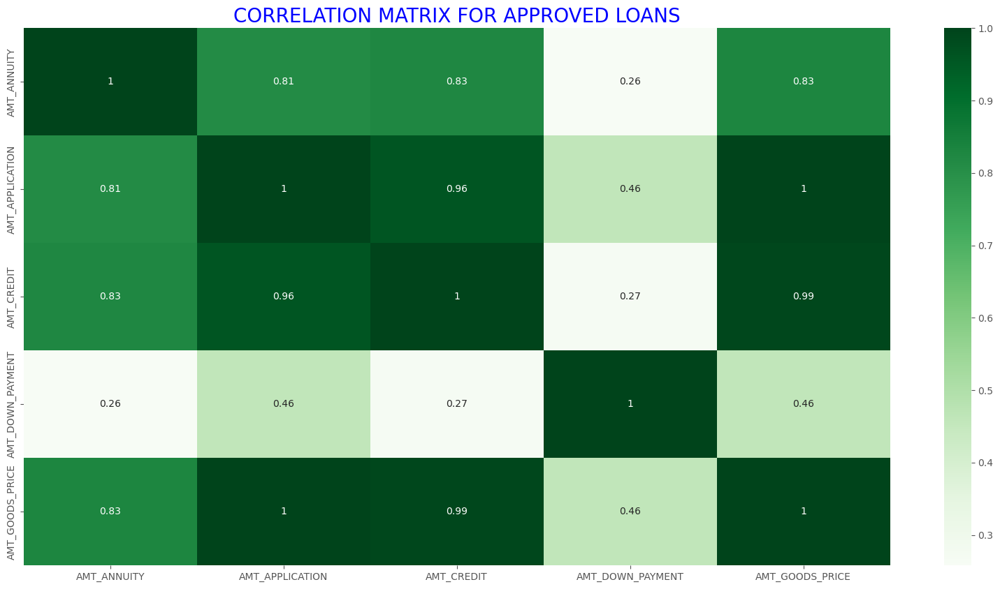

In [483]:
# Plotting heat map for Approved loans
plt.figure(figsize=(20,10))
# Filtering out previous application data which has contract status approved
app_1=prev_app[prev_app["NAME_CONTRACT_STATUS"]=="Approved"]
sns.heatmap(app_1[app_prev_num_data].corr(),annot=True,cmap="Greens")
plt.title("CORRELATION MATRIX FOR APPROVED LOANS",fontdict={"fontsize":20,"fontweight":10,"color":"blue"})
plt.show()

### Top 10 correlations of Approved loans

In [484]:
# Calculating the correlations
correlations = app_1.corr()

# Getting the correlations
top_correlations = correlations.unstack().sort_values(ascending=False)

# Filtering out correlations = 1
top_correlations = top_correlations[top_correlations != 1]

# Droping NaN values
top_correlations = top_correlations.dropna()

# Selecting the top 10 correlations
top_10_correlations = top_correlations.head(10)

print("Top 10 correlations for Approved loans:")
print(top_10_correlations)

Top 10 correlations for Approved loans:
AMT_CREDIT       AMT_GOODS_PRICE    0.993244
AMT_GOODS_PRICE  AMT_CREDIT         0.993244
AMT_APPLICATION  AMT_CREDIT         0.961757
AMT_CREDIT       AMT_APPLICATION    0.961757
AMT_ANNUITY      AMT_GOODS_PRICE    0.830859
AMT_GOODS_PRICE  AMT_ANNUITY        0.830859
AMT_CREDIT       AMT_ANNUITY        0.826005
AMT_ANNUITY      AMT_CREDIT         0.826005
                 AMT_APPLICATION    0.814343
AMT_APPLICATION  AMT_ANNUITY        0.814343
dtype: float64


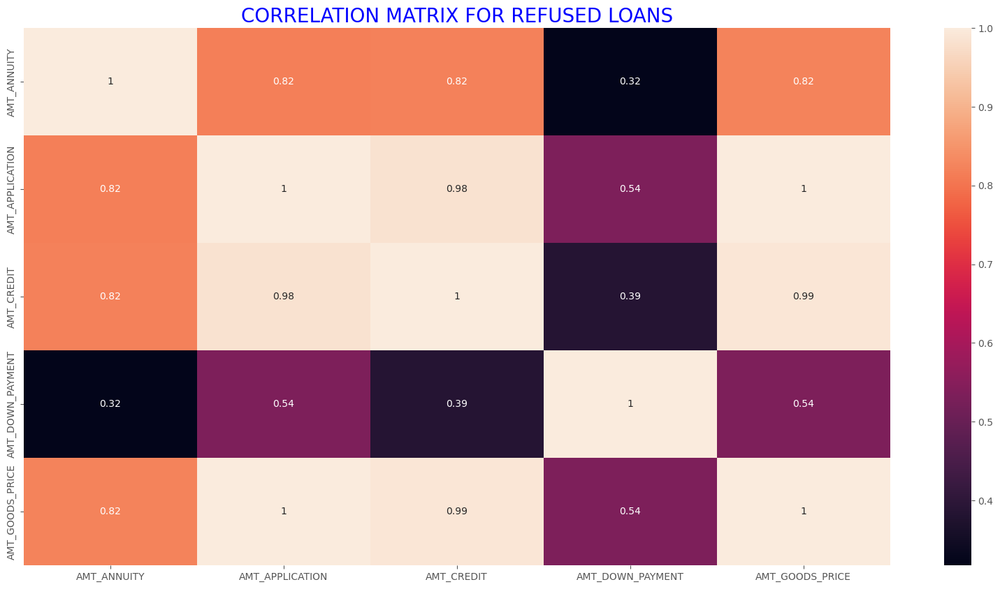

In [485]:
# Plotting heatmap for refused loans
plt.figure(figsize=(20,10))
# Filtering out previous application data which has contract status refused
app_2=prev_app[prev_app["NAME_CONTRACT_STATUS"]=="Refused"]
sns.heatmap(app_2[app_prev_num_data].corr(),annot=True)
plt.title("CORRELATION MATRIX FOR REFUSED LOANS",fontdict={"fontsize":20,"fontweight":10,"color":"blue"})
plt.show()

### Top 10 correlations of Refused loans

In [487]:
# Calculating the correlations
correlations = app_2.corr()

# Getting the correlations
top_correlations = correlations.unstack().sort_values(ascending=False)

# Filtering out correlations = 1
top_correlations = top_correlations[top_correlations != 1]

# Droping NaN values
top_correlations = top_correlations.dropna()

# Selecting the top 10 correlations
top_10_correlations = top_correlations.head(10)

print("Top 10 correlations for refused loans:")
print(top_10_correlations)

Top 10 correlations for refused loans:
AMT_GOODS_PRICE  AMT_APPLICATION    0.999699
AMT_APPLICATION  AMT_GOODS_PRICE    0.999699
AMT_CREDIT       AMT_GOODS_PRICE    0.991777
AMT_GOODS_PRICE  AMT_CREDIT         0.991777
AMT_CREDIT       AMT_APPLICATION    0.983785
AMT_APPLICATION  AMT_CREDIT         0.983785
AMT_GOODS_PRICE  AMT_ANNUITY        0.822538
AMT_ANNUITY      AMT_GOODS_PRICE    0.822538
AMT_CREDIT       AMT_ANNUITY        0.819867
AMT_ANNUITY      AMT_CREDIT         0.819867
dtype: float64


## Merged Data

In [695]:
# Checking for shape of application dataset
app.shape

(307510, 32)

In [696]:
# checking for shape of previous application dataset
prev_app.shape

(1670214, 14)

In [697]:
# Meging of application dataset and previous application dataset on SK_ID_CURR
merge_app= app.merge(prev_app,on="SK_ID_CURR",how="inner")
sp_merge=merge_app.shape
sp_merge

(1413698, 45)

In [698]:
merge_app.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE_x', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_x', 'AMT_ANNUITY_x', 'AMT_GOODS_PRICE_x', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'ORGANIZATION_TYPE',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR',
       'YEARS_EMPLOYED', 'AGE_GROUP', 'AMT_INCOME_RANGE', 'SK_ID_PREV',
       'NAME_CONTRACT_TYPE_y', 'AMT_ANNUITY_y', 'AMT_APPLICATION',
       'AMT_CREDIT_y', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE_y',
       'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON',
       'NAME_CLIENT_TYPE', 'NAME_GOODS

### DATA CLEANING OF MERGE DATASET

In [699]:
# Calculating the null% for merged dataset
null_merge=round((merge_app.isnull().sum())*100/sp_merge[0],0)
# Filtering out columns with null % greater than 0
null_merge[null_merge>0]

OCCUPATION_TYPE      32.0
YEARS_EMPLOYED        8.0
AMT_INCOME_RANGE      1.0
AMT_ANNUITY_y        22.0
AMT_DOWN_PAYMENT     53.0
AMT_GOODS_PRICE_y    23.0
dtype: float64

#### Dealing with missing values of YEARS_EMPLOYED Column

In [700]:
# Calculating the mode of YEARS_EMPLOYED as it is categorical column
years_mode =merge_app["YEARS_EMPLOYED"].mode()
years_mode

0    0-10
Name: YEARS_EMPLOYED, dtype: category
Categories (6, object): ['0-10' < '10-20' < '20-30' < '30-40' < '40-50' < '50+']

In [701]:
# Replacing the null values with mode
merge_app["YEARS_EMPLOYED"].fillna("0-10",inplace=True)
merge_app["YEARS_EMPLOYED"].isnull().sum()

0

**Since the % of null values in YEARS_EMPLOYED column is not significant i decided to impute it with its mode as it is a categorical column**

#### Dealing with missing values of AMT_INCOME_RANGE Column

In [702]:
# Calculating the mode of AMT_INCOME_RANGE as it is categorical column
inc_range_mode =merge_app["AMT_INCOME_RANGE"].mode()
inc_range_mode

0    110-150k
Name: AMT_INCOME_RANGE, dtype: category
Categories (9, object): ['0-50k' < '50-100k' < '110-150k' < '150-200k' ... '300-350k' < '350-400k' < '400-450k' < '450k+']

In [703]:
# Replacing the null values with mode
merge_app["AMT_INCOME_RANGE"].fillna("110-150k",inplace=True)
merge_app["AMT_INCOME_RANGE"].isnull().sum()

0

**Since OCCUPATION_TYPE, AMT_ANNUITY_y, AMT_DOWN_PAYMENT, AMT_GOODS_PRICE_y seem to be important columns for analysis I decide to keep them and let their missing values be as they are**

**Selecting few important columns and dropping rest**

In [704]:
drop_columns_merge=['FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_ANNUITY_x', 'AMT_GOODS_PRICE_x', 'NAME_TYPE_SUITE','NAME_INCOME_TYPE', 'NAME_HOUSING_TYPE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'YEARS_EMPLOYED', 'AMT_INCOME_RANGE', 'NAME_CONTRACT_TYPE_x', 'AMT_ANNUITY_y', 'AMT_CREDIT_y','NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_PORTFOLIO']
merge_app.drop(drop_columns_merge,axis=1,inplace=True)

In [705]:
merge_app.columns

Index(['SK_ID_CURR', 'TARGET', 'CODE_GENDER', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_x', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'AGE_GROUP', 'SK_ID_PREV',
       'NAME_CONTRACT_TYPE_y', 'AMT_APPLICATION', 'AMT_DOWN_PAYMENT',
       'AMT_GOODS_PRICE_y', 'NAME_CONTRACT_STATUS', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY'],
      dtype='object')

#### Bifurcating colums into categorical and contineous

In [706]:
categ_cols_merge=['TARGET', 'NAME_CONTRACT_TYPE_y', 'CODE_GENDER','NAME_FAMILY_STATUS','OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'AGE_GROUP','NAME_CONTRACT_STATUS', 'NAME_GOODS_CATEGORY','NAME_CLIENT_TYPE','NAME_EDUCATION_TYPE']
id_cols_merge=['SK_ID_CURR','SK_ID_PREV']
cont_cols=['AMT_INCOME_TOTAL', 'AMT_CREDIT_x','AMT_APPLICATION', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE_y']
print(len(categ_cols_merge)+len(id_cols_merge)+len(cont_cols))
print(merge_app.shape)

18
(1413698, 18)


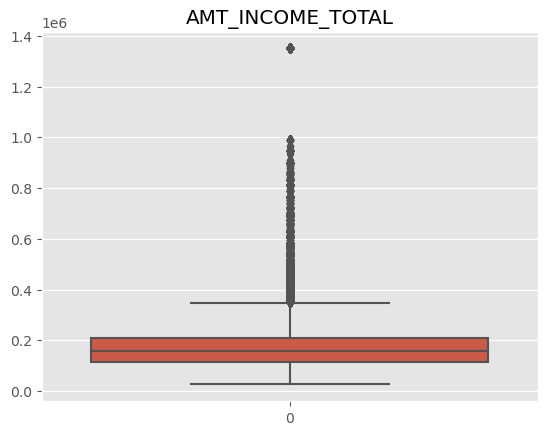

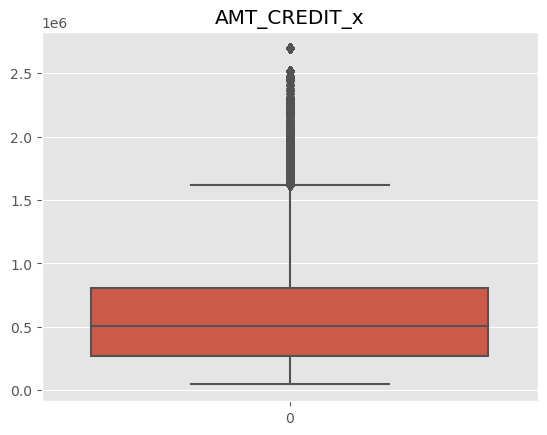

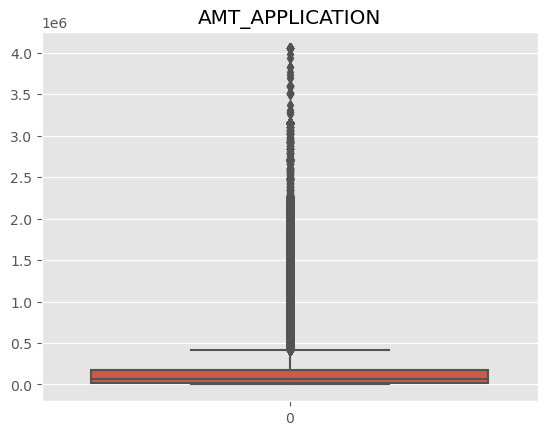

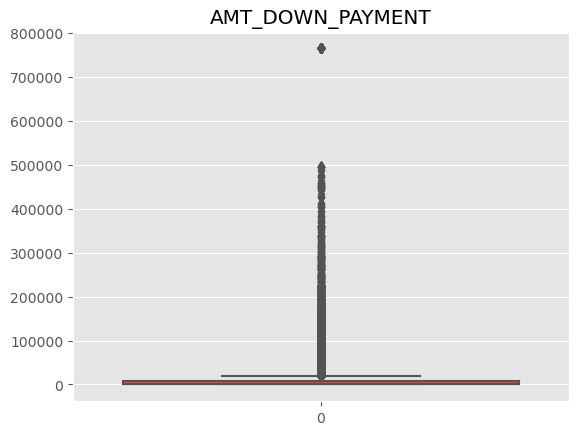

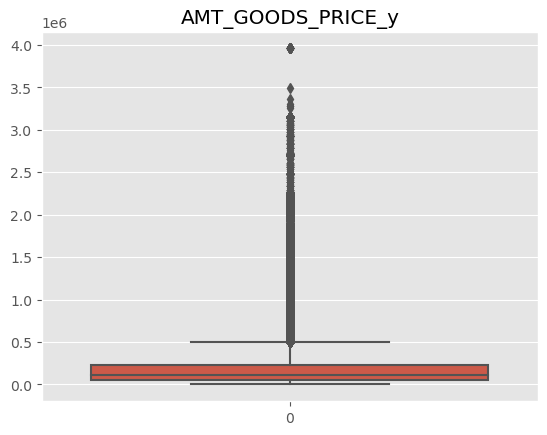

In [707]:
for i in cont_cols:
    sns.boxplot(merge_app[i])
    plt.title(i)
    plt.show()

**The outliers for merge dataset seem to be fine and I decide not to remove or cap any**

### UNIVARIATE ANALYSIS ON MERGED DATASET

#### 1. NAME_CONTRACT_STATUS 

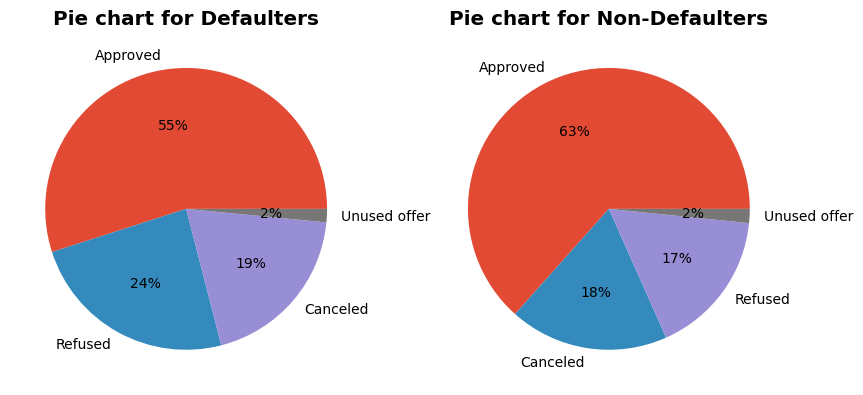

In [708]:
# Filtering merged data on TARGET
merge_default=merge_app[merge_app["TARGET"]==1]
merge_non_default=merge_app[merge_app["TARGET"]==0]

#Plotting pie charts for observing relation between NAME_CONTRACT_STATUS and TARGET
plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
labels_def= merge_default["NAME_CONTRACT_STATUS"].value_counts().index
plt.pie(merge_default["NAME_CONTRACT_STATUS"].value_counts(), autopct='%.0f%%',labels=labels_def)
plt.title("Pie chart for Defaulters", fontweight="heavy")

plt.subplot(1, 2, 2)
labels_def1= merge_non_default["NAME_CONTRACT_STATUS"].value_counts().index
plt.pie(merge_non_default["NAME_CONTRACT_STATUS"].value_counts(), autopct='%.0f%%',labels=labels_def1)
plt.title("Pie chart for Non-Defaulters", fontweight="heavy")
plt.show()

**Conclusions**:It clearly shows that non-defaulters have more percentage of previous approved loans and defaulters have more percentage of previous refused/rejected loans


#### 2. NAME_CLIENT_TYPE 

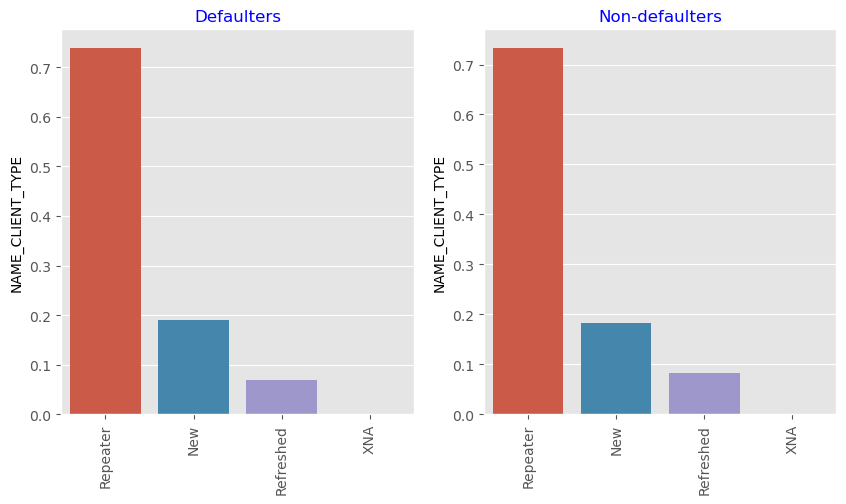

In [709]:
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
h = merge_default["NAME_CLIENT_TYPE"].value_counts(normalize=True)
sns.barplot(x=h.index, y=h)  
plt.xticks(rotation=90)
plt.title("Defaulters", fontdict={"fontsize": 12, "fontweight": 10, "color": "blue"})

plt.subplot(1, 2, 2)
g = merge_non_default["NAME_CLIENT_TYPE"].value_counts(normalize=True)
sns.barplot(x=g.index, y=g)  
plt.xticks(rotation=90)
plt.title("Non-defaulters", fontdict={"fontsize": 12, "fontweight": 10, "color": "blue"})

plt.show()

**Conclusion**: There is no measurable difference between client types of defaulters and non-defaulter

#### 3. NAME_CONTRACT_TYPE_y 

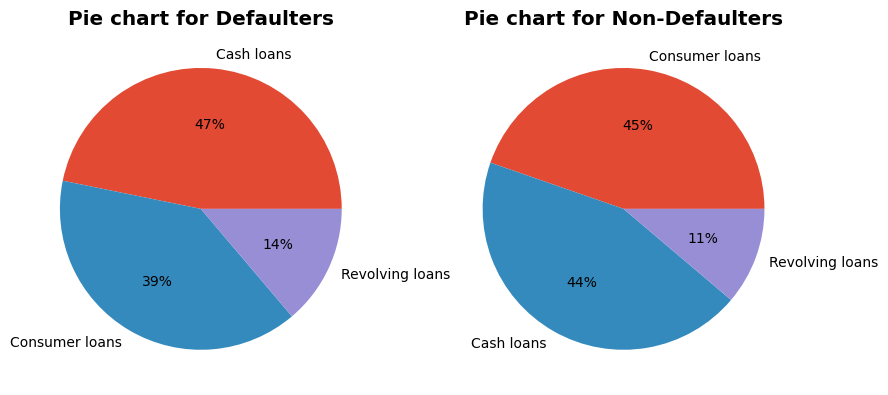

In [710]:
#Plotting pie charts for observing relation between NAME_CONTRACT_STATUS and TARGET
plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
labels_def= merge_default["NAME_CONTRACT_TYPE_y"].value_counts().index
plt.pie(merge_default["NAME_CONTRACT_TYPE_y"].value_counts(), autopct='%.0f%%',labels=labels_def)
plt.title("Pie chart for Defaulters", fontweight="heavy")

plt.subplot(1, 2, 2)
labels_def1= merge_non_default["NAME_CONTRACT_TYPE_y"].value_counts().index
plt.pie(merge_non_default["NAME_CONTRACT_TYPE_y"].value_counts(), autopct='%.0f%%',labels=labels_def1)
plt.title("Pie chart for Non-Defaulters", fontweight="heavy")
plt.show()

**Clearly consumer loans have more percentage of non-defaulters than percentage of defaulters**

### MULTIVARIATE ANALYSIS ON MERGED DATASET

#### 1. NAME_CONTRACT_STATUS V/S TARGET V/S AMT_INCOME_TOTAL

In [712]:
income1=pd.pivot_table(data=merge_app,values="AMT_INCOME_TOTAL",index="TARGET",columns="NAME_CONTRACT_STATUS",aggfunc=np.mean)
income1

NAME_CONTRACT_STATUS,Approved,Canceled,Refused,Unused offer
TARGET,,,,
0,170151.269369,178095.024036,179728.290798,171568.249024
1,166264.642257,172689.129265,172283.276394,169656.230032


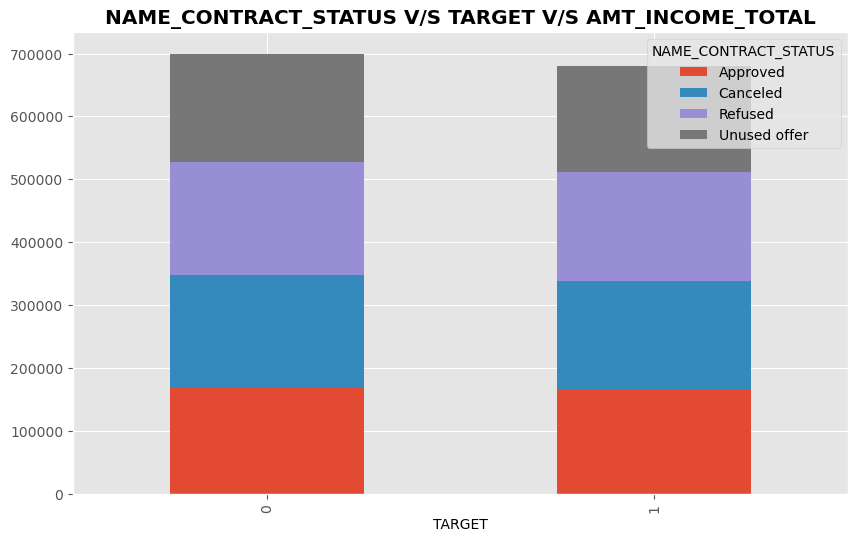

In [713]:
income1.plot(kind="bar",stacked="True",figsize=[10,6])
plt.title("NAME_CONTRACT_STATUS V/S TARGET V/S AMT_INCOME_TOTAL", fontweight="heavy")
plt.show()

**Conclusion**:No major impact is observed of Total income on contract staus for defaulters and non-defaulters

#### 2. NAME_CONTRACT_STATUS V/S TARGET V/S AMT_APPLICATION

In [714]:
application=pd.pivot_table(data=merge_app,values="AMT_APPLICATION",index="TARGET",columns="NAME_CONTRACT_STATUS",aggfunc=np.mean)
application

NAME_CONTRACT_STATUS,Approved,Canceled,Refused,Unused offer
TARGET,,,,
0,180379.716447,23751.054725,334259.296207,69928.667486
1,168724.795535,18483.056628,301616.357263,67566.294441


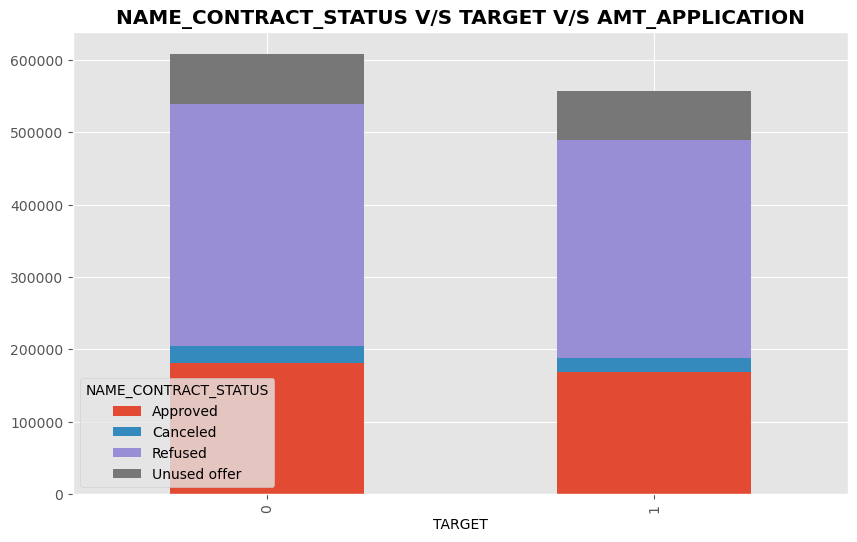

In [715]:
application.plot(kind="bar",stacked="True",figsize=[10,6])
plt.title("NAME_CONTRACT_STATUS V/S TARGET V/S AMT_APPLICATION", fontweight="heavy")
plt.show()

**Conclusion**: Previous refused loans for non-defaulters had application amount in range of 2,00,000 to 5,50,000 (approx.) and Previous refused loans for defaulters had application amount in range 1,90,000 to 4,90,000(approx.).

#### 3. NAME_CONTRACT_STATUS V/S TARGET V/S AMT_DOWN_PAYMENT

In [716]:
down=pd.pivot_table(data=merge_app,values="AMT_DOWN_PAYMENT",index="TARGET",columns="NAME_CONTRACT_STATUS",aggfunc=np.mean)
down

NAME_CONTRACT_STATUS,Approved,Canceled,Refused,Unused offer
TARGET,,,,
0,6907.112274,23137.398019,7136.319961,1.366568
1,5568.097007,9844.863047,5515.130887,0.000000


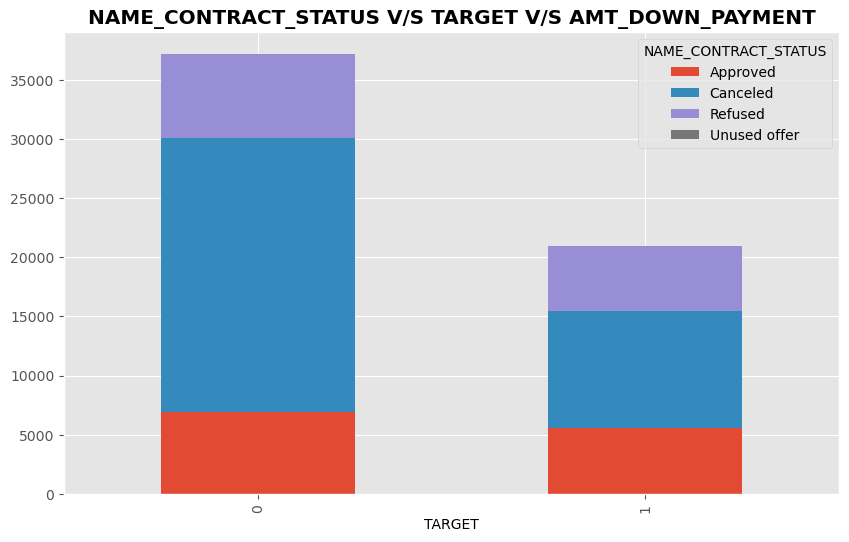

In [717]:
down.plot(kind="bar",stacked="True",figsize=[10,6])
plt.title("NAME_CONTRACT_STATUS V/S TARGET V/S AMT_DOWN_PAYMENT", fontweight="heavy")
plt.show()

**Conclusion**: 
1. Previous approved loans for non-defaulters had down payment amount in range of 0 to 7,000 (approx.) and previous approved loans for defaulters had down payment amount in range of 0 to 6,000 (approx.).
2. Previous refused loans for non-defaulters had Down payment amount in range of 28,000 to 36,000 (approx.) and previous refused loans for defaulters had down payment amount in range of 15,000 to 21,000 (approx.)

#### 4. AMT_INCOME_TOTAL V/S TARGET V/S AGE_GROUP

In [718]:
age=pd.pivot_table(data=merge_app,values="AMT_INCOME_TOTAL",index="TARGET",columns="AGE_GROUP",aggfunc=np.mean)
age

AGE_GROUP,below 30,30-60,60+
TARGET,,,
0,166057.421833,178529.183802,147728.789511
1,157175.579185,174434.090787,146124.609802


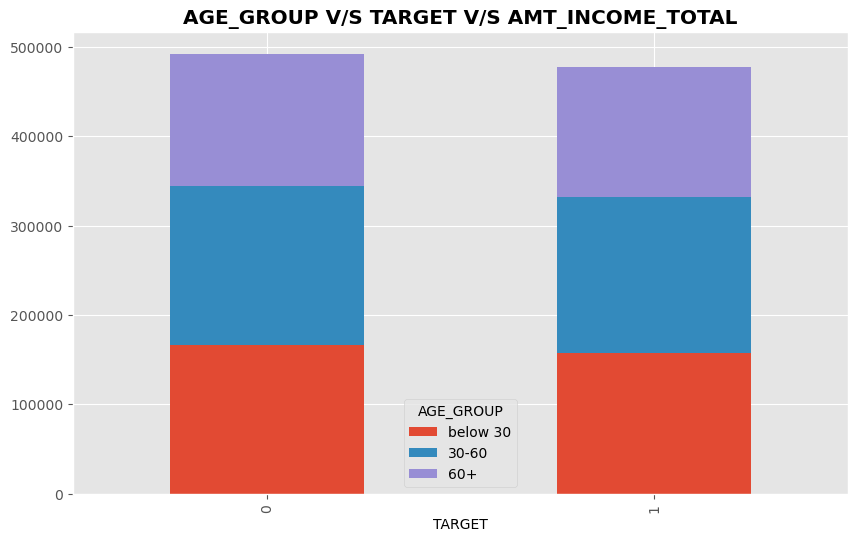

In [719]:
age.plot(kind="bar",stacked="True",figsize=[10,6])
plt.title("AGE_GROUP V/S TARGET V/S AMT_INCOME_TOTAL", fontweight="heavy")
plt.show()

**Conclusion**: Non-defaulters above 60 years of age had income in range of 3,50,000 to 4,80,000 (approx.) and Defaulters above 60 years of age had total income in range of 3,40,000(approx.) and 4,90,000(approx.). **Hence defaulters of age above 60 have less income than non-defaulters of age above 60**

#### 5. NAME_EDUCATION_TYPE V/S TARGET V/S AMT_APPLICATION

In [720]:
edu=pd.pivot_table(data=merge_app,values="AMT_APPLICATION",index="TARGET",columns="NAME_EDUCATION_TYPE",aggfunc=np.mean)
edu

NAME_EDUCATION_TYPE,Academic degree,Higher education,Incomplete higher,Lower secondary,Secondary / secondary special
TARGET,,,,,
0,212945.817733,201330.599561,169262.121012,145895.691778,168494.877269
1,108197.505000,198874.276887,166072.071902,127337.436564,165283.233845


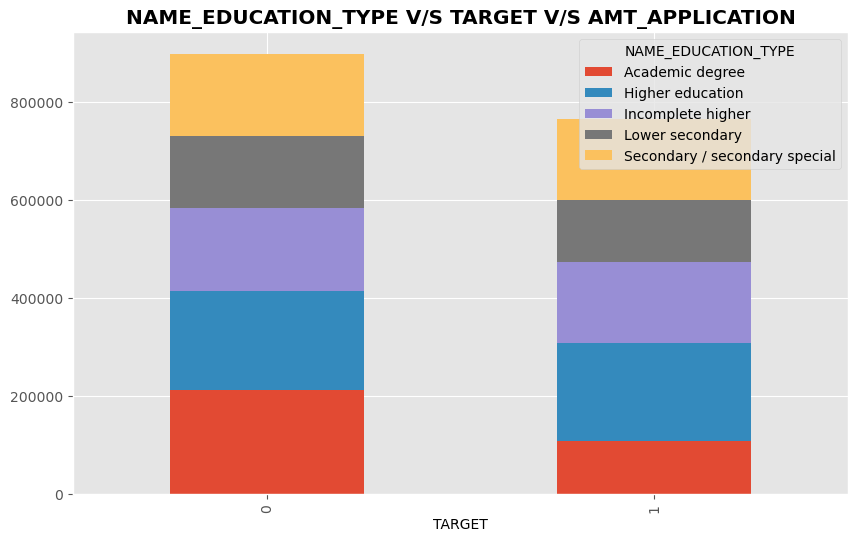

In [721]:
edu.plot(kind="bar",stacked="True",figsize=[10,6])
plt.title("NAME_EDUCATION_TYPE V/S TARGET V/S AMT_APPLICATION", fontweight="heavy")
plt.show()

**Conclusion**: Non-Defaulters with secondary education had appllication amount in range 7,00,000 to 9,00,000 and defaulters with secondary education had application amount in range 6,00,000 to 7,00,000(approx.). **Hence non-defaulters with secondary education have more application amount than defaulters with secondary education.**

#### 6. AMT_CREDIT_x V/S TARGET V/S NAME_FAMILY_STATUS

In [722]:
fam=pd.pivot_table(data=merge_app,values="AMT_CREDIT_x",index="TARGET",columns="NAME_FAMILY_STATUS",aggfunc=np.mean)
fam

NAME_FAMILY_STATUS,Civil marriage,Married,Separated,Single / not married,Widow
TARGET,,,,,
0,541227.866736,631248.001206,541384.744918,496690.885781,485514.805975
1,508611.109922,594863.524168,514407.840472,477326.824069,516004.471785


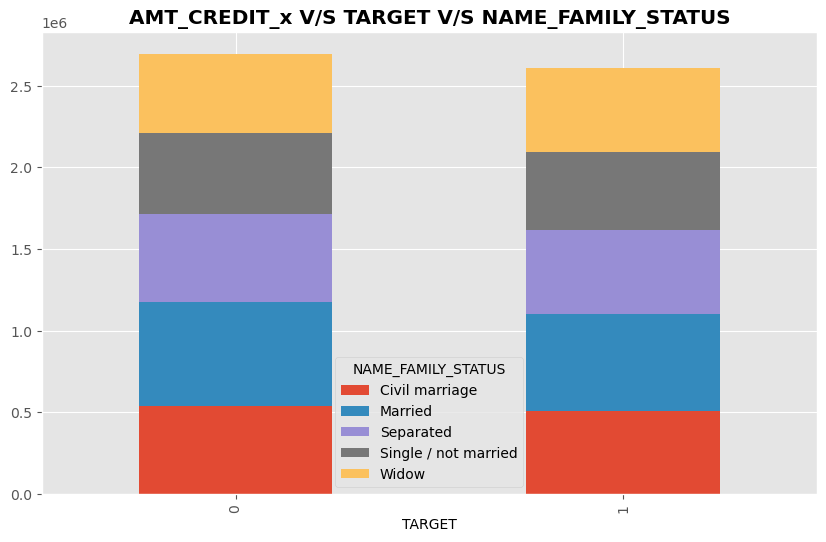

In [723]:
fam.plot(kind="bar",stacked="True",figsize=[10,6])
plt.title("AMT_CREDIT_x V/S TARGET V/S NAME_FAMILY_STATUS", fontweight="heavy")
plt.show()

**Conclusion**: Widowed non-defaulters have credit amount in range 2.25 million to 2.75 million (approx) and widowed defaulters have widowed defaulters have credit amount in range 2.1 million to 2,6 million(approx.) .**Hence widowed defaulters had less credit amount than widowed non-defaulters.**

#### 7. AMT_INCOME_TOTAL V/S TARGET V/S CODE_GENDER

In [724]:
gen=pd.pivot_table(data=merge_app,values="AMT_INCOME_TOTAL",index="TARGET",columns="CODE_GENDER",aggfunc=np.mean)
gen

CODE_GENDER,F,M
TARGET,,
0,161956.612778,197536.944481
1,157511.404556,185931.335292


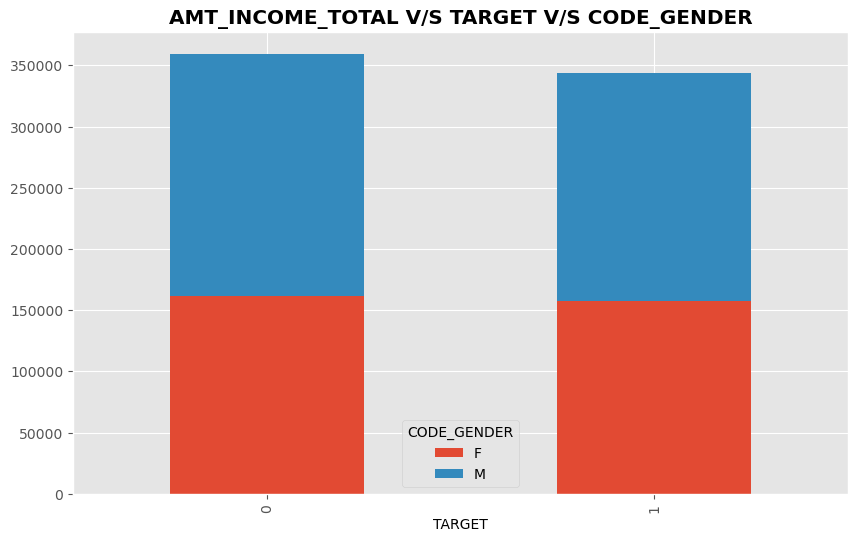

In [725]:
gen.plot(kind="bar",stacked="True",figsize=[10,6])
plt.title("AMT_INCOME_TOTAL V/S TARGET V/S CODE_GENDER", fontweight="heavy")
plt.show()

**Conclusion**: Male Defaulters have less income as compared to male non-defaulters